In [16]:
import torch
print(torch.cuda.is_available())  # Should return True if CUDA is available
print(torch.cuda.get_device_name(0))  # Should print the name of your GPU

True
NVIDIA GeForce RTX 3060 Laptop GPU


In [2]:
# from ucimlrepo import fetch_ucirepo 
  
# # Fetch the dataset with ID 352 from the UCI ML repository
# online_retail = fetch_ucirepo(id=352) 
  
# # Data is loaded into pandas DataFrames
# X = online_retail.data.features  # Features DataFrame
# y = online_retail.data.targets    # Targets DataFrame
  
# # Print metadata about the dataset
# print(online_retail.metadata) 
  
# # Print detailed variable information
# print(online_retail.variables) 

In [3]:
# print(online_retail)

In [17]:
import pandas as pd
import os
import json
from glob import glob

def get_feature_names(directory):
    all_files = glob(os.path.join(directory, "*.json"))
    first_file = all_files[0]
    
    with open(first_file, 'r') as file:
        data = json.load(file)
        
    feature_names = list(data[0].keys())
    return feature_names

def load_json_files_by_position(directory, feature_names):
    all_files = glob(os.path.join(directory, "*.json"))
    df_list = []
    
    for file in all_files:
        with open(file, 'r') as f:
            data = json.load(f)
            data_by_position = [list(entry.values()) for entry in data]
            df = pd.DataFrame(data_by_position, columns=feature_names)
            df_list.append(df)
    
    df = pd.concat(df_list, ignore_index=True)
    
    # Clean invoice IDs by removing letters
    df['invoice'] = df['invoice'].str.replace(r'\D', '', regex=True)
    
    # Convert relevant columns to numeric types
    df['customer_id'] = pd.to_numeric(df['customer_id'], errors='coerce')
    df['price'] = pd.to_numeric(df['price'], errors='coerce')
    df['times_viewed'] = pd.to_numeric(df['times_viewed'], errors='coerce')
    
    # Create a datetime column
    df['InvoiceDate'] = pd.to_datetime(df[['year', 'month', 'day']])
    
    return df

# Example usage
directory = 'data'
feature_names = get_feature_names(directory)
df = load_json_files_by_position(directory, feature_names)

print(df.head())
print(df.info())

          country  customer_id invoice  price stream_id  times_viewed  year  \
0  United Kingdom      13085.0  489434   6.95     85048            12  2017   
1  United Kingdom          NaN  489597   8.65     22130             1  2017   
2  United Kingdom          NaN  489597   1.70     22132             6  2017   
3  United Kingdom          NaN  489597   1.70     22133             4  2017   
4  United Kingdom          NaN  489597   0.87     22134             1  2017   

  month day InvoiceDate  
0    11  28  2017-11-28  
1    11  28  2017-11-28  
2    11  28  2017-11-28  
3    11  28  2017-11-28  
4    11  28  2017-11-28  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 815011 entries, 0 to 815010
Data columns (total 10 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   country       815011 non-null  object        
 1   customer_id   625249 non-null  float64       
 2   invoice       815011 non-null  object        
 3 

In [5]:
df

,country,customer_id,invoice,price,stream_id,times_viewed,year,month,day,InvoiceDate
0,United Kingdom,13085.0,489434,6.95,85048,12,2017,11,28,2017-11-28
1,United Kingdom,NaN,489597,8.65,22130,1,2017,11,28,2017-11-28
2,United Kingdom,NaN,489597,1.70,22132,6,2017,11,28,2017-11-28
3,United Kingdom,NaN,489597,1.70,22133,4,2017,11,28,2017-11-28
4,United Kingdom,NaN,489597,0.87,22134,1,2017,11,28,2017-11-28
...,...,...,...,...,...,...,...,...,...,...
815006,United Kingdom,15628.0,562163,0.85,21544,12,2019,07,31,2019-07-31
815007,United Kingdom,15628.0,562163,1.95,47591D,8,2019,07,31,2019-07-31
815008,United Kingdom,15628.0,562163,0.83,23167,12,2019,07,31,2019-07-31
815009,United Kingdom,15628.0,562163,4.95,22138,3,2019,07,31,2019-07-31


In [ ]:
# import os
# import json

# def prepare_data_for_api(df, countries, output_directory):
#     if not os.path.exists(output_directory):
#         os.makedirs(output_directory)

#     # data_for_api = []

#     for country in countries:
#         country_data = df[df['country'] == country]

#         # Convert the data to the required format for the API
#         historical_data = [
#             {"date": row[9].strftime("%Y-%m-%d"), "price": row["price"]}
#             for _, row in country_data.iterrows()
#         ]
        
#         api_input = {
#             "country": country,
#             "historical_data": historical_data
#         }
        
#         # Save the API input data as a JSON file
#         output_file = os.path.join(output_directory, f"{country.replace(' ', '_')}.json")
#         with open(output_file, 'w') as json_file:
#             json.dump(api_input, json_file, indent=4)
            
#         print(f"Prepared and saved data for {country} to {output_file}")

#     # return data_for_api

In [ ]:
# output_directory = 'output'

# countries = [
#     "United Kingdom",
#     "EIRE",
#     "Germany",
#     "France",
#     "Norway",
#     "Spain",
#     "Hong Kong",
#     "Portugal",
#     "Singapore",
#     "Netherlands"
# ]

# prepare_data_for_api(df, countries, output_directory)

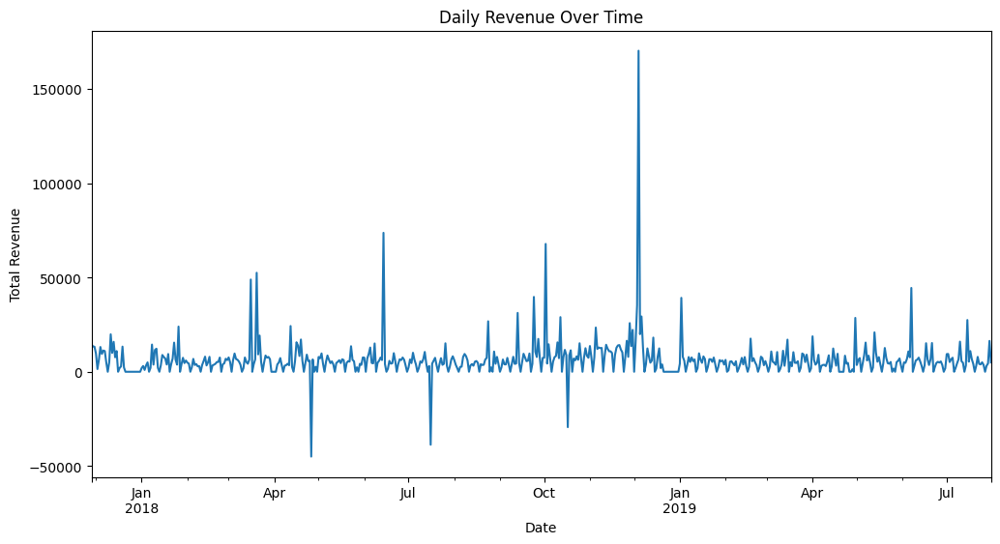

In [6]:
import matplotlib.pyplot as plt

# Revenue is now calculated by summing the 'price' column per day
daily_revenue = df.resample('D', on='InvoiceDate')['price'].sum()

# Plot daily revenue over time
daily_revenue.plot(figsize=(12, 6))
plt.title('Daily Revenue Over Time')
plt.ylabel('Total Revenue')
plt.xlabel('Date')
plt.show()

In [ ]:
# # Group by country and date, then sum the revenue and total times viewed
# daily_revenue = df.groupby(['country', 'InvoiceDate']).agg({
#     'price': 'sum',  # Sum the revenue
#     'times_viewed': 'sum'  # Sum the times viewed
# }).reset_index()

# # Optionally, you can resample by date if you need daily data
# daily_revenue = daily_revenue.set_index('InvoiceDate').resample('D').sum().reset_index()

# # Inspect the new DataFrame
# print(daily_revenue.head())

# # You can now use this DataFrame for further analysis or modeling

In [ ]:
# # Identify days with negative revenue
# negative_revenue = daily_revenue[daily_revenue < 0]

# # Plot negative revenue
# negative_revenue.plot(kind='bar', figsize=(12, 6))
# plt.title('Days with Negative Revenue')
# plt.ylabel('Total Revenue')
# plt.xlabel('Date')
# plt.show()

# # Display the negative revenue dates and values
# print(negative_revenue)

In [ ]:
# # Investigate transactions on specific dates with negative revenue
# negative_dates = ['2018-04-26', '2018-07-16', '2018-10-17']
# negative_transactions = df[df['InvoiceDate'].isin(negative_dates)]

# # pd.set_option('display.max_rows', True)
# # pd.set_option('display.max_columns', None)

# # Display the transactions
# negative_transactions

In [ ]:
# # Resample by month-end to calculate monthly revenue
# monthly_revenue = df.resample('ME').sum()

# # Plot monthly revenue over time
# monthly_revenue.plot(figsize=(12, 6))
# plt.title('Monthly Revenue Over Time')
# plt.ylabel('Total Revenue')
# plt.xlabel('Date')
# plt.show()

NameError: name 'plt' is not defined

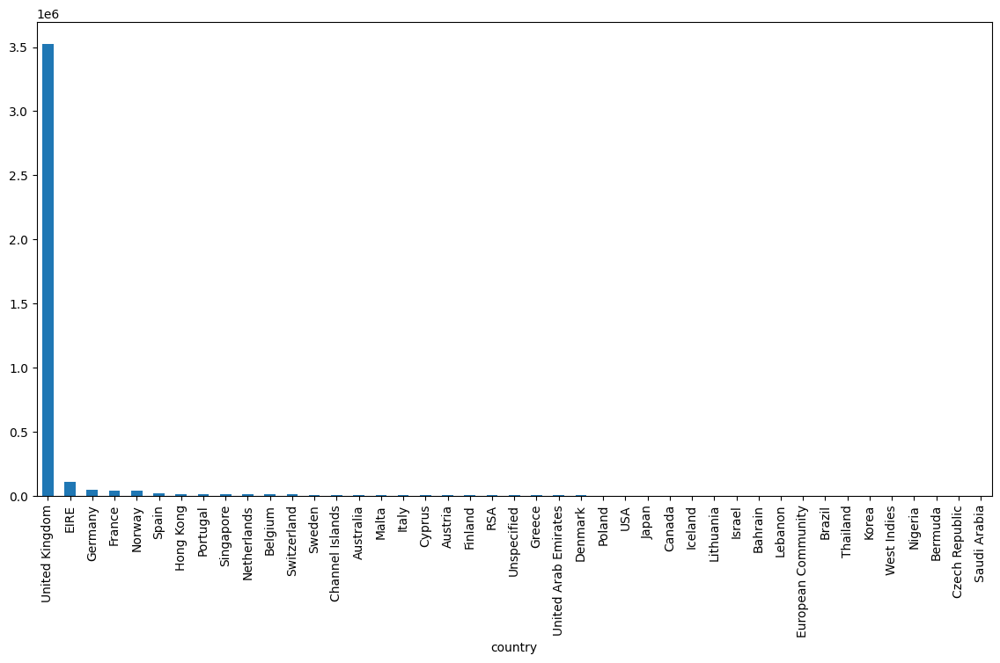

In [19]:
# Calculate revenue by country (summed over the entire period)
country_revenue = df.groupby('country')['price'].sum().sort_values(ascending=False)

# Plot revenue by country
country_revenue.plot(kind='bar', figsize=(14, 7))
plt.title('Revenue by Country')
plt.ylabel('Total Revenue')
plt.xlabel('Country')
plt.show()

In [8]:
country_revenue[:10]

country
United Kingdom    3521513.505
EIRE               107069.210
Germany             49271.821
France              40565.140
Norway              38494.750
Spain               16040.990
Hong Kong           14452.570
Portugal            13528.670
Singapore           13175.920
Netherlands         12322.800
Name: price, dtype: float64

In [20]:
df

,country,customer_id,invoice,price,stream_id,times_viewed,year,month,day,InvoiceDate
0,United Kingdom,13085.0,489434,6.95,85048,12,2017,11,28,2017-11-28
1,United Kingdom,NaN,489597,8.65,22130,1,2017,11,28,2017-11-28
2,United Kingdom,NaN,489597,1.70,22132,6,2017,11,28,2017-11-28
3,United Kingdom,NaN,489597,1.70,22133,4,2017,11,28,2017-11-28
4,United Kingdom,NaN,489597,0.87,22134,1,2017,11,28,2017-11-28
...,...,...,...,...,...,...,...,...,...,...
815006,United Kingdom,15628.0,562163,0.85,21544,12,2019,07,31,2019-07-31
815007,United Kingdom,15628.0,562163,1.95,47591D,8,2019,07,31,2019-07-31
815008,United Kingdom,15628.0,562163,0.83,23167,12,2019,07,31,2019-07-31
815009,United Kingdom,15628.0,562163,4.95,22138,3,2019,07,31,2019-07-31


In [20]:
def create_lag_features(df, lags):
    for lag in lags:
        df[f'revenue_lag_{lag}'] = df.iloc[:, 0].shift(lag) 
    return df

country_lagged_revenues = {}

for country in dict(country_revenue[:10]):
    country_daily_revenue = df[df['country'] == country].resample('D', on='InvoiceDate')['price'].sum()
    # print(country_daily_revenue)
    lags = list(range(1, 31))
    # print(lags)    
    country_lagged_revenue = create_lag_features(country_daily_revenue.to_frame(), lags)
    country_lagged_revenue.dropna(inplace=True)
    country_lagged_revenues[country]=country_lagged_revenue

country_lagged_revenues

{'United Kingdom':                 price  revenue_lag_1  revenue_lag_2  revenue_lag_3  \
 InvoiceDate                                                          
 2017-12-28       0.00           0.00           0.00           0.00   
 2017-12-29       0.00           0.00           0.00           0.00   
 2017-12-30       0.00           0.00           0.00           0.00   
 2017-12-31       0.00           0.00           0.00           0.00   
 2018-01-01    1936.26           0.00           0.00           0.00   
 ...               ...            ...            ...            ...   
 2019-07-27       0.00        3378.21        3967.24        3477.53   
 2019-07-28    2656.70           0.00        3378.21        3967.24   
 2019-07-29    4124.82        2656.70           0.00        3378.21   
 2019-07-30   15260.12        4124.82        2656.70           0.00   
 2019-07-31    4844.04       15260.12        4124.82        2656.70   
 
              revenue_lag_4  revenue_lag_5  revenue_lag_6

In [29]:
import warnings
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt

# Suppress FutureWarnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Dictionary to store results
results = {}

for country, df in country_lagged_revenues.items():

    print(country)

    # Apply ADF test to check for stationarity
    result = adfuller(df['price'])
    adf_statistic, p_value, used_lag, n_obs, critical_values, icbest = result
    
    # Store ADF test results
    results[country] = {
        'ADF Statistic': adf_statistic,
        'p-value': p_value,
        'Critical Values': critical_values
    }
    
    if p_value > 0.05:
        print(f'{country} series is non-stationary. Consider differencing or transforming the data.')
        results[country]['Stationarity'] = 'Non-Stationary'
        continue  # Skip to the next country if the series is non-stationary

    results[country]['Stationarity'] = 'Stationary'

    print(results[country])
    
    # X = df.drop('price', axis=1)
    # y = df['price']

    # # Train-test split
    # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    # # Train a model (Random Forest example)
    # model = RandomForestRegressor(n_estimators=100, random_state=42)
    # model.fit(X_train, y_train)

    # # Predict on the test set
    # y_pred = model.predict(X_test)

    # # Evaluate the model using the updated method
    # rmse = mean_squared_error(y_test, y_pred, squared=False)
    # mae = mean_absolute_error(y_test, y_pred)
    # r2 = r2_score(y_test, y_pred)

    # # Store evaluation metrics
    # results[country]['RMSE'] = rmse
    # results[country]['MAE'] = mae
    # results[country]['R^2'] = r2

    # Plot actual vs predicted revenue for the specific country
    # plt.figure(figsize=(14, 7))
    # plt.plot(y_test.index, y_test, label='Actual Revenue')
    # plt.plot(y_test.index, y_pred, label='Predicted Revenue', linestyle='--')
    # plt.legend()
    # plt.title(f'Actual vs Predicted Revenue for {country}')
    # plt.xlabel('Date')
    # plt.ylabel('Revenue')
    # plt.show()

# print(results) 

# Now you can inspect the results or save them to a file
# import pickle

# # Save the results dictionary to a file
# with open('country_results.pkl', 'wb') as f:
#     pickle.dump(results, f)

United Kingdom
{'ADF Statistic': -14.381026859990206, 'p-value': 9.152562572272447e-27, 'Critical Values': {'1%': -3.441694608475642, '5%': -2.866544718556839, '10%': -2.5694353738653684}, 'Stationarity': 'Stationary'}
EIRE
{'ADF Statistic': -23.294919944875485, 'p-value': 0.0, 'Critical Values': {'1%': -3.441734108219804, '5%': -2.8665621113012514, '10%': -2.5694446417404313}, 'Stationarity': 'Stationary'}
Germany
{'ADF Statistic': -24.409992965007287, 'p-value': 0.0, 'Critical Values': {'1%': -3.4416749612171467, '5%': -2.8665360672844318, '10%': -2.5694307639714626}, 'Stationarity': 'Stationary'}
France
{'ADF Statistic': -23.63513427106393, 'p-value': 0.0, 'Critical Values': {'1%': -3.4416749612171467, '5%': -2.8665360672844318, '10%': -2.5694307639714626}, 'Stationarity': 'Stationary'}
Norway
{'ADF Statistic': -23.708448640626838, 'p-value': 0.0, 'Critical Values': {'1%': -3.442039359113542, '5%': -2.8666965134862514, '10%': -2.5695162601790758}, 'Stationarity': 'Stationary'}
Spain

### Analysis Summary:
- **Stationarity**: All countries' revenue series were found to be stationary according to the ADF test (low p-values and strong ADF statistics).

             revenue_lag_1  revenue_lag_2  revenue_lag_3  revenue_lag_4  \
InvoiceDate                                                               
2017-12-28            0.00           0.00           0.00          0.000   
2017-12-29            0.00           0.00           0.00          0.000   
2017-12-30            0.00           0.00           0.00          0.000   
2017-12-31            0.00           0.00           0.00          0.000   
2018-01-01            0.00           0.00           0.00          0.000   
...                    ...            ...            ...            ...   
2019-07-27         3378.21        3967.24        3477.53       3888.371   
2019-07-28            0.00        3378.21        3967.24       3477.530   
2019-07-29         2656.70           0.00        3378.21       3967.240   
2019-07-30         4124.82        2656.70           0.00       3378.210   
2019-07-31        15260.12        4124.82        2656.70          0.000   

             revenue_lag

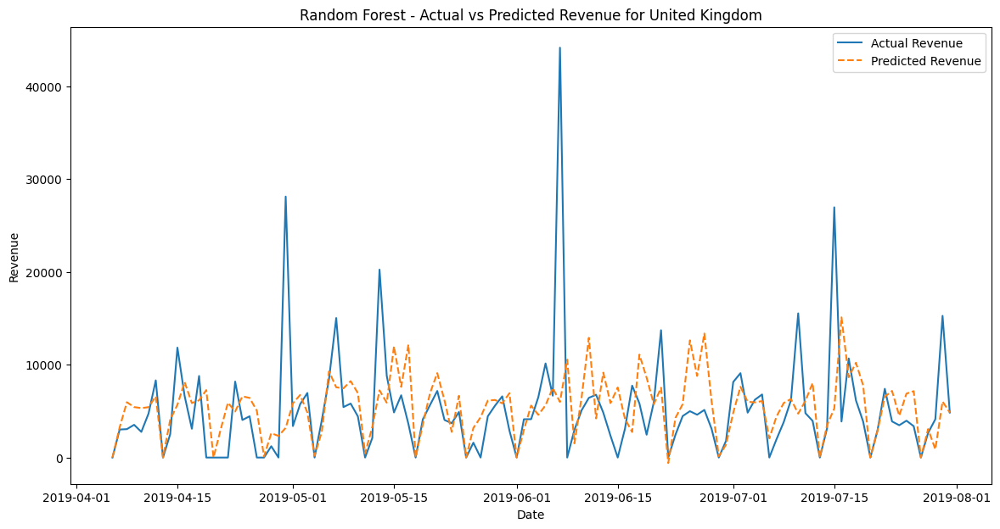

[Decision Tree] CV RMSE for United Kingdom: 12297.48049010208
[Decision Tree] CV MAE for United Kingdom: 5640.450539223936
[Decision Tree] CV R^2 for United Kingdom: -0.70444177992277
[Decision Tree] Test RMSE for United Kingdom: 11529.47005135978
[Decision Tree] Test MAE for United Kingdom: 5522.824854700855
[Decision Tree] Test R^2 for United Kingdom: -2.756637164733071


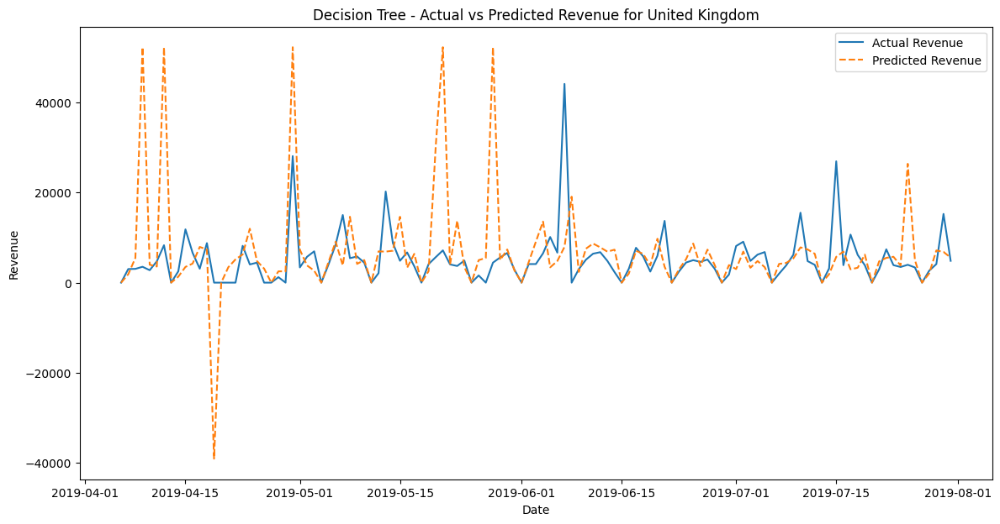

[Gradient Boosting] CV RMSE for United Kingdom: 9955.599929104803
[Gradient Boosting] CV MAE for United Kingdom: 4921.412314505279
[Gradient Boosting] CV R^2 for United Kingdom: -0.46934298441525496
[Gradient Boosting] Test RMSE for United Kingdom: 6894.413567215536
[Gradient Boosting] Test MAE for United Kingdom: 3852.030004796903
[Gradient Boosting] Test R^2 for United Kingdom: -0.34330682834323545


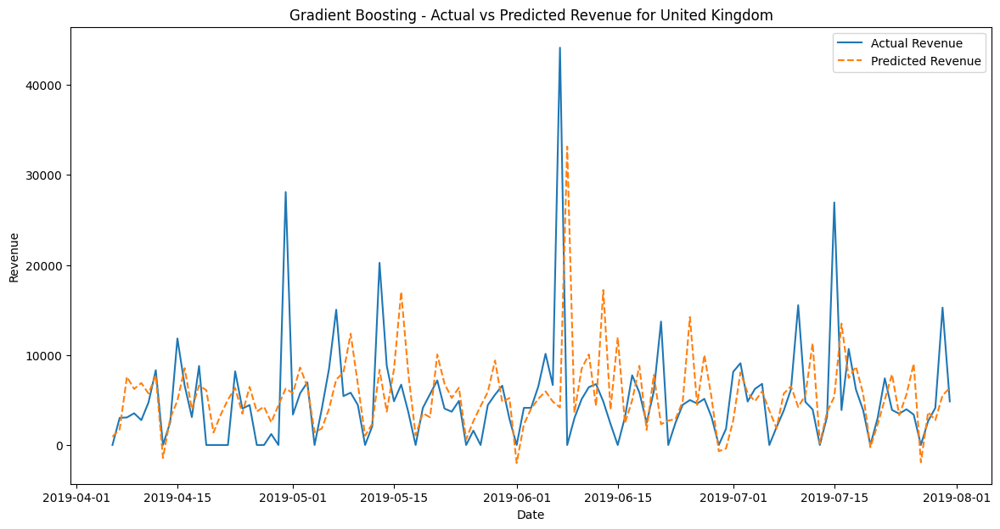

[Linear Regression] CV RMSE for United Kingdom: 9662.789810793054
[Linear Regression] CV MAE for United Kingdom: 4681.168092848241
[Linear Regression] CV R^2 for United Kingdom: -0.049806440160546715
[Linear Regression] Test RMSE for United Kingdom: 5936.608327200756
[Linear Regression] Test MAE for United Kingdom: 3465.8452388697874
[Linear Regression] Test R^2 for United Kingdom: 0.004004552228072944


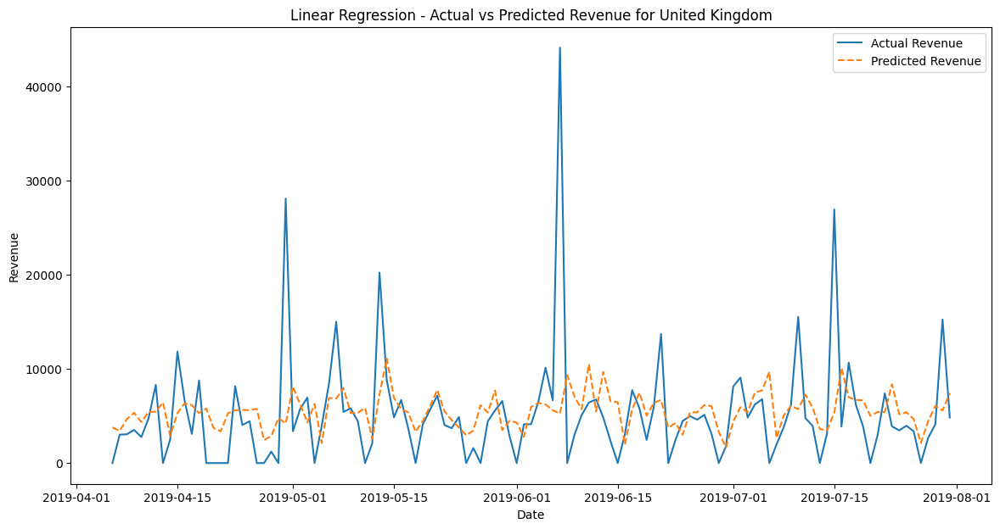

Running ARIMA model for United Kingdom
[ARIMA] RMSE for United Kingdom: 5946.4464300959235
[ARIMA] MAE for United Kingdom: 3547.214836249581
[ARIMA] R^2 for United Kingdom: 0.0007007045330033046


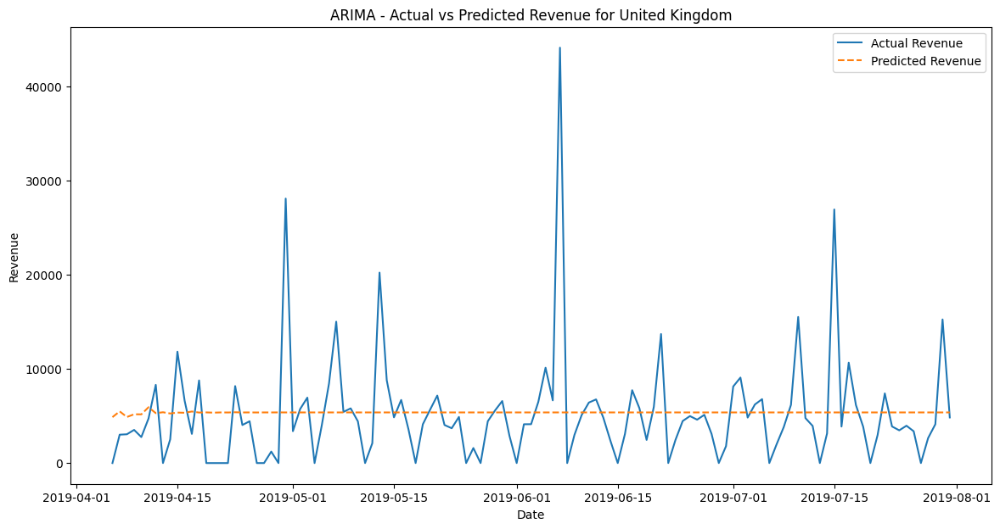

             revenue_lag_1  revenue_lag_2  revenue_lag_3  revenue_lag_4  \
InvoiceDate                                                               
2017-12-28            0.00           0.00           0.00           0.00   
2017-12-29            0.00           0.00           0.00           0.00   
2017-12-30            0.00           0.00           0.00           0.00   
2017-12-31            0.00           0.00           0.00           0.00   
2018-01-01            0.00           0.00           0.00           0.00   
...                    ...            ...            ...            ...   
2019-07-24           73.02           0.00           0.00           0.00   
2019-07-25           47.62          73.02           0.00           0.00   
2019-07-26          375.15          47.62          73.02           0.00   
2019-07-27           95.19         375.15          47.62          73.02   
2019-07-28            0.00          95.19         375.15          47.62   

             revenue_lag

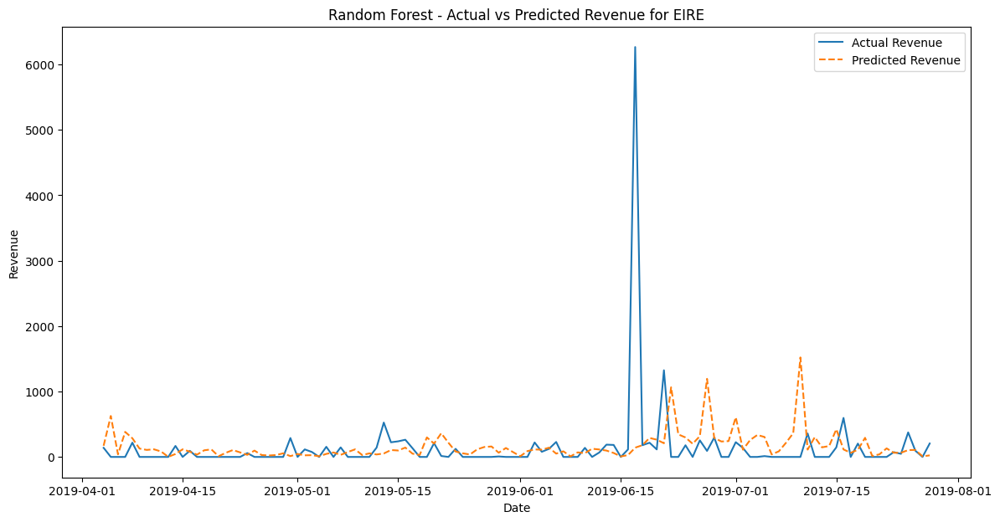

[Decision Tree] CV RMSE for EIRE: 1142.5126349733869
[Decision Tree] CV MAE for EIRE: 420.4993955119215
[Decision Tree] CV R^2 for EIRE: -3.2683781582135416
[Decision Tree] Test RMSE for EIRE: 622.6921970689189
[Decision Tree] Test MAE for EIRE: 171.97991379310344
[Decision Tree] Test R^2 for EIRE: -0.09898491677598087


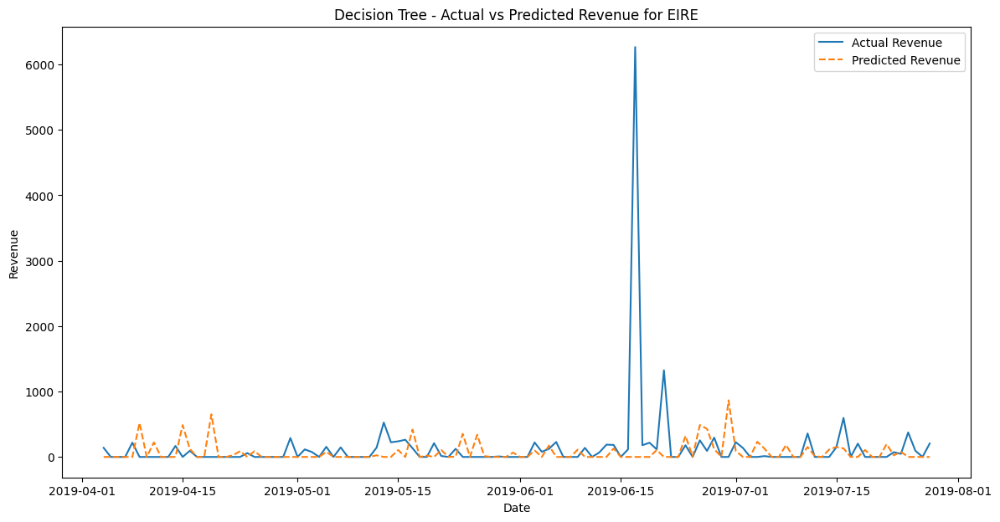

[Gradient Boosting] CV RMSE for EIRE: 643.866705186259
[Gradient Boosting] CV MAE for EIRE: 306.20678263328364
[Gradient Boosting] CV R^2 for EIRE: -0.39120357320650345
[Gradient Boosting] Test RMSE for EIRE: 603.6586148246624
[Gradient Boosting] Test MAE for EIRE: 183.72645156415356
[Gradient Boosting] Test R^2 for EIRE: -0.03282725604132941


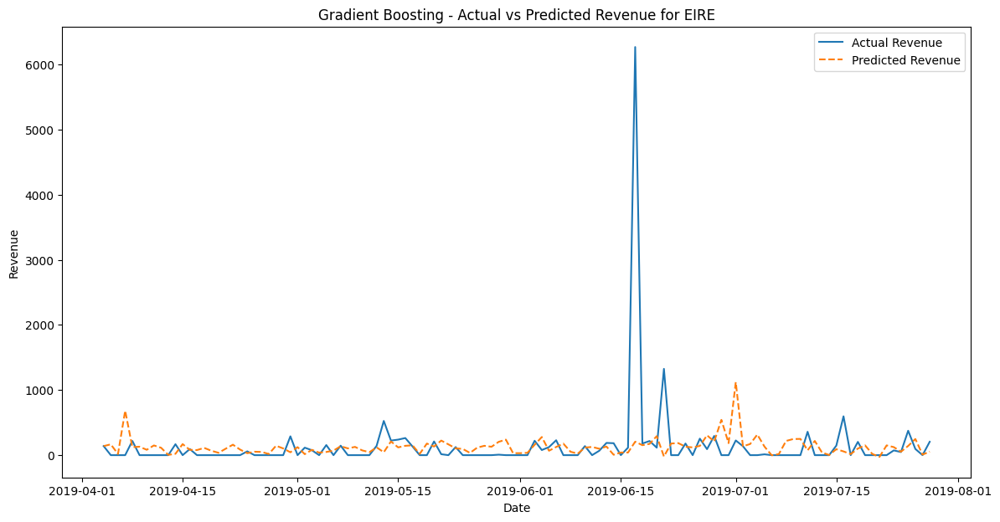

[Linear Regression] CV RMSE for EIRE: 603.9774160973685
[Linear Regression] CV MAE for EIRE: 257.9224165241145
[Linear Regression] CV R^2 for EIRE: -0.13158049899963054
[Linear Regression] Test RMSE for EIRE: 617.9522825247823
[Linear Regression] Test MAE for EIRE: 213.9935755603001
[Linear Regression] Test R^2 for EIRE: -0.08231771304855373


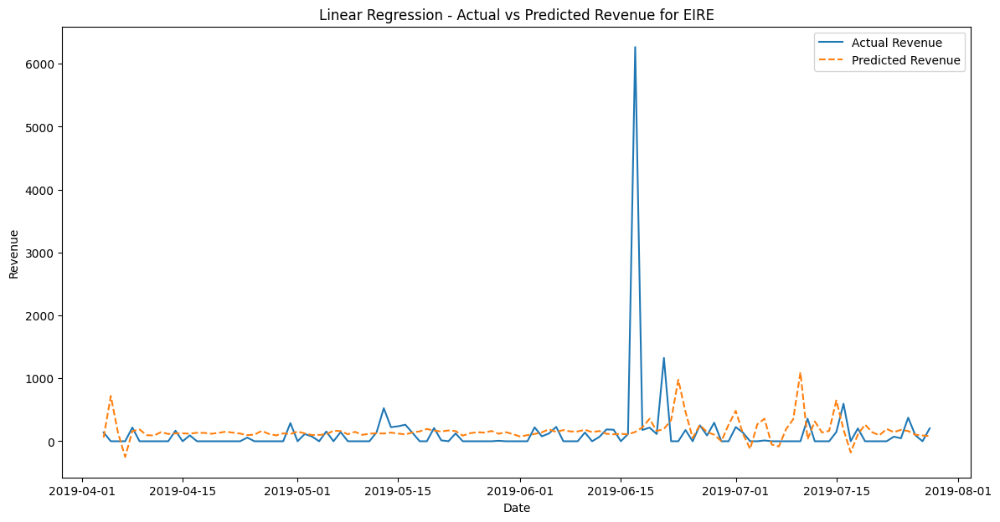

Running ARIMA model for EIRE
[ARIMA] RMSE for EIRE: 596.13299392026
[ARIMA] MAE for EIRE: 156.78097204007003
[ARIMA] R^2 for EIRE: -0.0072359151309961955


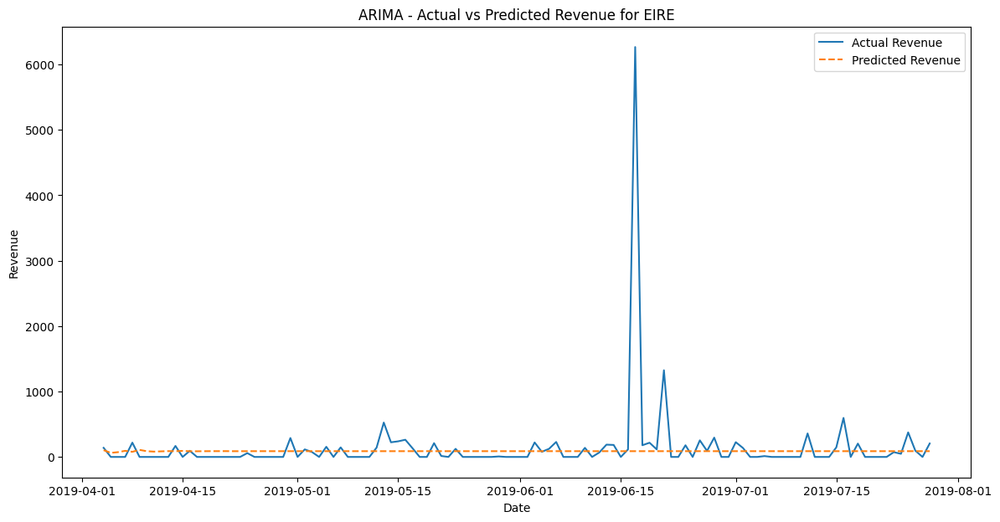

             revenue_lag_1  revenue_lag_2  revenue_lag_3  revenue_lag_4  \
InvoiceDate                                                               
2017-12-28            0.00           0.00           0.00           0.00   
2017-12-29            0.00           0.00           0.00           0.00   
2017-12-30            0.00           0.00           0.00           0.00   
2017-12-31            0.00           0.00           0.00           0.00   
2018-01-01            0.00           0.00           0.00           0.00   
...                    ...            ...            ...            ...   
2019-07-27           54.24          73.26          32.00          27.75   
2019-07-28            0.00          54.24          73.26          32.00   
2019-07-29            0.00           0.00          54.24          73.26   
2019-07-30          191.23           0.00           0.00          54.24   
2019-07-31          198.41         191.23           0.00           0.00   

             revenue_lag

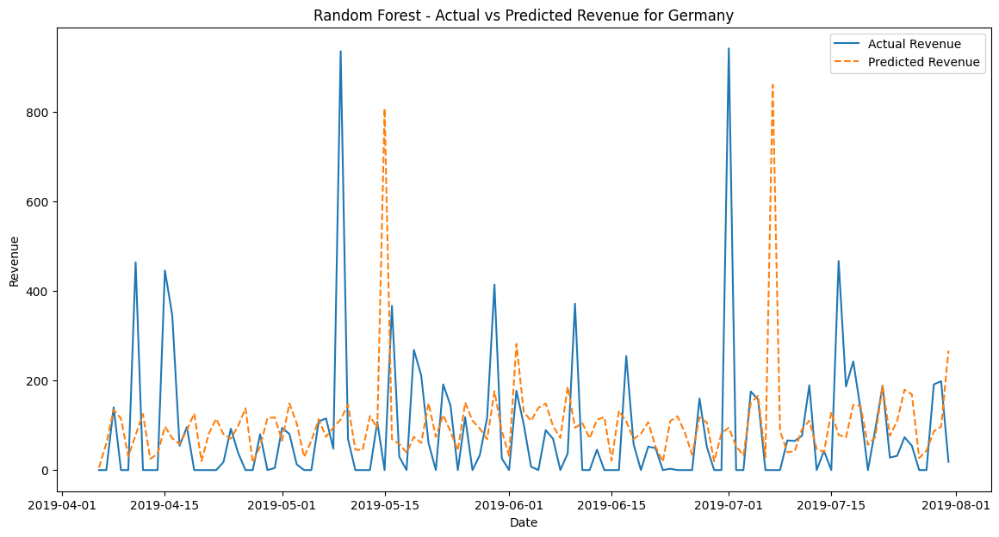

[Decision Tree] CV RMSE for Germany: 207.75708299396092
[Decision Tree] CV MAE for Germany: 111.54167517531555
[Decision Tree] CV R^2 for Germany: -1.4733419223145
[Decision Tree] Test RMSE for Germany: 279.33703997297465
[Decision Tree] Test MAE for Germany: 130.77009401709398
[Decision Tree] Test R^2 for Germany: -2.211169066108751


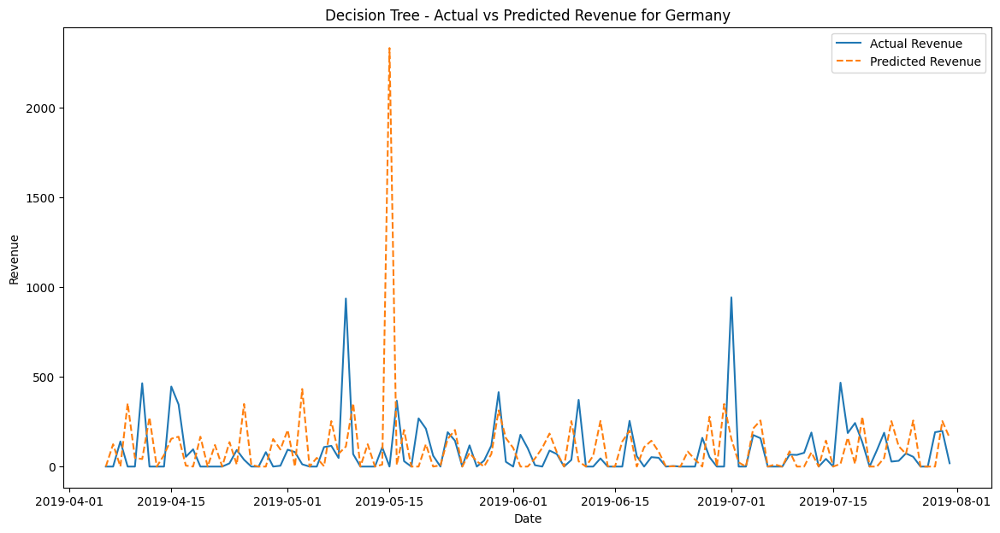

[Gradient Boosting] CV RMSE for Germany: 158.64363733747908
[Gradient Boosting] CV MAE for Germany: 90.2420265868648
[Gradient Boosting] CV R^2 for Germany: -0.34150234431679294
[Gradient Boosting] Test RMSE for Germany: 262.82425492092756
[Gradient Boosting] Test MAE for Germany: 120.06581358270861
[Gradient Boosting] Test R^2 for Germany: -1.8427390920209321


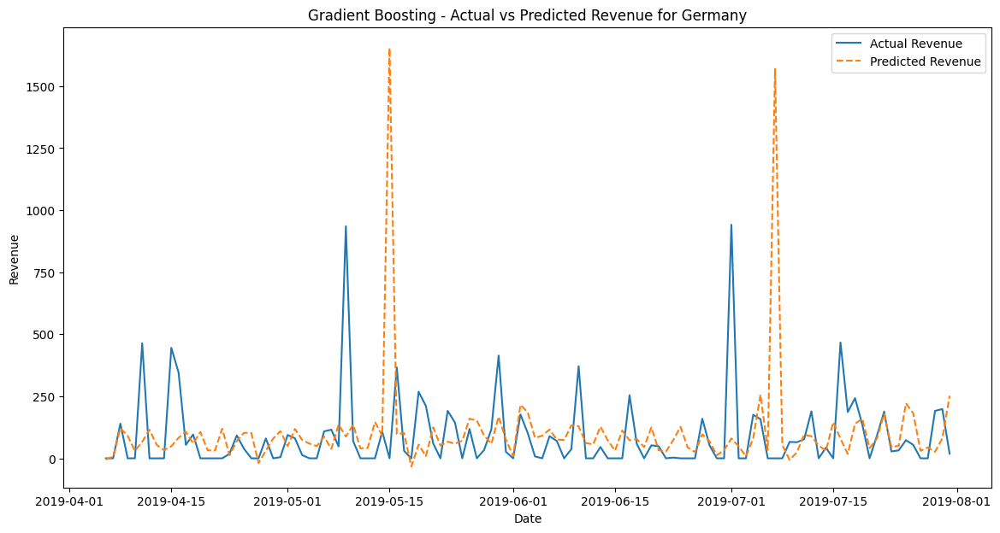

[Linear Regression] CV RMSE for Germany: 145.43095822156664
[Linear Regression] CV MAE for Germany: 89.60198532184585
[Linear Regression] CV R^2 for Germany: -0.0536601057602865
[Linear Regression] Test RMSE for Germany: 158.5299703609219
[Linear Regression] Test MAE for Germany: 97.4797579552249
[Linear Regression] Test R^2 for Germany: -0.034257966524958494


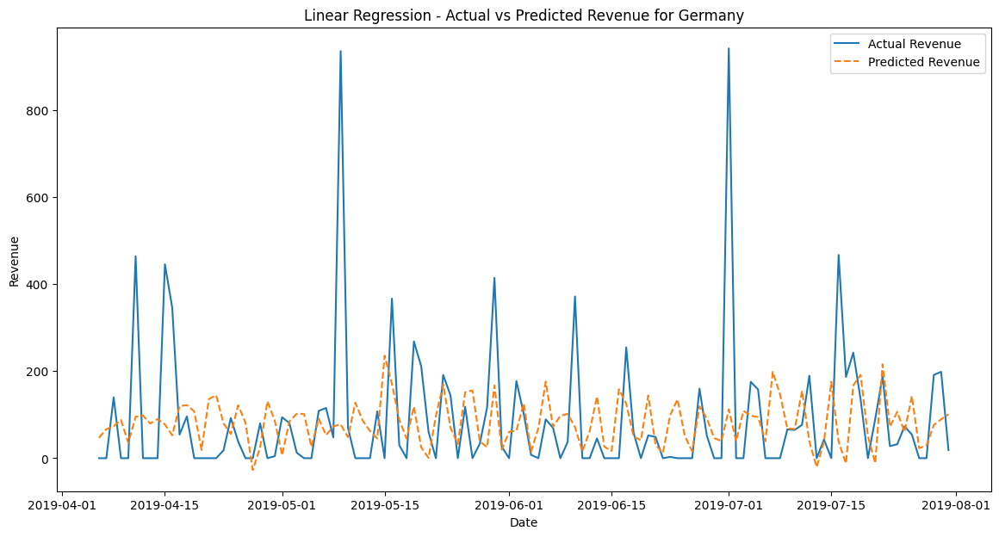

Running ARIMA model for Germany
[ARIMA] RMSE for Germany: 155.9439162859683
[ARIMA] MAE for Germany: 93.38839435390535
[ARIMA] R^2 for Germany: -0.0007900784434662356


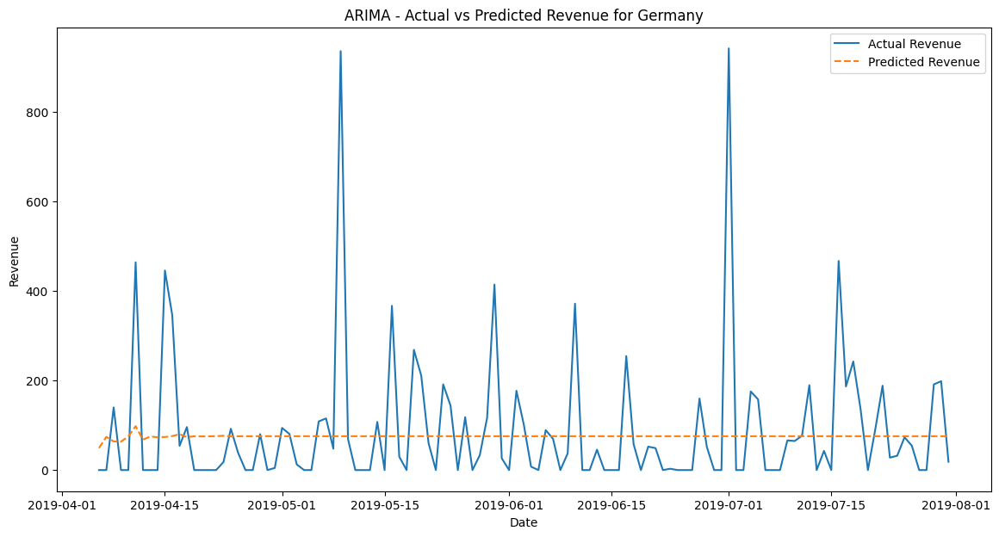

             revenue_lag_1  revenue_lag_2  revenue_lag_3  revenue_lag_4  \
InvoiceDate                                                               
2017-12-28            0.00            0.0           0.00           0.00   
2017-12-29            0.00            0.0           0.00           0.00   
2017-12-30            0.00            0.0           0.00           0.00   
2017-12-31            0.00            0.0           0.00           0.00   
2018-01-01            0.00            0.0           0.00           0.00   
...                    ...            ...            ...            ...   
2019-07-27          104.30           29.7          50.74           0.00   
2019-07-28            0.00          104.3          29.70          50.74   
2019-07-29            0.00            0.0         104.30          29.70   
2019-07-30            0.00            0.0           0.00         104.30   
2019-07-31            8.25            0.0           0.00           0.00   

             revenue_lag

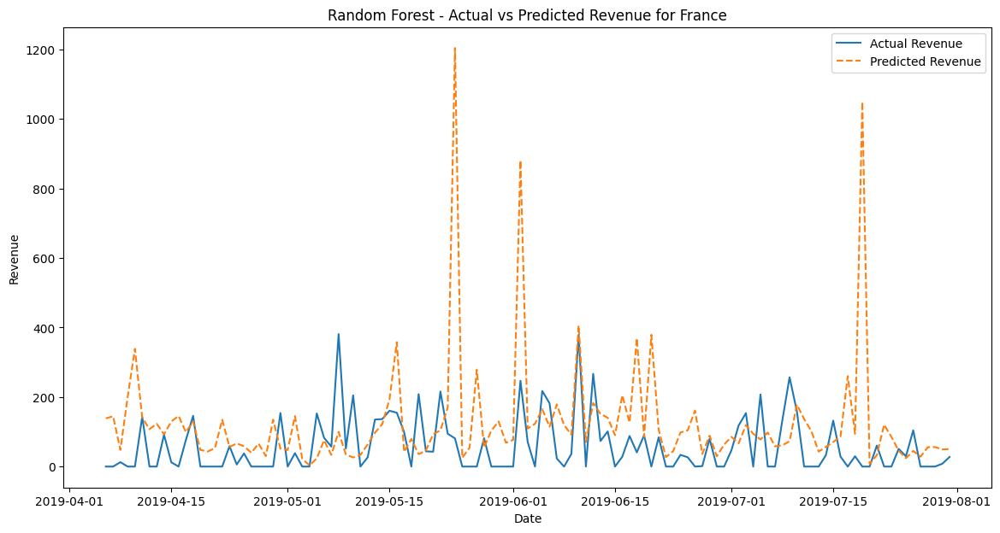

[Decision Tree] CV RMSE for France: 484.61087209583593
[Decision Tree] CV MAE for France: 166.56565007012622
[Decision Tree] CV R^2 for France: -19.310785328813434
[Decision Tree] Test RMSE for France: 349.0548883588074
[Decision Tree] Test MAE for France: 128.23162393162394
[Decision Tree] Test R^2 for France: -17.585663135883465


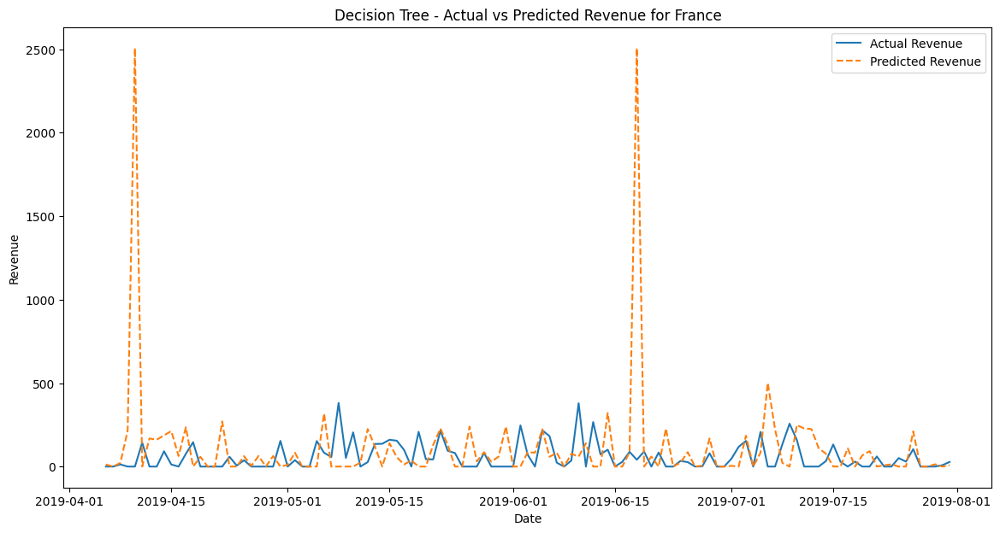

[Gradient Boosting] CV RMSE for France: 306.9165276001104
[Gradient Boosting] CV MAE for France: 129.58238751109081
[Gradient Boosting] CV R^2 for France: -2.79097342434175
[Gradient Boosting] Test RMSE for France: 107.1216498682822
[Gradient Boosting] Test MAE for France: 78.06701706175411
[Gradient Boosting] Test R^2 for France: -0.750431492796074


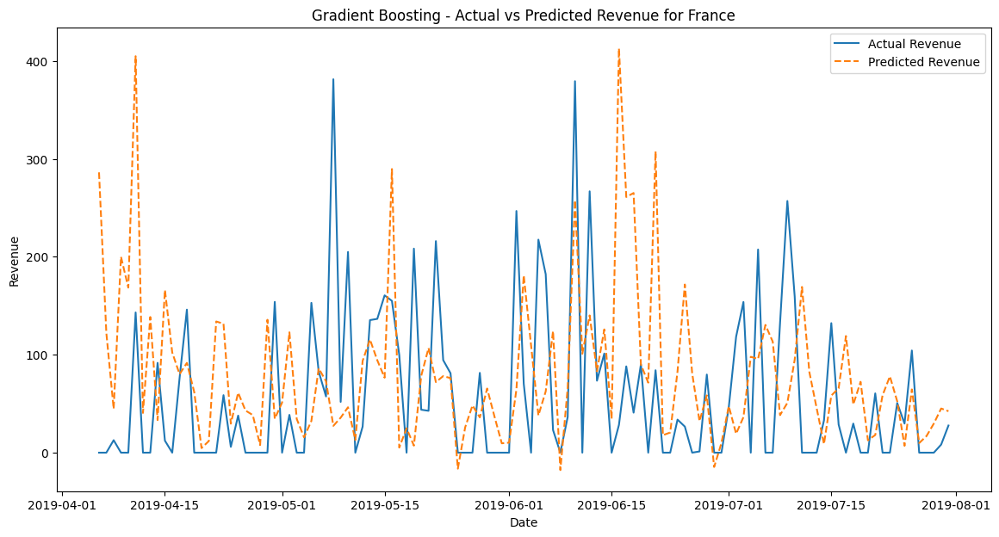

[Linear Regression] CV RMSE for France: 217.97502429846435
[Linear Regression] CV MAE for France: 110.55088604140194
[Linear Regression] CV R^2 for France: -0.22570224935509806
[Linear Regression] Test RMSE for France: 81.58166232518438
[Linear Regression] Test MAE for France: 63.41500034860349
[Linear Regression] Test R^2 for France: -0.015256346596866477


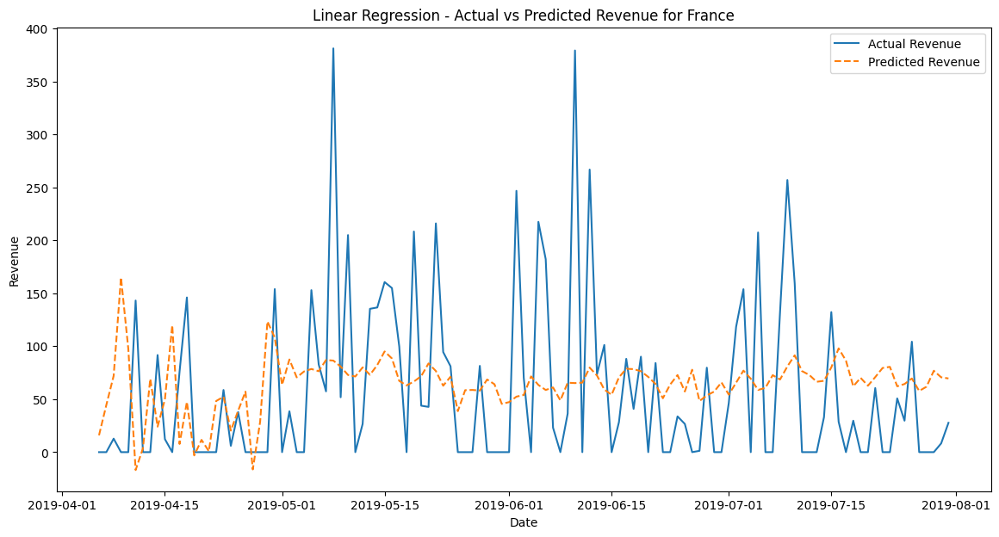

Running ARIMA model for France
[ARIMA] RMSE for France: 338.4872418270257
[ARIMA] MAE for France: 326.91740242283754
[ARIMA] R^2 for France: -16.477335388162285


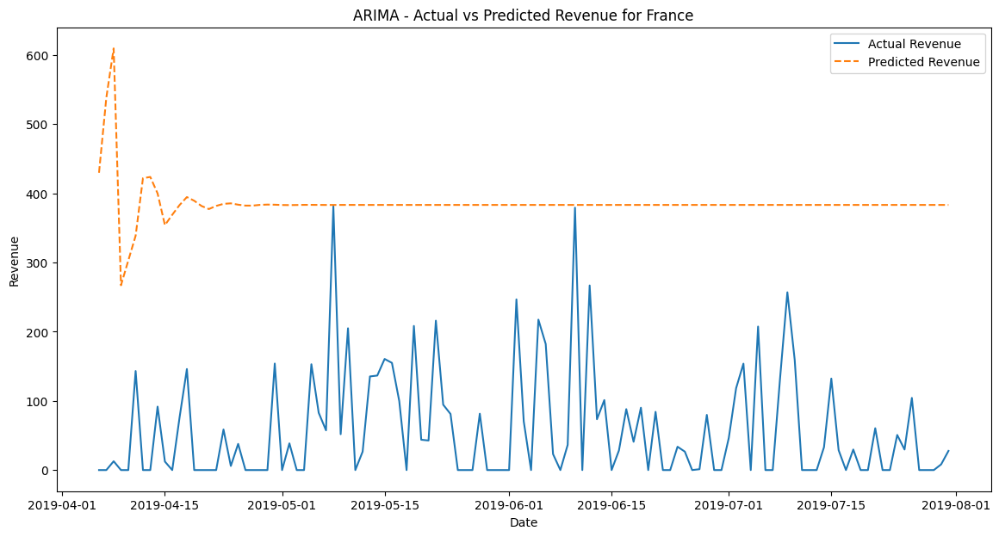

             revenue_lag_1  revenue_lag_2  revenue_lag_3  revenue_lag_4  \
InvoiceDate                                                               
2018-01-03             0.0            0.0            0.0            0.0   
2018-01-04             0.0            0.0            0.0            0.0   
2018-01-05             0.0            0.0            0.0            0.0   
2018-01-06             0.0            0.0            0.0            0.0   
2018-01-07             0.0            0.0            0.0            0.0   
...                    ...            ...            ...            ...   
2019-07-15             0.0            0.0            0.0            0.0   
2019-07-16             0.0            0.0            0.0            0.0   
2019-07-17             0.0            0.0            0.0            0.0   
2019-07-18             0.0            0.0            0.0            0.0   
2019-07-19             0.0            0.0            0.0            0.0   

             revenue_lag

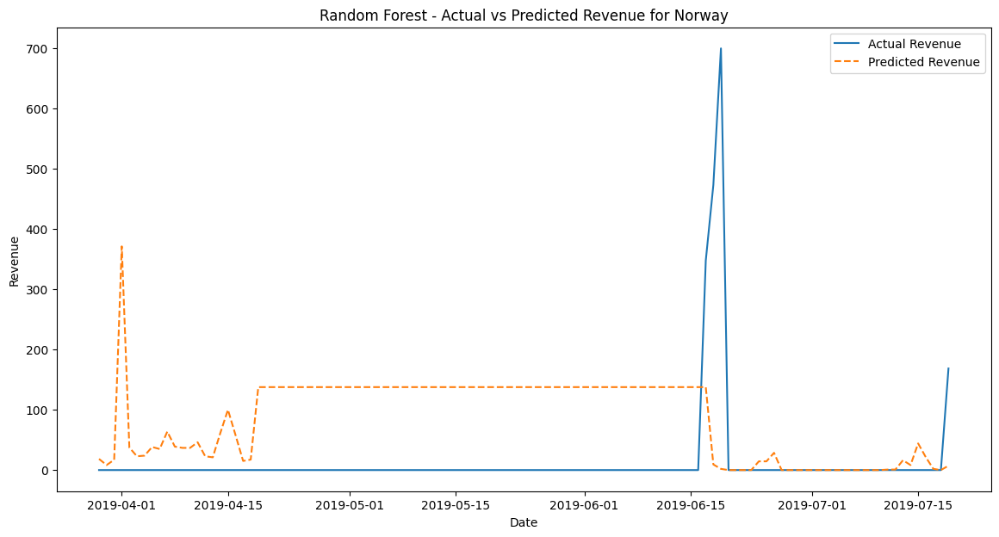

[Decision Tree] CV RMSE for Norway: 828.9435099835497
[Decision Tree] CV MAE for Norway: 155.6267707963536
[Decision Tree] CV R^2 for Norway: -7.71706544350959
[Decision Tree] Test RMSE for Norway: 210.835074774836
[Decision Tree] Test MAE for Norway: 105.12515449852509
[Decision Tree] Test R^2 for Norway: -4.993033251640601


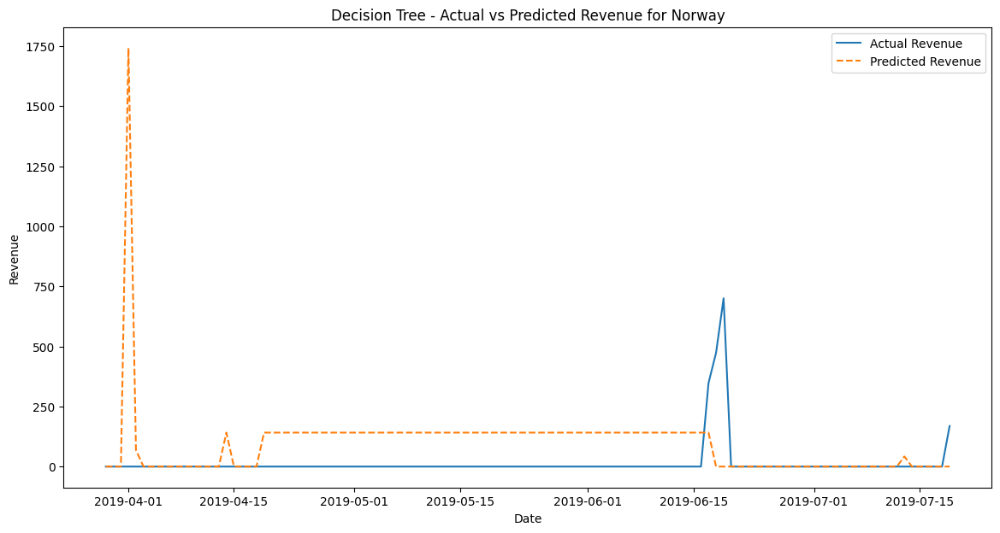

[Gradient Boosting] CV RMSE for Norway: 820.0185103828331
[Gradient Boosting] CV MAE for Norway: 159.63734703414212
[Gradient Boosting] CV R^2 for Norway: -7.456026146323839
[Gradient Boosting] Test RMSE for Norway: 121.85217560754721
[Gradient Boosting] Test MAE for Norway: 92.47530432347655
[Gradient Boosting] Test R^2 for Norway: -1.0018315888442362


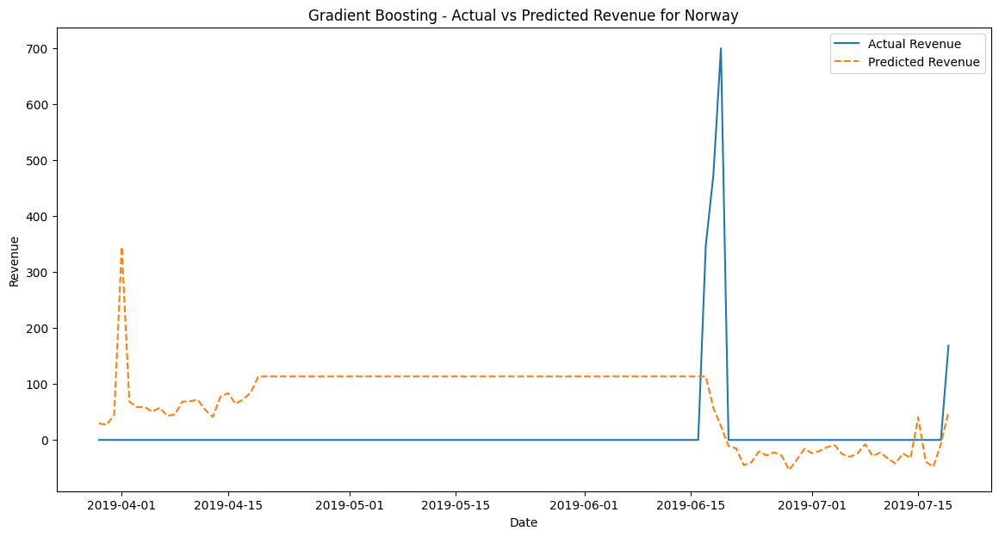

[Linear Regression] CV RMSE for Norway: 1037.745490195166
[Linear Regression] CV MAE for Norway: 265.81066357220266
[Linear Regression] CV R^2 for Norway: -6.190649710926297
[Linear Regression] Test RMSE for Norway: 112.49707974801474
[Linear Regression] Test MAE for Norway: 96.03938416425707
[Linear Regression] Test R^2 for Norway: -0.706253128488955


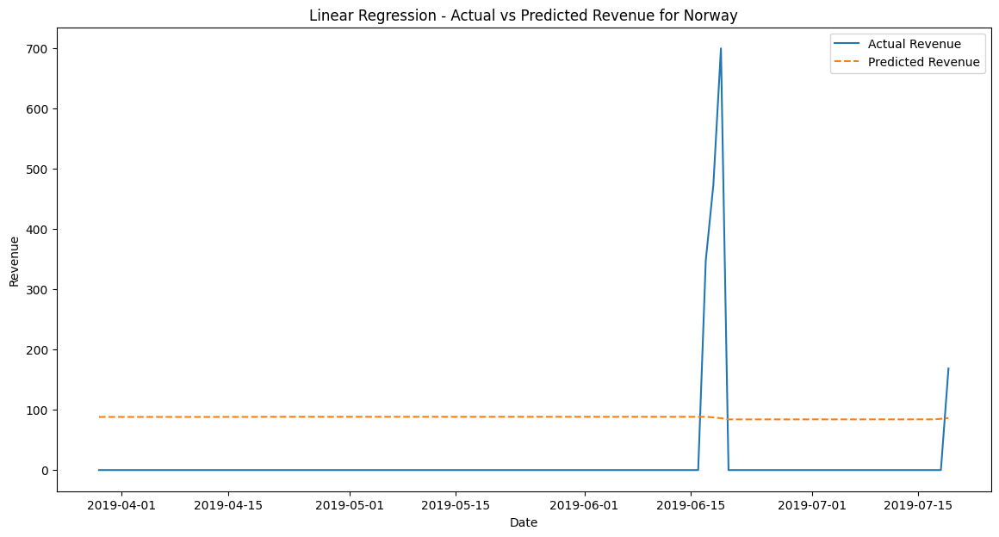

Running ARIMA model for Norway
[ARIMA] RMSE for Norway: 87.41154874996356
[ARIMA] MAE for Norway: 14.953097345132742
[ARIMA] R^2 for Norway: -0.030145554999311264


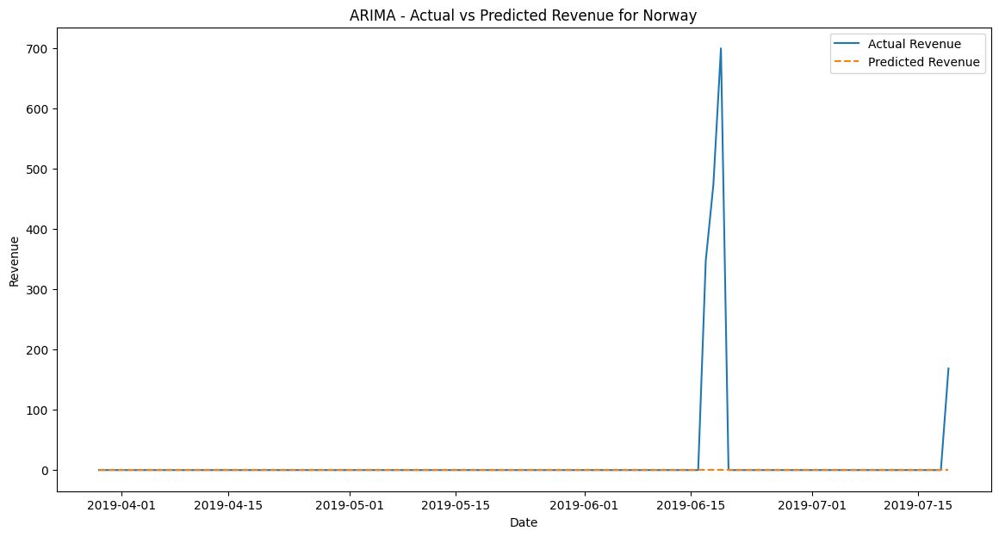

             revenue_lag_1  revenue_lag_2  revenue_lag_3  revenue_lag_4  \
InvoiceDate                                                               
2017-12-30            0.00           0.00           0.00           0.00   
2017-12-31            0.00           0.00           0.00           0.00   
2018-01-01            0.00           0.00           0.00           0.00   
2018-01-02            0.00           0.00           0.00           0.00   
2018-01-03            0.00           0.00           0.00           0.00   
...                    ...            ...            ...            ...   
2019-07-21            0.00           0.00           0.00          45.09   
2019-07-22            0.00           0.00           0.00           0.00   
2019-07-23          164.83           0.00           0.00           0.00   
2019-07-24            0.00         164.83           0.00           0.00   
2019-07-25            0.00           0.00         164.83           0.00   

             revenue_lag

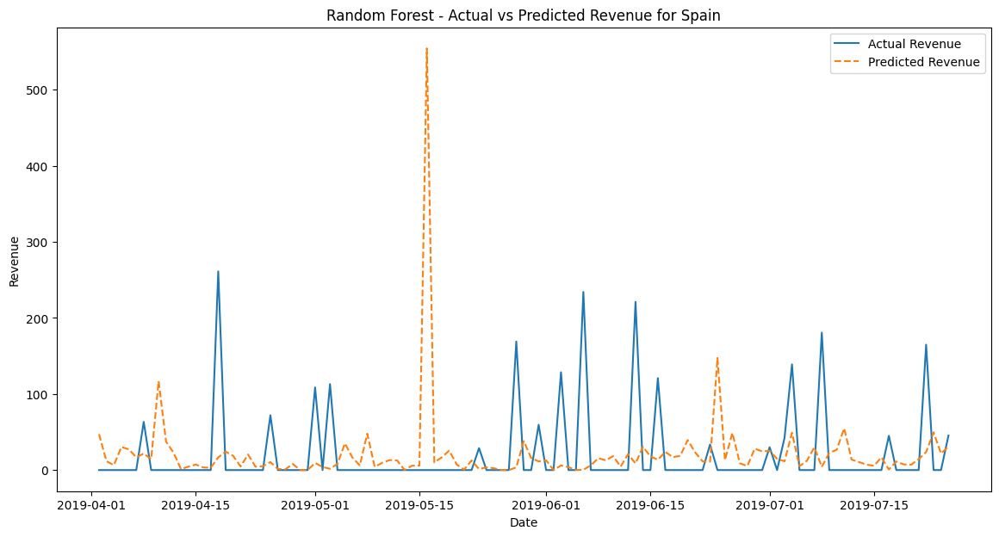

[Decision Tree] CV RMSE for Spain: 137.08353909331504
[Decision Tree] CV MAE for Spain: 41.245819039656
[Decision Tree] CV R^2 for Spain: -0.6990620141810482
[Decision Tree] Test RMSE for Spain: 135.08505327160108
[Decision Tree] Test MAE for Spain: 51.284869565217384
[Decision Tree] Test R^2 for Spain: -5.713996119408868


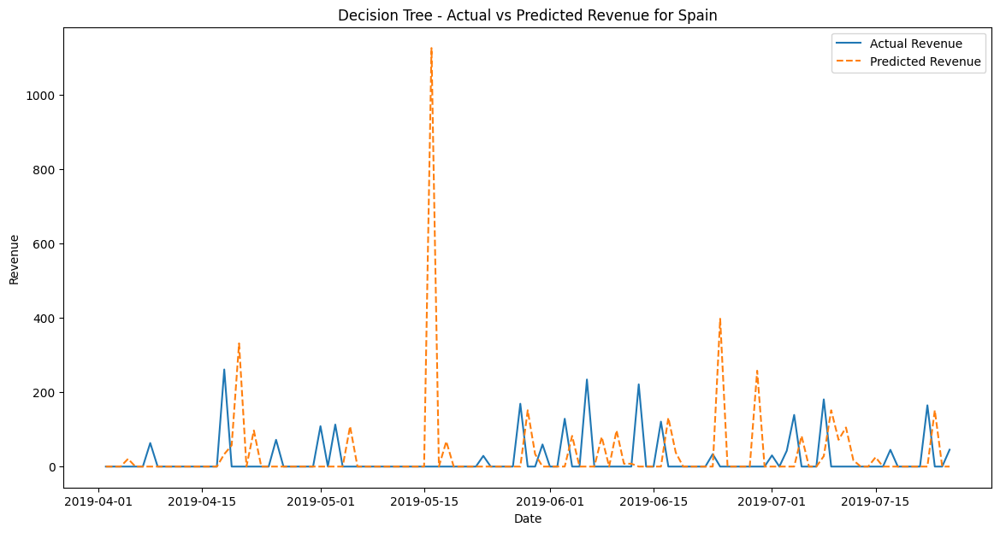

[Gradient Boosting] CV RMSE for Spain: 151.09016287997036
[Gradient Boosting] CV MAE for Spain: 54.29869944407125
[Gradient Boosting] CV R^2 for Spain: -0.4497448377606951
[Gradient Boosting] Test RMSE for Spain: 101.78818617735857
[Gradient Boosting] Test MAE for Spain: 35.38074969078466
[Gradient Boosting] Test R^2 for Spain: -2.8120732760635385


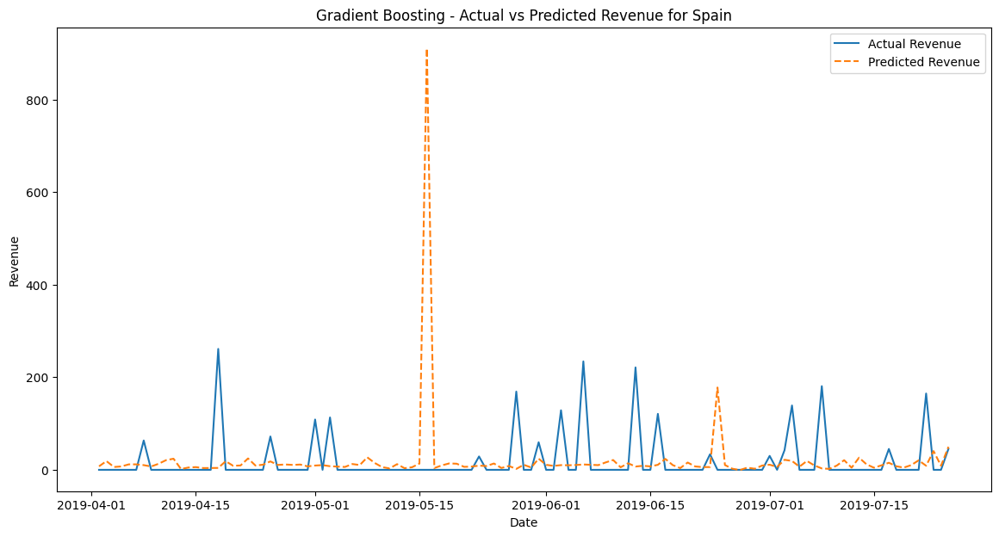

[Linear Regression] CV RMSE for Spain: 137.50129485284089
[Linear Regression] CV MAE for Spain: 65.77854844317994
[Linear Regression] CV R^2 for Spain: -0.2795170867768
[Linear Regression] Test RMSE for Spain: 56.51776546815334
[Linear Regression] Test MAE for Spain: 36.99697827727555
[Linear Regression] Test R^2 for Spain: -0.17526676465671231


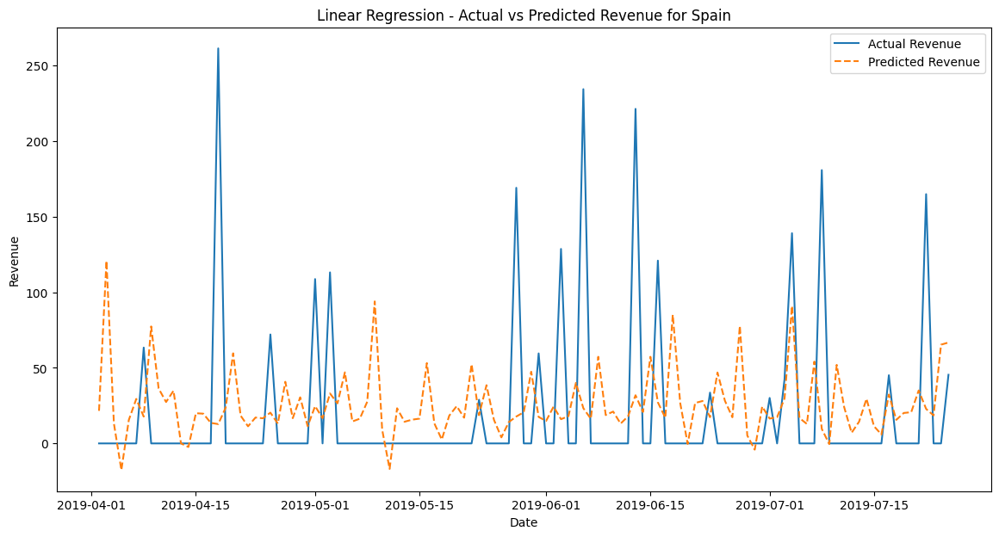

Running ARIMA model for Spain
[ARIMA] RMSE for Spain: 55.7207527883853
[ARIMA] MAE for Spain: 19.669826086956522
[ARIMA] R^2 for Spain: -0.14235329670735242


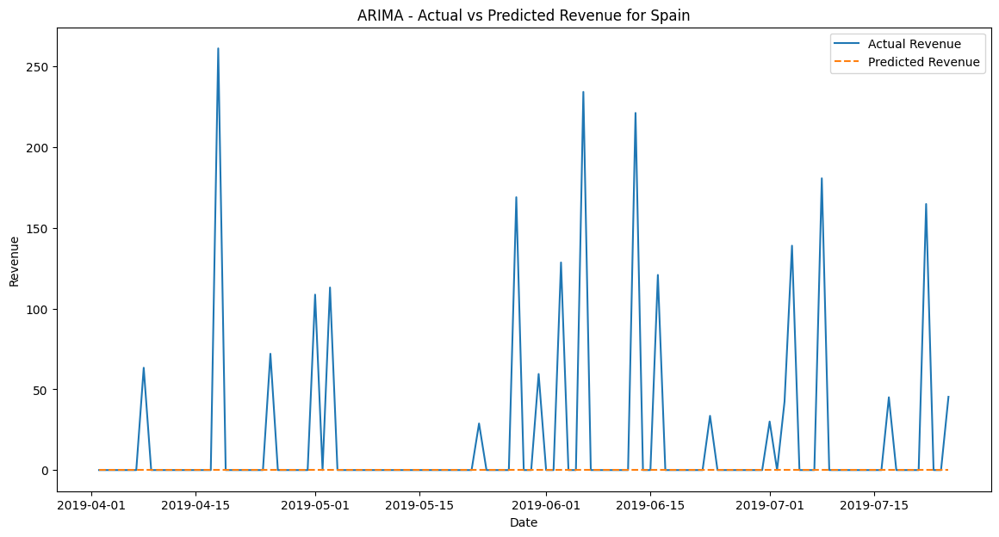

             revenue_lag_1  revenue_lag_2  revenue_lag_3  revenue_lag_4  \
InvoiceDate                                                               
2018-05-18             0.0            0.0            0.0            0.0   
2018-05-19             0.0            0.0            0.0            0.0   
2018-05-20             0.0            0.0            0.0            0.0   
2018-05-21             0.0            0.0            0.0            0.0   
2018-05-22             0.0            0.0            0.0            0.0   
...                    ...            ...            ...            ...   
2019-06-15             0.0            0.0            0.0            0.0   
2019-06-16             0.0            0.0            0.0            0.0   
2019-06-17             0.0            0.0            0.0            0.0   
2019-06-18             0.0            0.0            0.0            0.0   
2019-06-19             0.0            0.0            0.0            0.0   

             revenue_lag

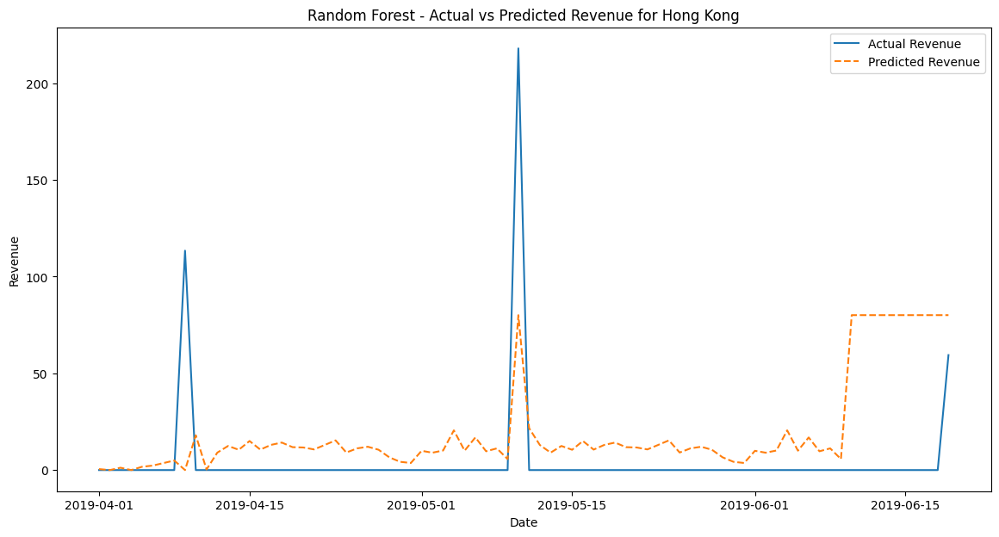

[Decision Tree] CV RMSE for Hong Kong: 386.3599481034249
[Decision Tree] CV MAE for Hong Kong: 103.19866013906456
[Decision Tree] CV R^2 for Hong Kong: -4.409773581289352
[Decision Tree] Test RMSE for Hong Kong: 33.01414537395797
[Decision Tree] Test MAE for Hong Kong: 12.139495111731845
[Decision Tree] Test R^2 for Hong Kong: -0.4065397901399139


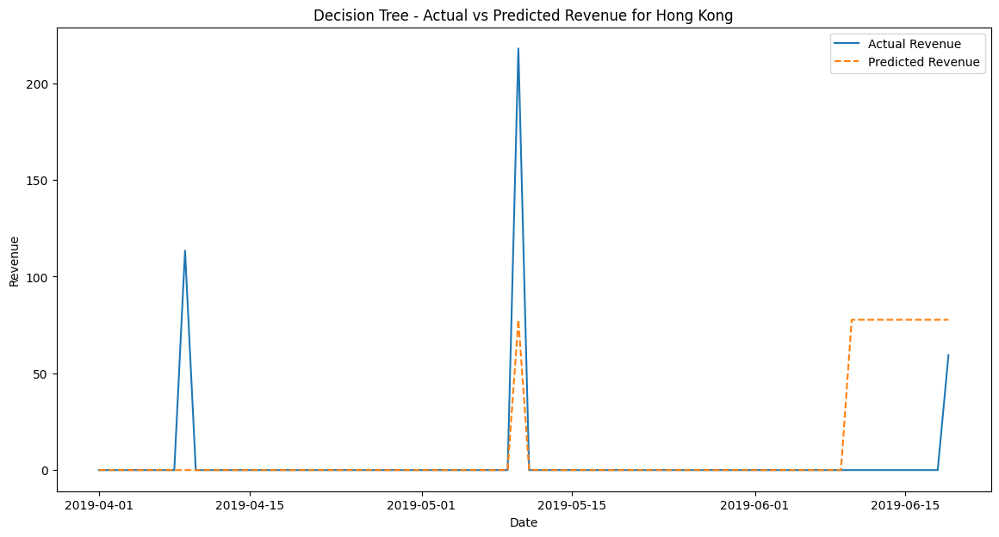

[Gradient Boosting] CV RMSE for Hong Kong: 372.7461395303519
[Gradient Boosting] CV MAE for Hong Kong: 92.7597410625788
[Gradient Boosting] CV R^2 for Hong Kong: -2.0994129864473674
[Gradient Boosting] Test RMSE for Hong Kong: 36.093041171645915
[Gradient Boosting] Test MAE for Hong Kong: 30.087760878611903
[Gradient Boosting] Test R^2 for Hong Kong: -0.6811205530721274


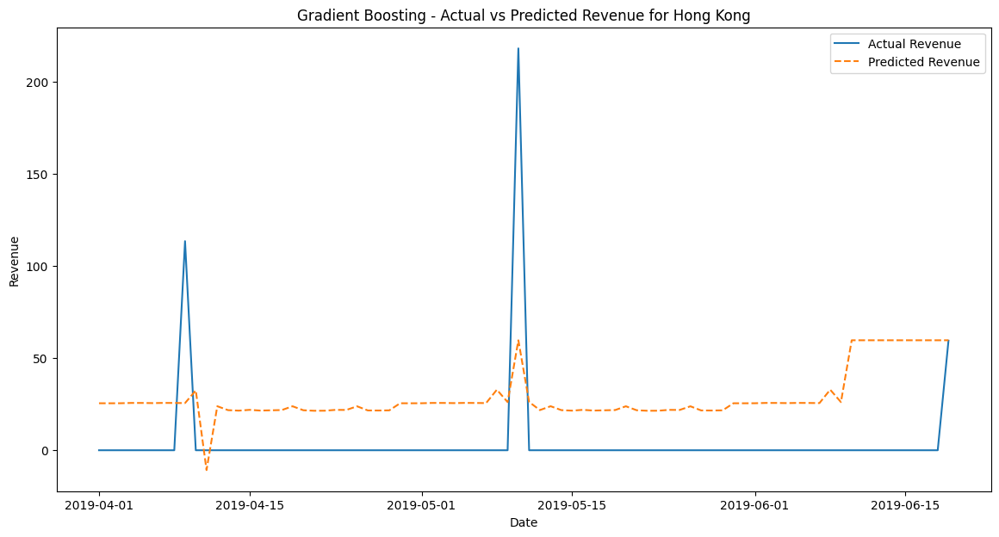

[Linear Regression] CV RMSE for Hong Kong: 373.20354467586196
[Linear Regression] CV MAE for Hong Kong: 92.75343021648384
[Linear Regression] CV R^2 for Hong Kong: -2.2773818263433823
[Linear Regression] Test RMSE for Hong Kong: 56.910462261769595
[Linear Regression] Test MAE for Hong Kong: 52.850078245393455
[Linear Regression] Test R^2 for Hong Kong: -3.179613568838109


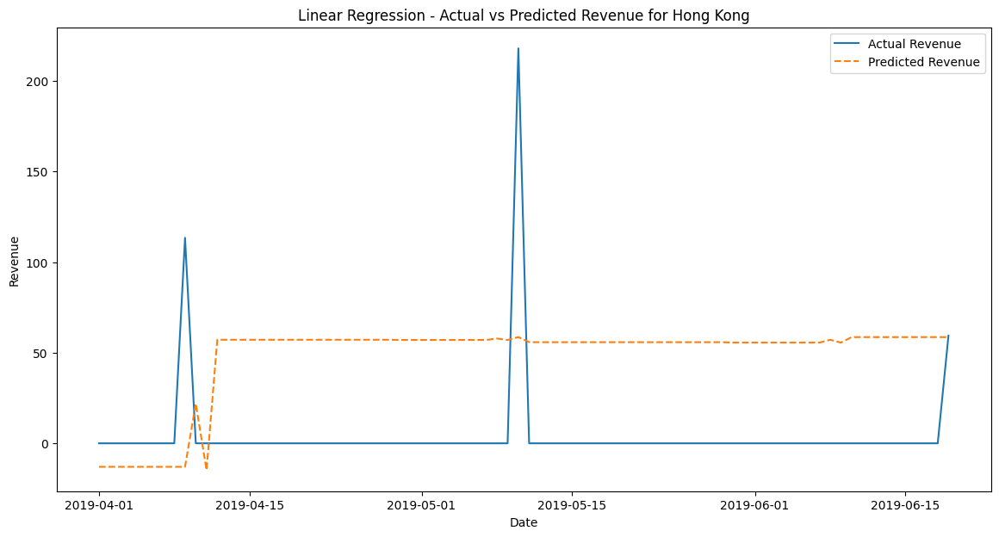

Running ARIMA model for Hong Kong
[ARIMA] RMSE for Hong Kong: 28.262497965501915
[ARIMA] MAE for Hong Kong: 4.8851249999999995
[ARIMA] R^2 for Hong Kong: -0.03079663499125962


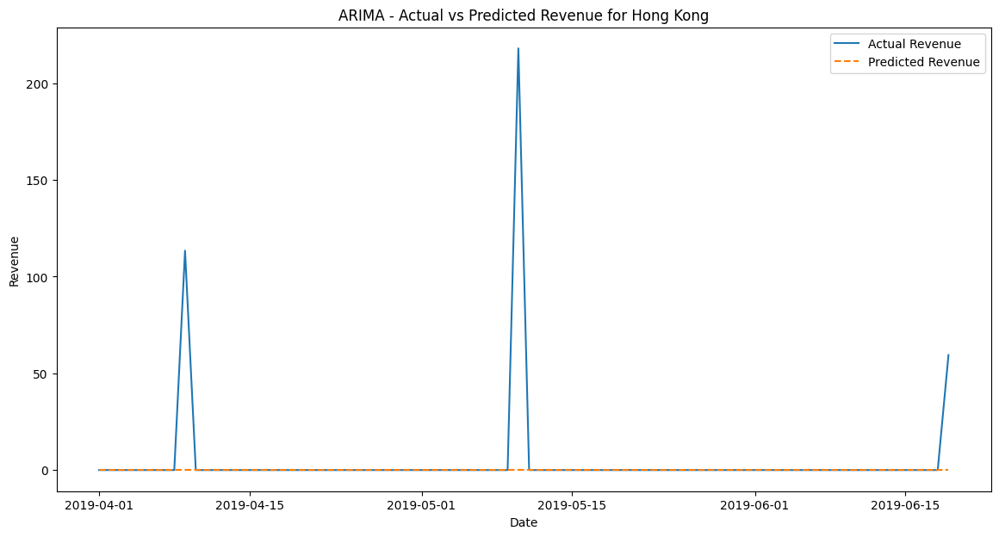

             revenue_lag_1  revenue_lag_2  revenue_lag_3  revenue_lag_4  \
InvoiceDate                                                               
2017-12-28             0.0            0.0            0.0            0.0   
2017-12-29             0.0            0.0            0.0            0.0   
2017-12-30             0.0            0.0            0.0            0.0   
2017-12-31             0.0            0.0            0.0            0.0   
2018-01-01             0.0            0.0            0.0            0.0   
...                    ...            ...            ...            ...   
2019-07-27             0.0            0.0            0.0            0.0   
2019-07-28             0.0            0.0            0.0            0.0   
2019-07-29             0.0            0.0            0.0            0.0   
2019-07-30             0.0            0.0            0.0            0.0   
2019-07-31             0.0            0.0            0.0            0.0   

             revenue_lag

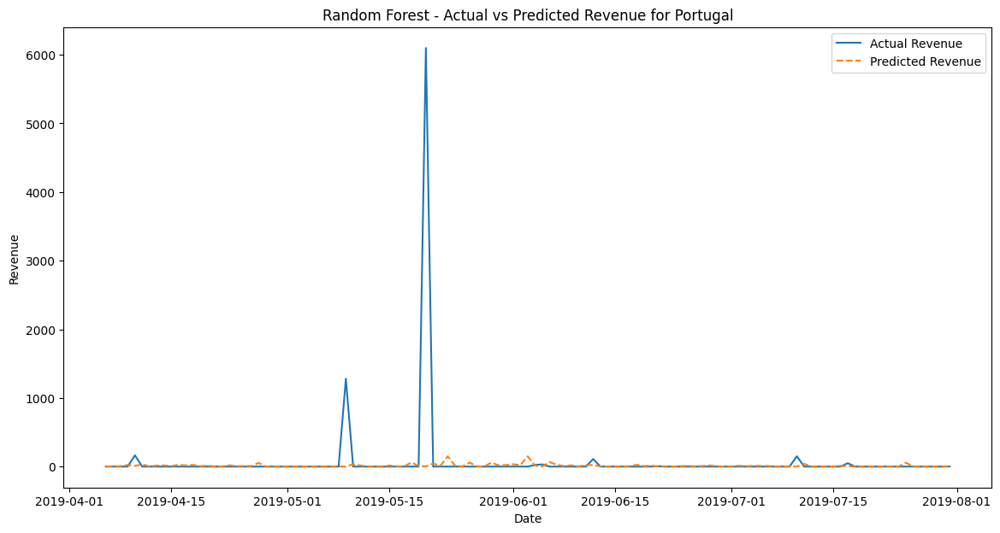

[Decision Tree] CV RMSE for Portugal: 52.303826545428834
[Decision Tree] CV MAE for Portugal: 21.275025451145392
[Decision Tree] CV R^2 for Portugal: -0.8941094425531319
[Decision Tree] Test RMSE for Portugal: 577.6672833877484
[Decision Tree] Test MAE for Portugal: 79.61410256410257
[Decision Tree] Test R^2 for Portugal: -0.017867431137534417


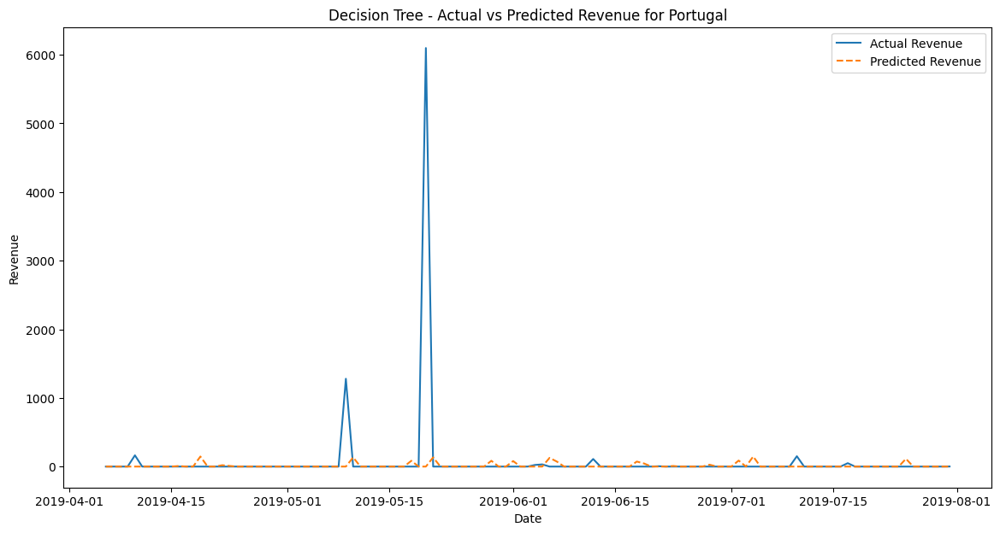

[Gradient Boosting] CV RMSE for Portugal: 43.69846742438962
[Gradient Boosting] CV MAE for Portugal: 20.13183881302674
[Gradient Boosting] CV R^2 for Portugal: -0.32572081816378756
[Gradient Boosting] Test RMSE for Portugal: 576.6604385302691
[Gradient Boosting] Test MAE for Portugal: 82.92423006531637
[Gradient Boosting] Test R^2 for Portugal: -0.014322340388393195


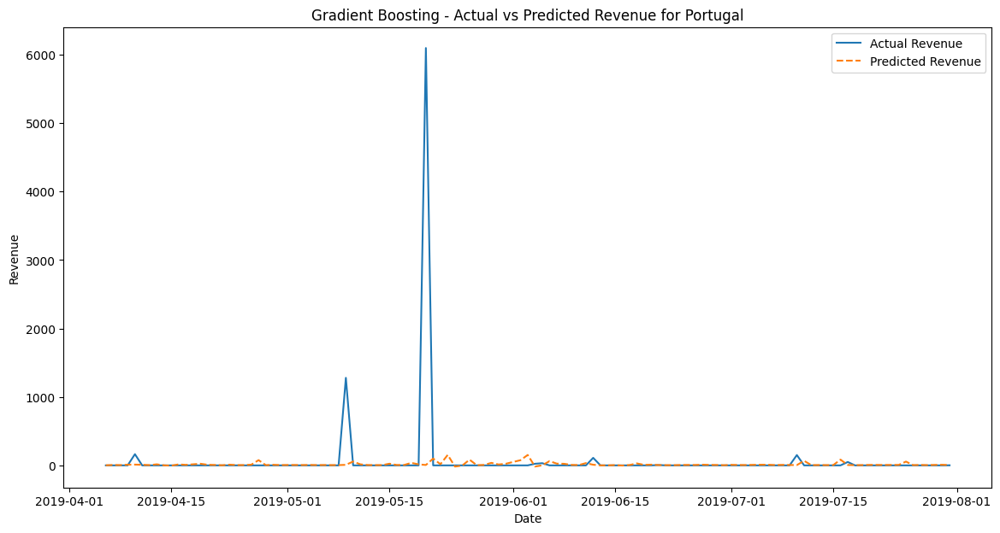

[Linear Regression] CV RMSE for Portugal: 41.67816489252074
[Linear Regression] CV MAE for Portugal: 21.151450626955835
[Linear Regression] CV R^2 for Portugal: -0.15859730411374345
[Linear Regression] Test RMSE for Portugal: 593.8801249134182
[Linear Regression] Test MAE for Portugal: 126.8330816084363
[Linear Regression] Test R^2 for Portugal: -0.07580425462503815


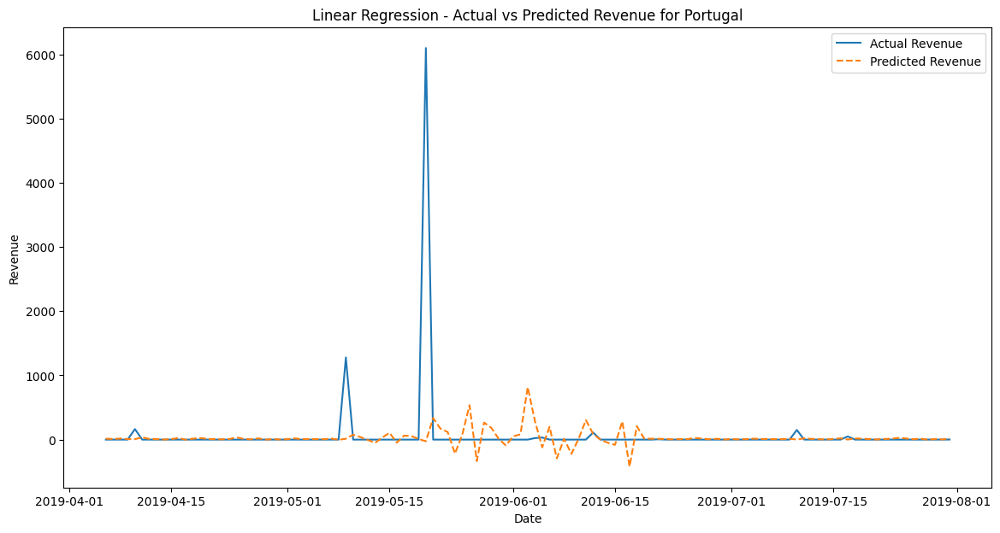

Running ARIMA model for Portugal
[ARIMA] RMSE for Portugal: 575.0313255701552
[ARIMA] MAE for Portugal: 79.96300137244539
[ARIMA] R^2 for Portugal: -0.008599348440138321


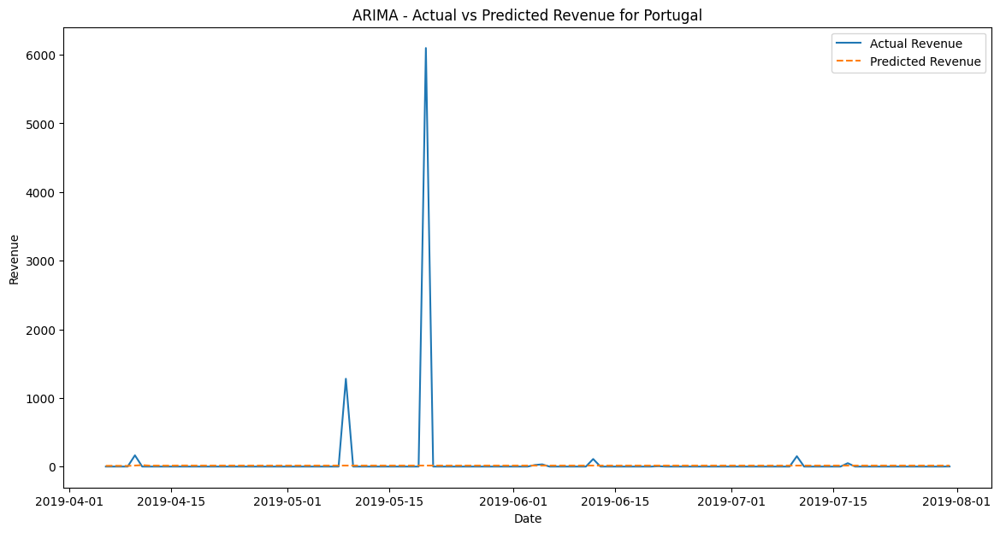

             revenue_lag_1  revenue_lag_2  revenue_lag_3  revenue_lag_4  \
InvoiceDate                                                               
2018-05-24             0.0            0.0            0.0            0.0   
2018-05-25             0.0            0.0            0.0            0.0   
2018-05-26             0.0            0.0            0.0            0.0   
2018-05-27             0.0            0.0            0.0            0.0   
2018-05-28             0.0            0.0            0.0            0.0   
...                    ...            ...            ...            ...   
2019-07-11             0.0            0.0            0.0            0.0   
2019-07-12             0.0            0.0            0.0            0.0   
2019-07-13             0.0            0.0            0.0            0.0   
2019-07-14             0.0            0.0            0.0            0.0   
2019-07-15             0.0            0.0            0.0            0.0   

             revenue_lag

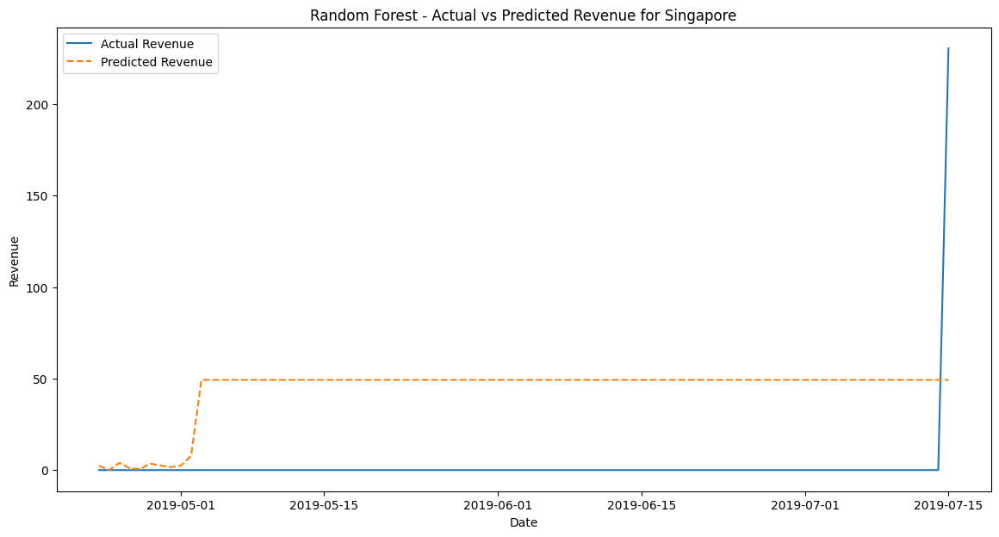

[Decision Tree] CV RMSE for Singapore: 347.0594519637586
[Decision Tree] CV MAE for Singapore: 79.41432473587481
[Decision Tree] CV R^2 for Singapore: -0.7751383712373073
[Decision Tree] Test RMSE for Singapore: 50.809425553665434
[Decision Tree] Test MAE for Singapore: 45.82102040816325
[Decision Tree] Test R^2 for Singapore: -3.1321676592932155


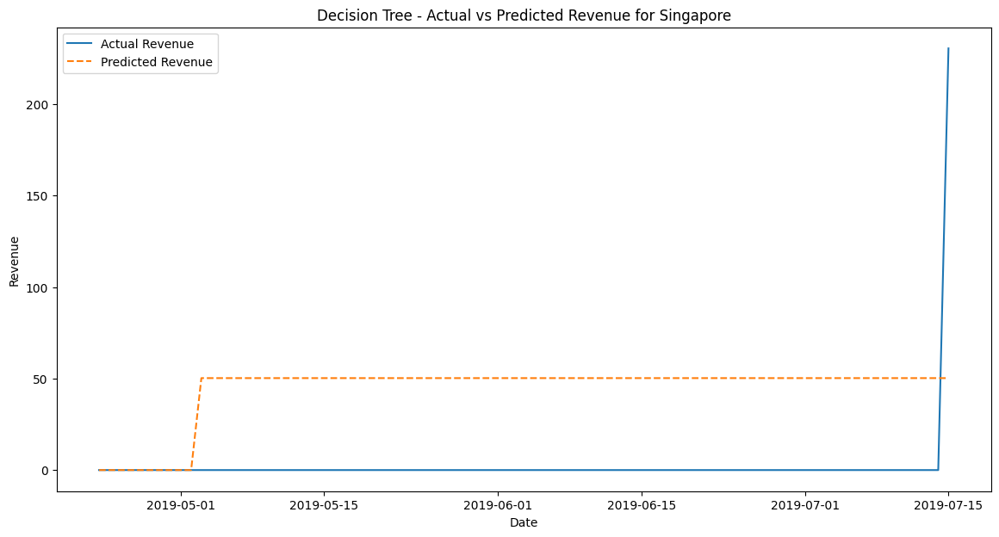

[Gradient Boosting] CV RMSE for Singapore: 343.54861241953085
[Gradient Boosting] CV MAE for Singapore: 78.9666228180024
[Gradient Boosting] CV R^2 for Singapore: -0.7696626581626118
[Gradient Boosting] Test RMSE for Singapore: 46.98595170627544
[Gradient Boosting] Test MAE for Singapore: 42.640931880284974
[Gradient Boosting] Test R^2 for Singapore: -2.533665371308318


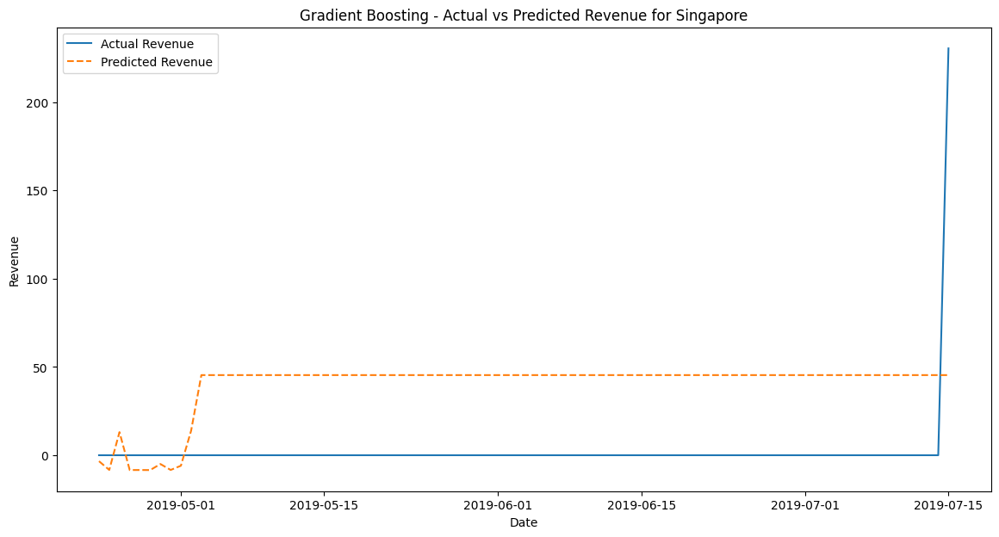

[Linear Regression] CV RMSE for Singapore: 344.6279453749043
[Linear Regression] CV MAE for Singapore: 87.46869131957948
[Linear Regression] CV R^2 for Singapore: -1.0466283480069651
[Linear Regression] Test RMSE for Singapore: 710.4824688988354
[Linear Regression] Test MAE for Singapore: 272.02049417928055
[Linear Regression] Test R^2 for Singapore: -806.9716025566206


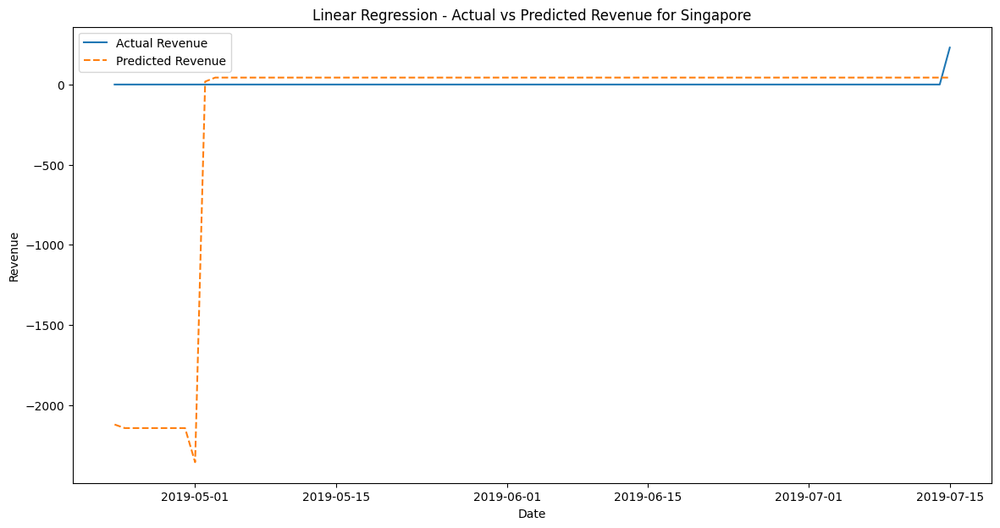

Running ARIMA model for Singapore
[ARIMA] RMSE for Singapore: 25.145247491893404
[ARIMA] MAE for Singapore: 2.7435714285714288
[ARIMA] R^2 for Singapore: -0.012048192771084487


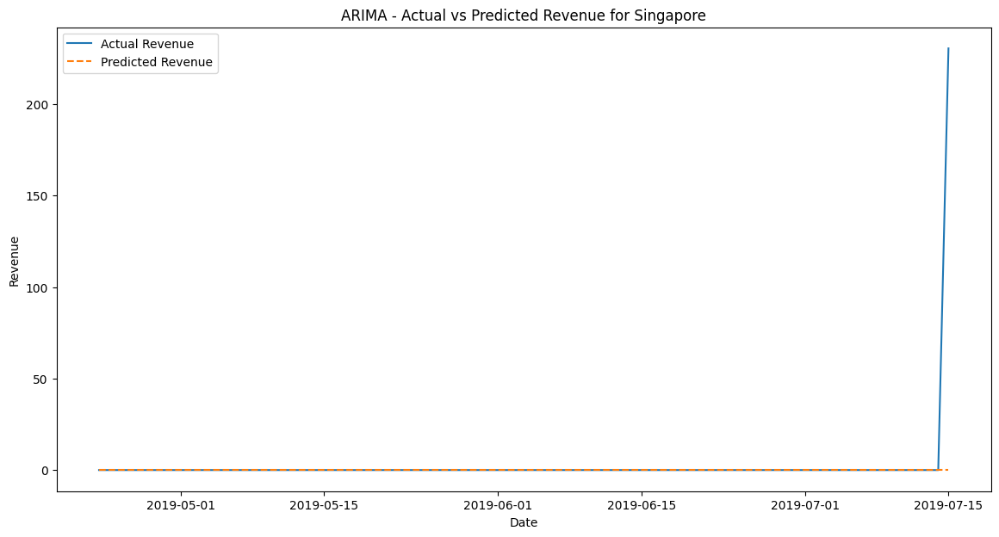

             revenue_lag_1  revenue_lag_2  revenue_lag_3  revenue_lag_4  \
InvoiceDate                                                               
2017-12-29             0.0            0.0            0.0            0.0   
2017-12-30             0.0            0.0            0.0            0.0   
2017-12-31             0.0            0.0            0.0            0.0   
2018-01-01             0.0            0.0            0.0            0.0   
2018-01-02             0.0            0.0            0.0            0.0   
...                    ...            ...            ...            ...   
2019-07-13             0.0            0.0            0.0            0.0   
2019-07-14             0.0            0.0            0.0            0.0   
2019-07-15             0.0            0.0            0.0            0.0   
2019-07-16             0.0            0.0            0.0            0.0   
2019-07-17             0.0            0.0            0.0            0.0   

             revenue_lag

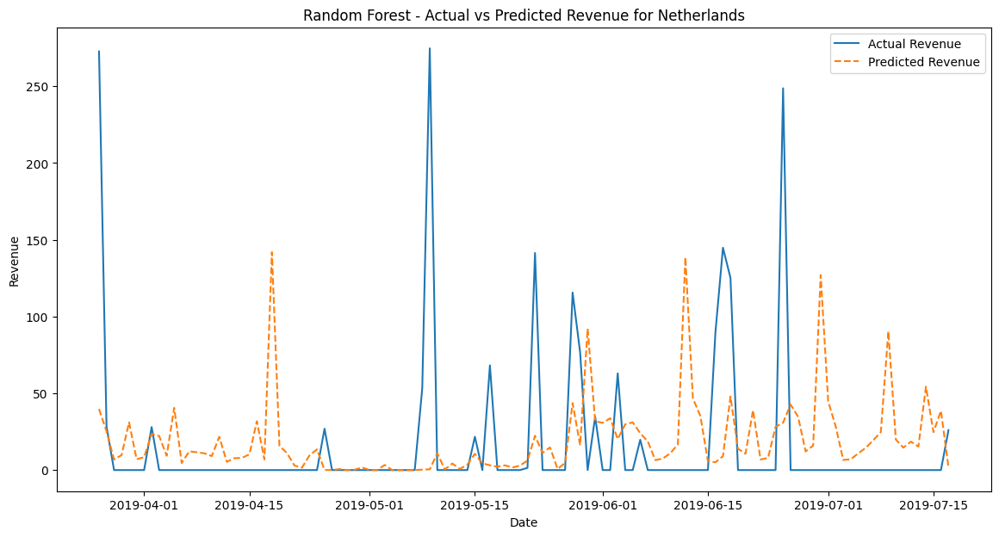

[Decision Tree] CV RMSE for Netherlands: 127.81716217773393
[Decision Tree] CV MAE for Netherlands: 45.80029548229548
[Decision Tree] CV R^2 for Netherlands: -3.8041814079779135
[Decision Tree] Test RMSE for Netherlands: 70.34266245603382
[Decision Tree] Test MAE for Netherlands: 28.098245614035086
[Decision Tree] Test R^2 for Netherlands: -1.002552033204768


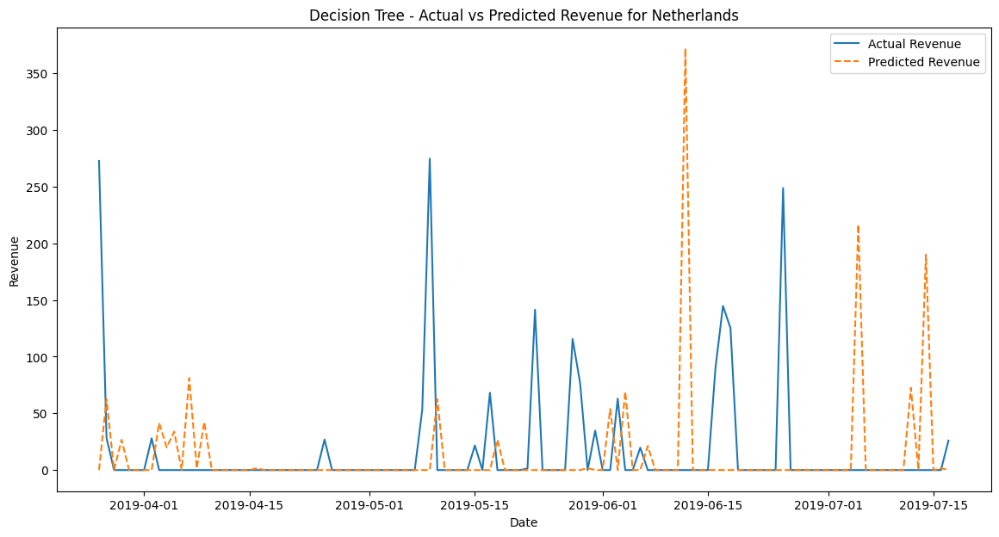

[Gradient Boosting] CV RMSE for Netherlands: 110.81603342484684
[Gradient Boosting] CV MAE for Netherlands: 44.993688476984666
[Gradient Boosting] CV R^2 for Netherlands: -2.501448960311922
[Gradient Boosting] Test RMSE for Netherlands: 50.65866735510319
[Gradient Boosting] Test MAE for Netherlands: 28.284589939121666
[Gradient Boosting] Test R^2 for Netherlands: -0.03861293409036448


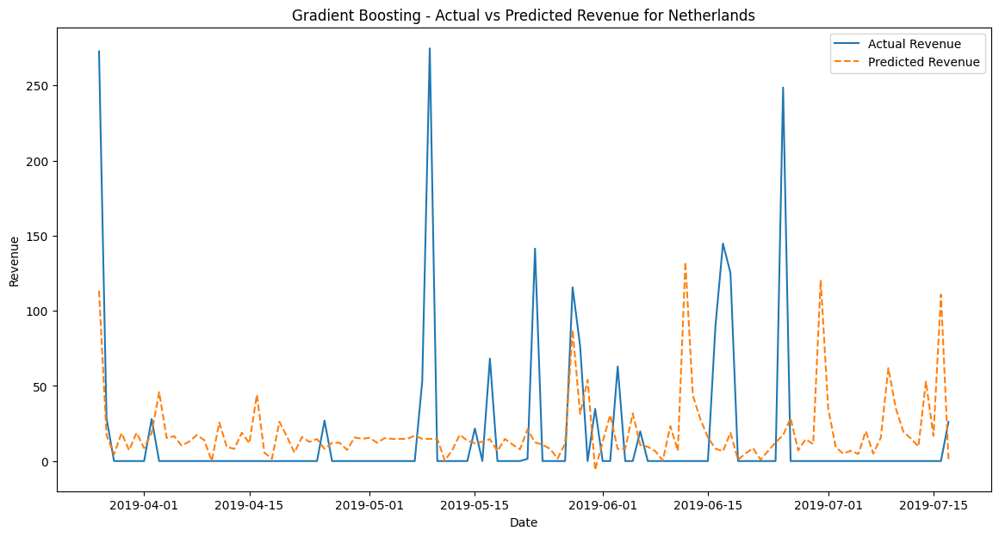

[Linear Regression] CV RMSE for Netherlands: 71.42630881514862
[Linear Regression] CV MAE for Netherlands: 37.06649609352095
[Linear Regression] CV R^2 for Netherlands: -0.07722854956223468
[Linear Regression] Test RMSE for Netherlands: 50.617624064315464
[Linear Regression] Test MAE for Netherlands: 32.680559165566834
[Linear Regression] Test R^2 for Netherlands: -0.03693066227366515


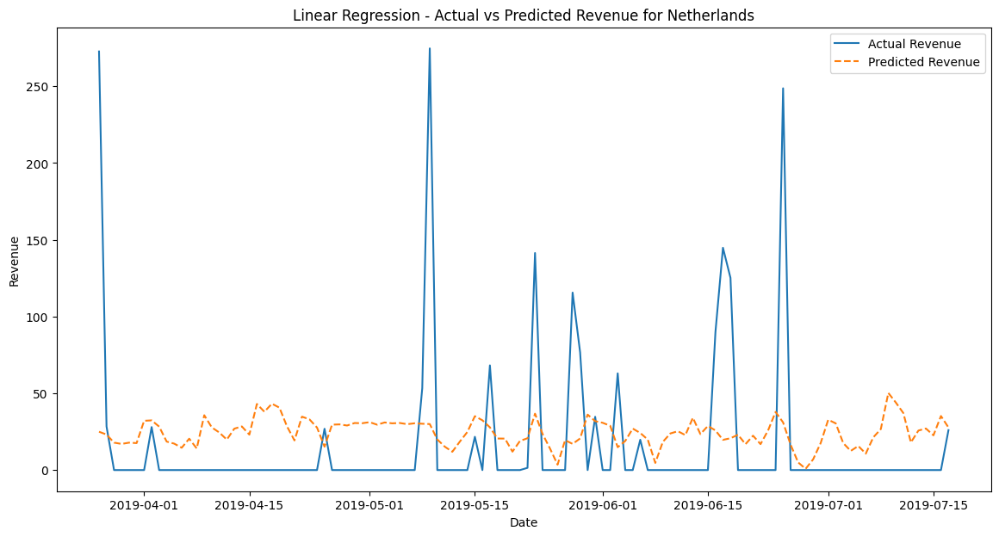

Running ARIMA model for Netherlands
[ARIMA] RMSE for Netherlands: 49.876207680924644
[ARIMA] MAE for Netherlands: 24.228400902372584
[ARIMA] R^2 for Netherlands: -0.006776463781776654


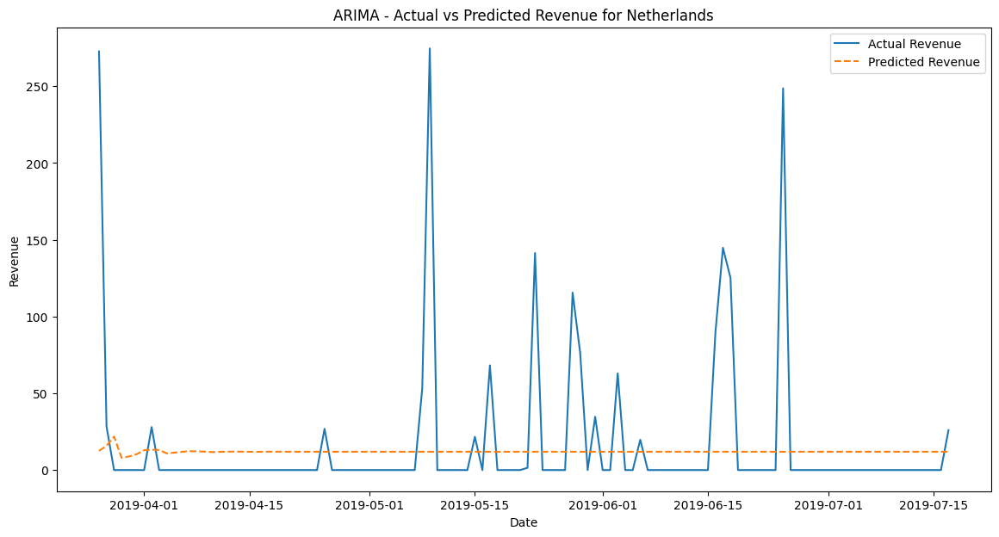

Cross-Validation results have been saved to 'country_model_results_cv.pkl'


In [30]:
import warnings
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, make_scorer
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import pickle
import numpy as np

# Suppress FutureWarnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Define models to compare
models = {
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42),
    'Linear Regression': LinearRegression(),
}

# Initialize dictionary to store results
results = {}

# Define scoring metric for cross-validation
scoring = {
    'RMSE': make_scorer(mean_squared_error, squared=False),
    'MAE': make_scorer(mean_absolute_error),
    'R^2': make_scorer(r2_score)
}

for country, df in country_lagged_revenues.items():
    X = df.drop('price', axis=1)
    print(X)
    y = df['price']
    print(y)

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    results[country] = {}

    for model_name, model in models.items():
        # Cross-validation
        cv_rmse = np.mean(cross_val_score(model, X_train, y_train, cv=5, scoring=scoring['RMSE']))
        cv_mae = np.mean(cross_val_score(model, X_train, y_train, cv=5, scoring=scoring['MAE']))
        cv_r2 = np.mean(cross_val_score(model, X_train, y_train, cv=5, scoring=scoring['R^2']))
        
        # Store cross-validation results
        results[country][model_name] = {
            'CV RMSE': cv_rmse,
            'CV MAE': cv_mae,
            'CV R^2': cv_r2
        }
        
        print(f'[{model_name}] CV RMSE for {country}: {cv_rmse}')
        print(f'[{model_name}] CV MAE for {country}: {cv_mae}')
        print(f'[{model_name}] CV R^2 for {country}: {cv_r2}')
        
        # Train the model on the full training set
        model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = model.predict(X_test)

        # Evaluate the model using the updated method
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        # Store test set results
        results[country][model_name].update({
            'Test RMSE': rmse,
            'Test MAE': mae,
            'Test R^2': r2
        })

        print(f'[{model_name}] Test RMSE for {country}: {rmse}')
        print(f'[{model_name}] Test MAE for {country}: {mae}')
        print(f'[{model_name}] Test R^2 for {country}: {r2}')

        # Plot actual vs predicted revenue for the specific country
        plt.figure(figsize=(14, 7))
        plt.plot(y_test.index, y_test, label='Actual Revenue')
        plt.plot(y_test.index, y_pred, label='Predicted Revenue', linestyle='--')
        plt.legend()
        plt.title(f'{model_name} - Actual vs Predicted Revenue for {country}')
        plt.xlabel('Date')
        plt.ylabel('Revenue')
        plt.show()

    # ARIMA model for time-series specific
    print(f'Running ARIMA model for {country}')
    order = (5, 1, 0)  # ARIMA parameters (you may need to tune this)
    arima_model = ARIMA(y_train, order=order)
    arima_model_fit = arima_model.fit()

    y_pred_arima = arima_model_fit.forecast(steps=len(y_test))

    rmse_arima = mean_squared_error(y_test, y_pred_arima, squared=False)
    mae_arima = mean_absolute_error(y_test, y_pred_arima)
    r2_arima = r2_score(y_test, y_pred_arima)

    # Store ARIMA results
    results[country]['ARIMA'] = {
        'Test RMSE': rmse_arima,
        'Test MAE': mae_arima,
        'Test R^2': r2_arima
    }

    print(f'[ARIMA] RMSE for {country}: {rmse_arima}')
    print(f'[ARIMA] MAE for {country}: {mae_arima}')
    print(f'[ARIMA] R^2 for {country}: {r2_arima}')

    # Plot ARIMA results
    plt.figure(figsize=(14, 7))
    plt.plot(y_test.index, y_test, label='Actual Revenue')
    plt.plot(y_test.index, y_pred_arima, label='Predicted Revenue', linestyle='--')
    plt.legend()
    plt.title(f'ARIMA - Actual vs Predicted Revenue for {country}')
    plt.xlabel('Date')
    plt.ylabel('Revenue')
    plt.show()

# Save the results dictionary to a file
with open('country_model_results_cv.pkl', 'wb') as f:
    pickle.dump(results, f)

print("Cross-Validation results have been saved to 'country_model_results_cv.pkl'")

[Random Forest] Test RMSE for United Kingdom: 6022.737340801148
[Random Forest] Test MAE for United Kingdom: 3376.5422473504273
[Random Forest] Test R^2 for United Kingdom: -0.025105129146614447


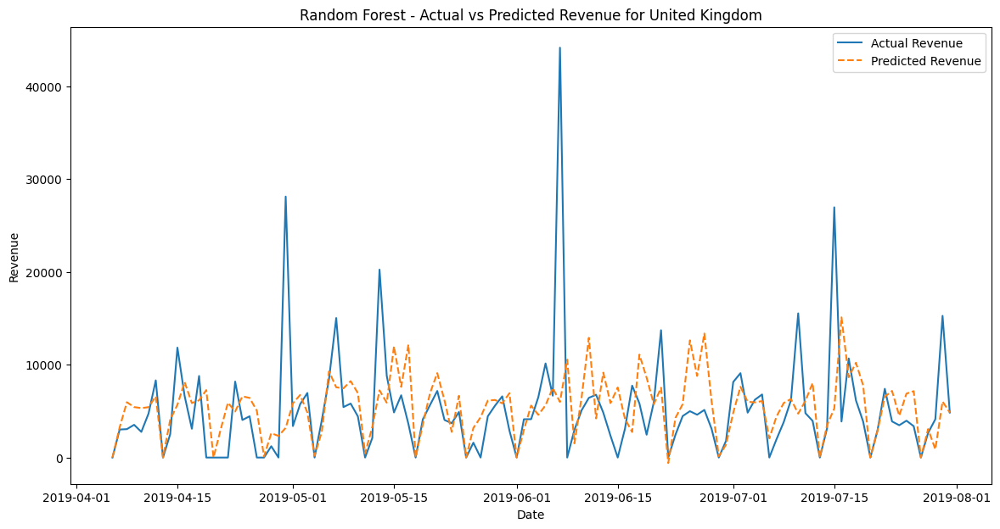

[Decision Tree] Test RMSE for United Kingdom: 11529.47005135978
[Decision Tree] Test MAE for United Kingdom: 5522.824854700855
[Decision Tree] Test R^2 for United Kingdom: -2.756637164733071


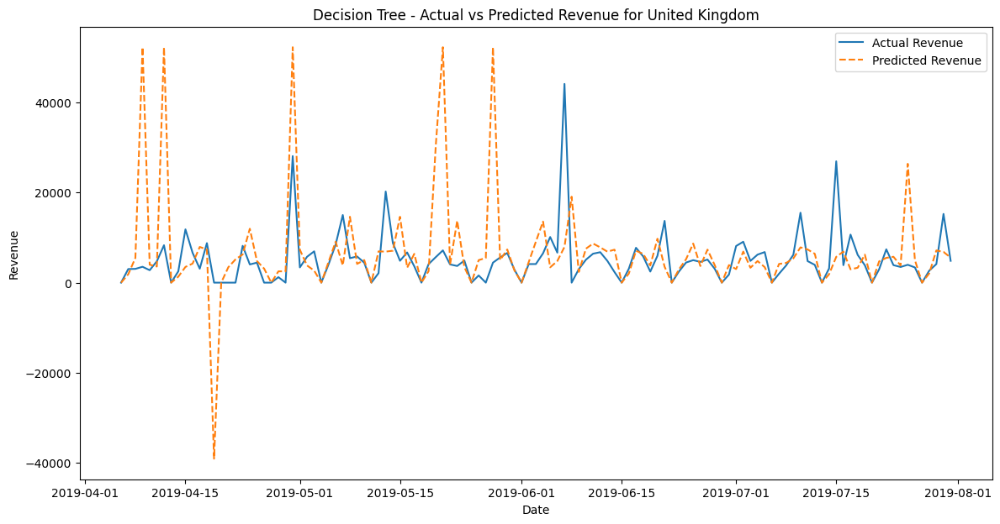

[Gradient Boosting] Test RMSE for United Kingdom: 6894.413567215536
[Gradient Boosting] Test MAE for United Kingdom: 3852.030004796903
[Gradient Boosting] Test R^2 for United Kingdom: -0.34330682834323545


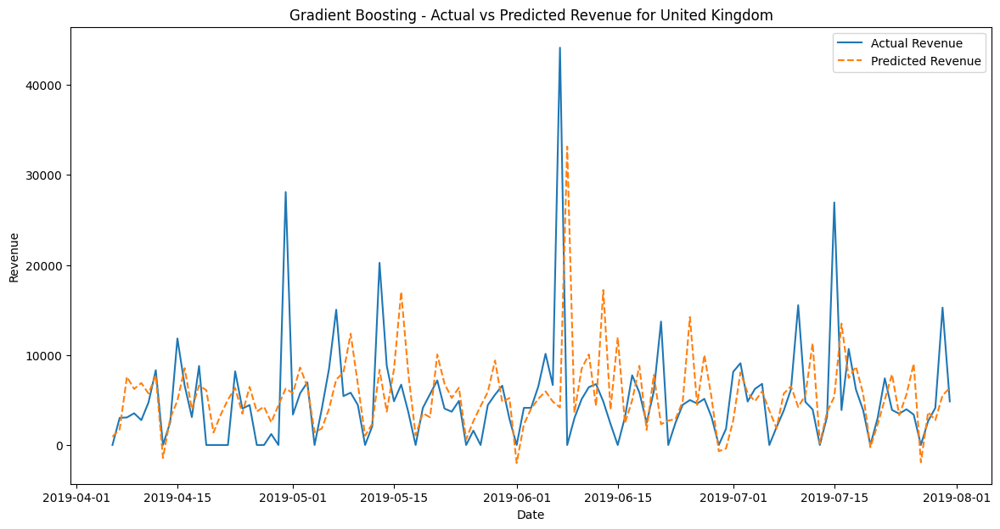

[Linear Regression] Test RMSE for United Kingdom: 5936.608327200756
[Linear Regression] Test MAE for United Kingdom: 3465.8452388697874
[Linear Regression] Test R^2 for United Kingdom: 0.004004552228072944


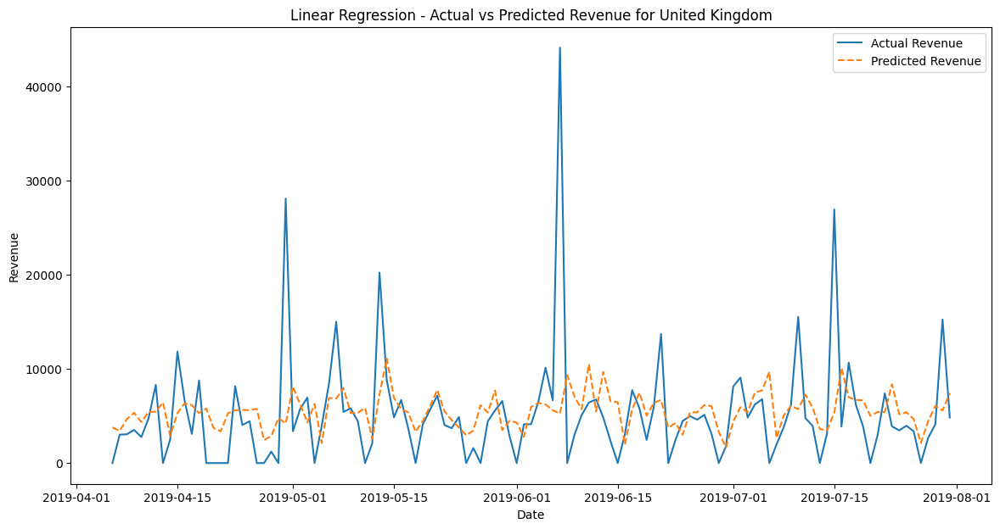

Running ARIMA model for United Kingdom
[ARIMA] RMSE for United Kingdom: 5946.4464300959235
[ARIMA] MAE for United Kingdom: 3547.214836249581
[ARIMA] R^2 for United Kingdom: 0.0007007045330033046


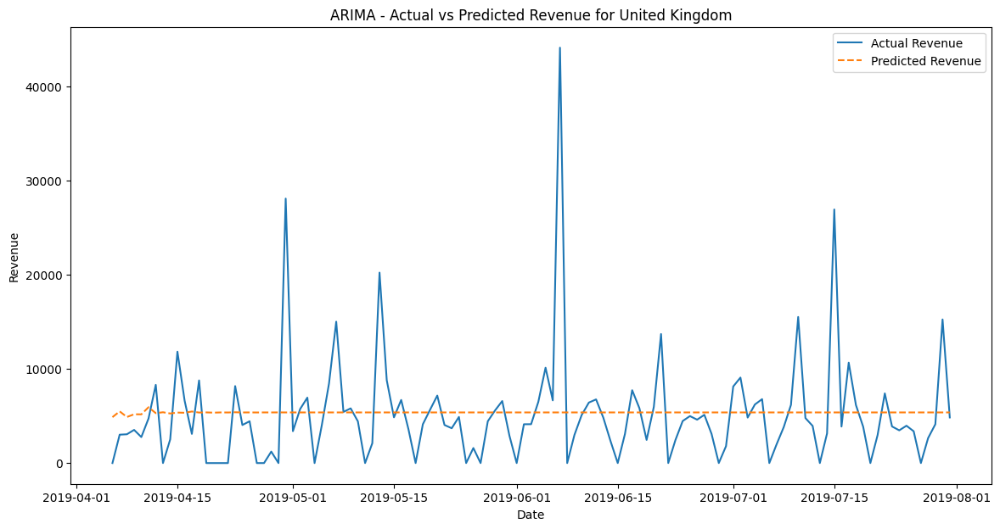

[Random Forest] Test RMSE for EIRE: 634.2131875017212
[Random Forest] Test MAE for EIRE: 212.71971206896552
[Random Forest] Test R^2 for EIRE: -0.14002774570021614


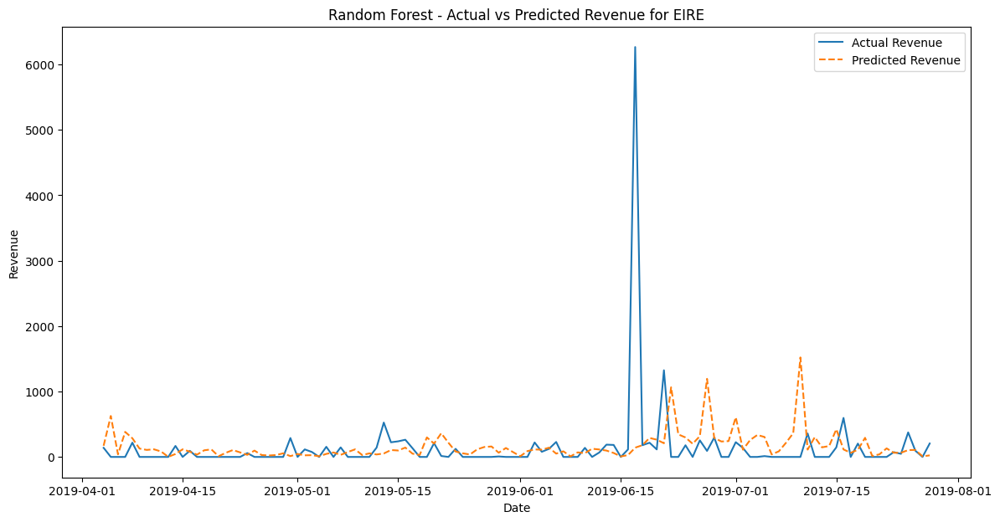

[Decision Tree] Test RMSE for EIRE: 622.6921970689189
[Decision Tree] Test MAE for EIRE: 171.97991379310344
[Decision Tree] Test R^2 for EIRE: -0.09898491677598087


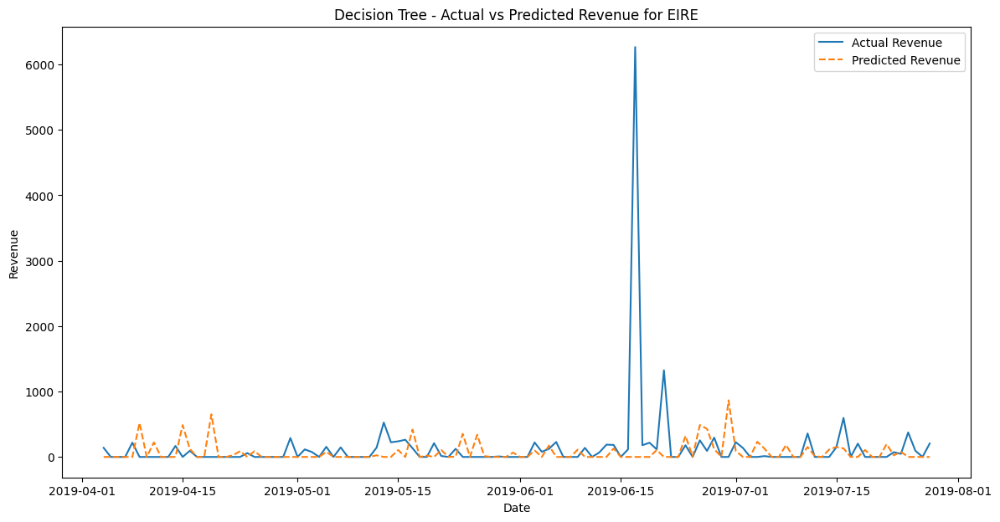

[Gradient Boosting] Test RMSE for EIRE: 603.6586148246624
[Gradient Boosting] Test MAE for EIRE: 183.72645156415356
[Gradient Boosting] Test R^2 for EIRE: -0.03282725604132941


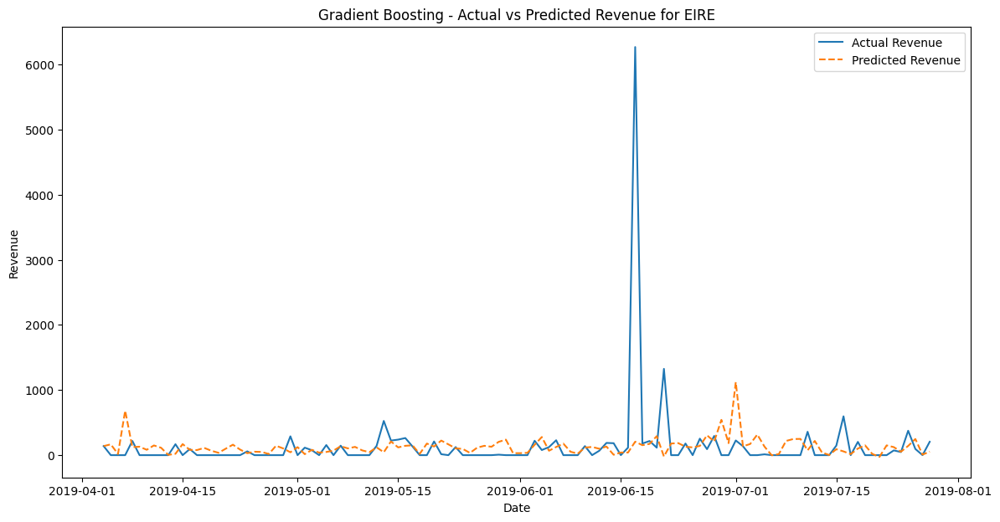

[Linear Regression] Test RMSE for EIRE: 617.9522825247823
[Linear Regression] Test MAE for EIRE: 213.9935755603001
[Linear Regression] Test R^2 for EIRE: -0.08231771304855373


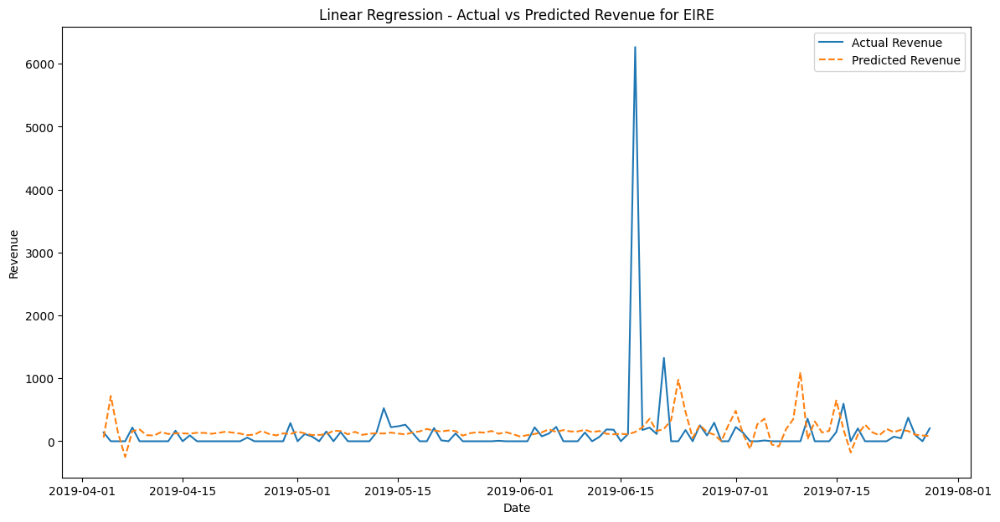

Running ARIMA model for EIRE
[ARIMA] RMSE for EIRE: 596.13299392026
[ARIMA] MAE for EIRE: 156.78097204007003
[ARIMA] R^2 for EIRE: -0.0072359151309961955


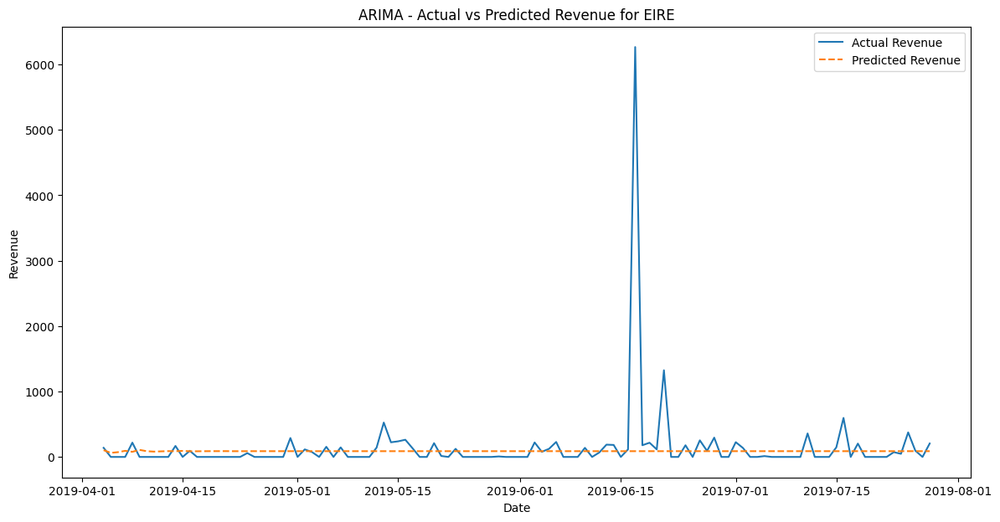

[Random Forest] Test RMSE for Germany: 188.8621845375513
[Random Forest] Test MAE for Germany: 105.9942181196581
[Random Forest] Test R^2 for Germany: -0.467898867869869


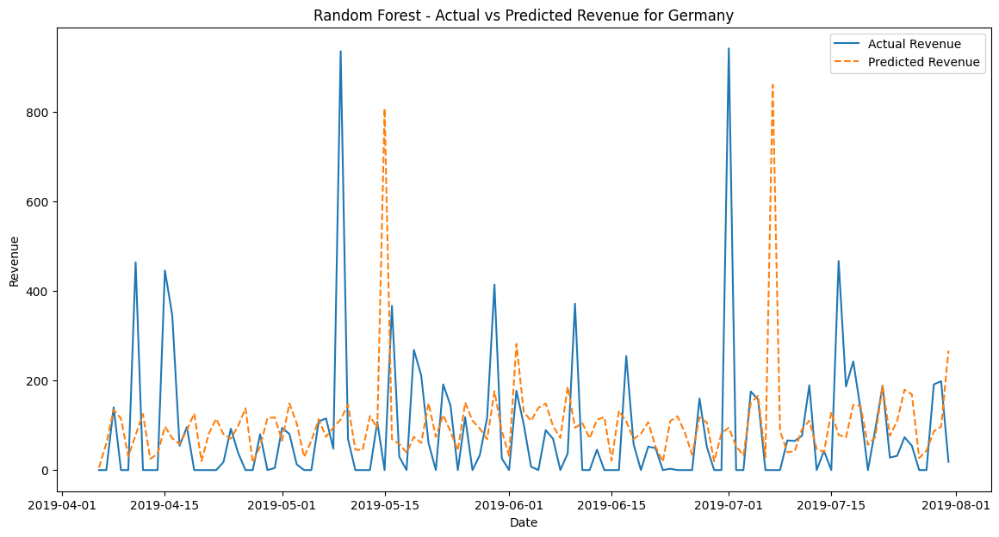

[Decision Tree] Test RMSE for Germany: 279.33703997297465
[Decision Tree] Test MAE for Germany: 130.77009401709398
[Decision Tree] Test R^2 for Germany: -2.211169066108751


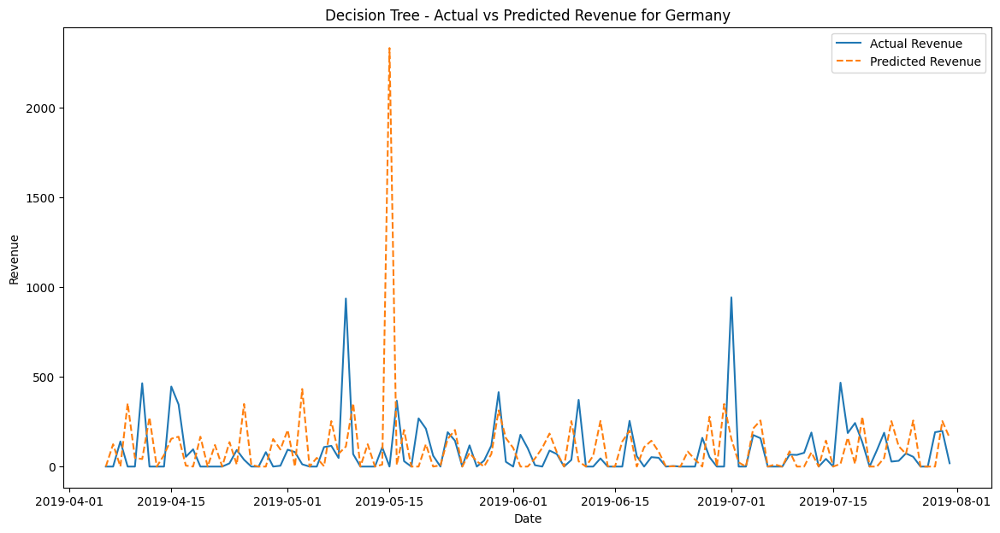

[Gradient Boosting] Test RMSE for Germany: 262.82425492092756
[Gradient Boosting] Test MAE for Germany: 120.06581358270861
[Gradient Boosting] Test R^2 for Germany: -1.8427390920209321


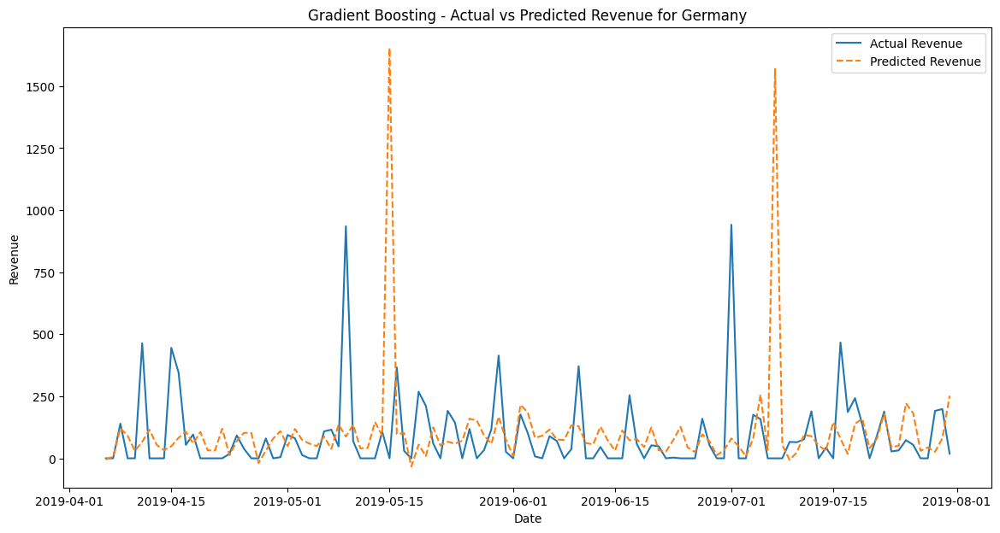

[Linear Regression] Test RMSE for Germany: 158.5299703609219
[Linear Regression] Test MAE for Germany: 97.4797579552249
[Linear Regression] Test R^2 for Germany: -0.034257966524958494


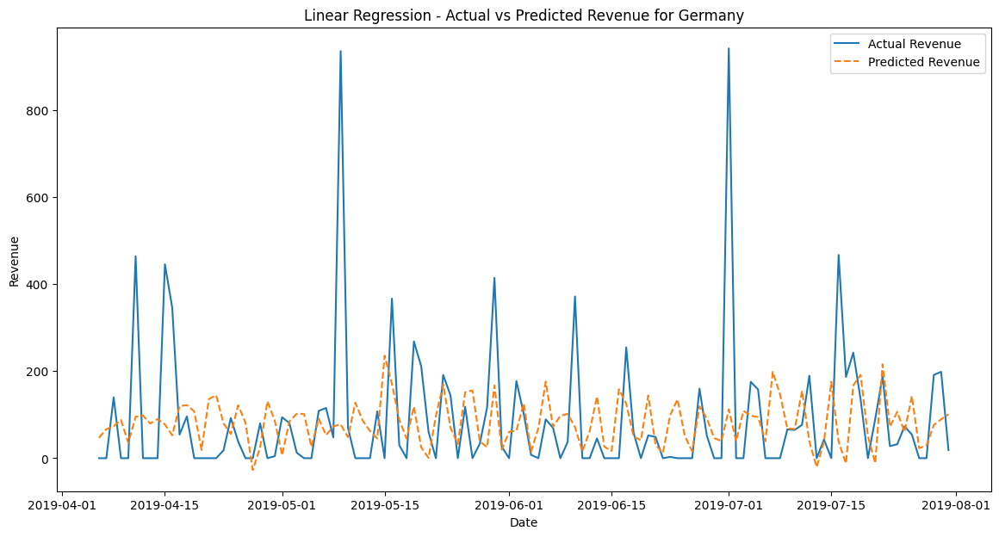

Running ARIMA model for Germany
[ARIMA] RMSE for Germany: 155.9439162859683
[ARIMA] MAE for Germany: 93.38839435390535
[ARIMA] R^2 for Germany: -0.0007900784434662356


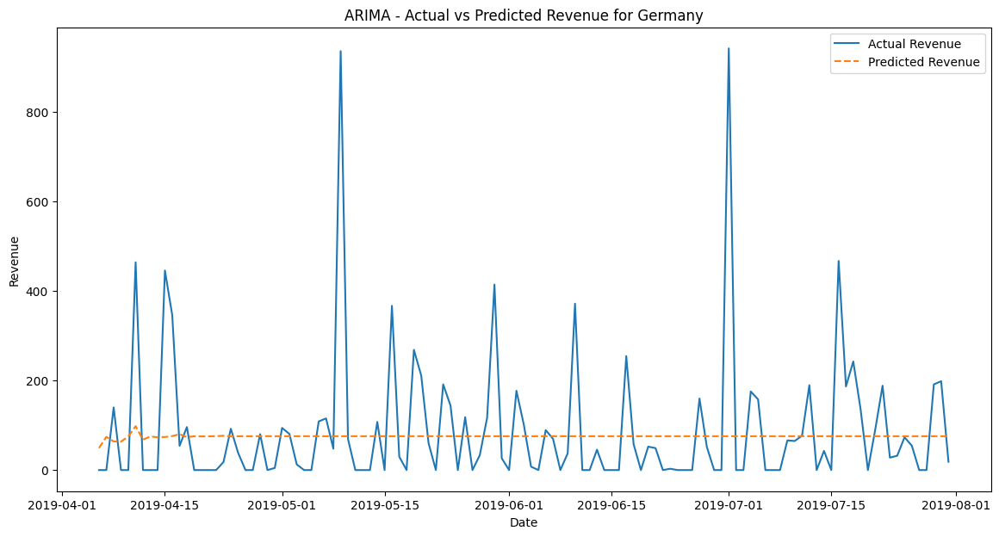

[Random Forest] Test RMSE for France: 187.46744607549815
[Random Forest] Test MAE for France: 101.99270683760683
[Random Forest] Test R^2 for France: -4.36095717746681


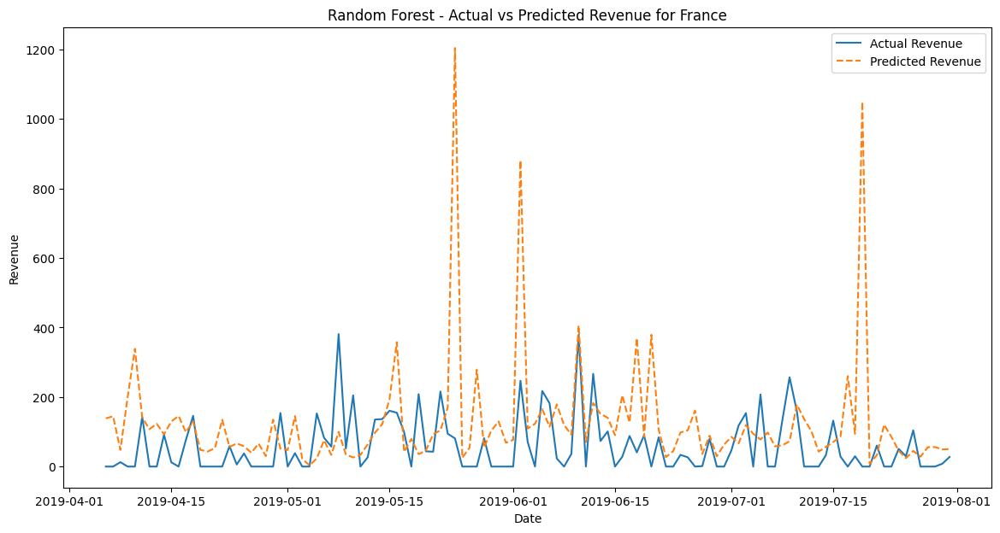

[Decision Tree] Test RMSE for France: 349.0548883588074
[Decision Tree] Test MAE for France: 128.23162393162394
[Decision Tree] Test R^2 for France: -17.585663135883465


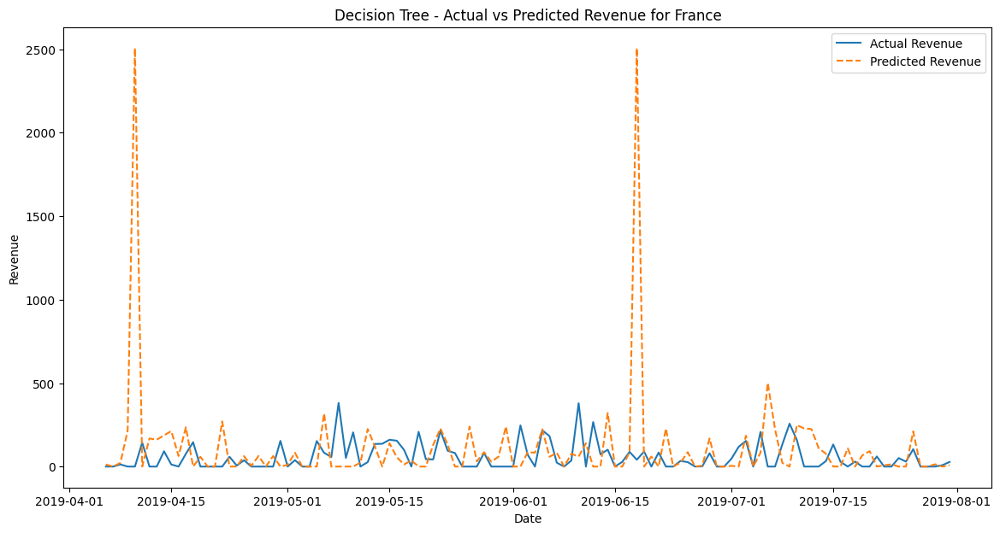

[Gradient Boosting] Test RMSE for France: 107.1216498682822
[Gradient Boosting] Test MAE for France: 78.06701706175411
[Gradient Boosting] Test R^2 for France: -0.750431492796074


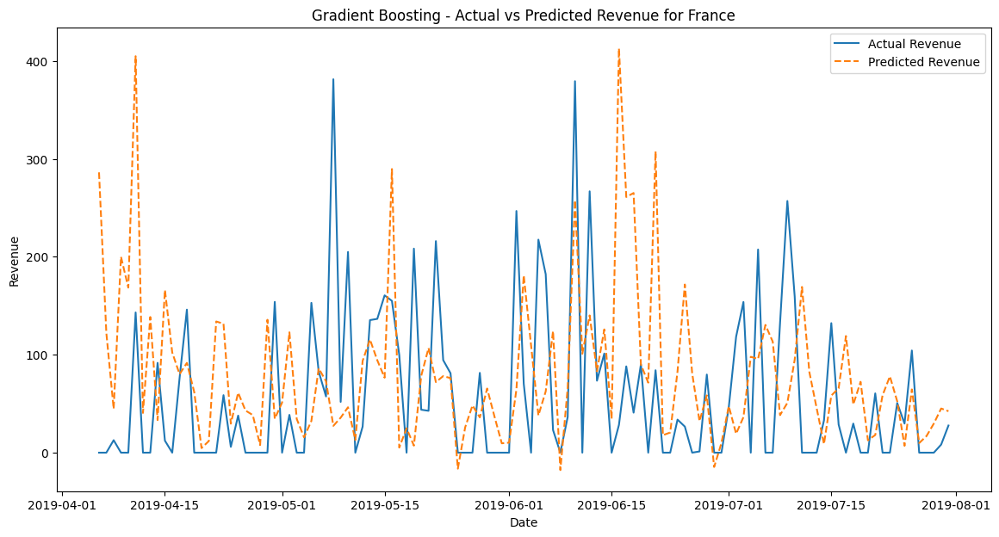

[Linear Regression] Test RMSE for France: 81.58166232518438
[Linear Regression] Test MAE for France: 63.41500034860349
[Linear Regression] Test R^2 for France: -0.015256346596866477


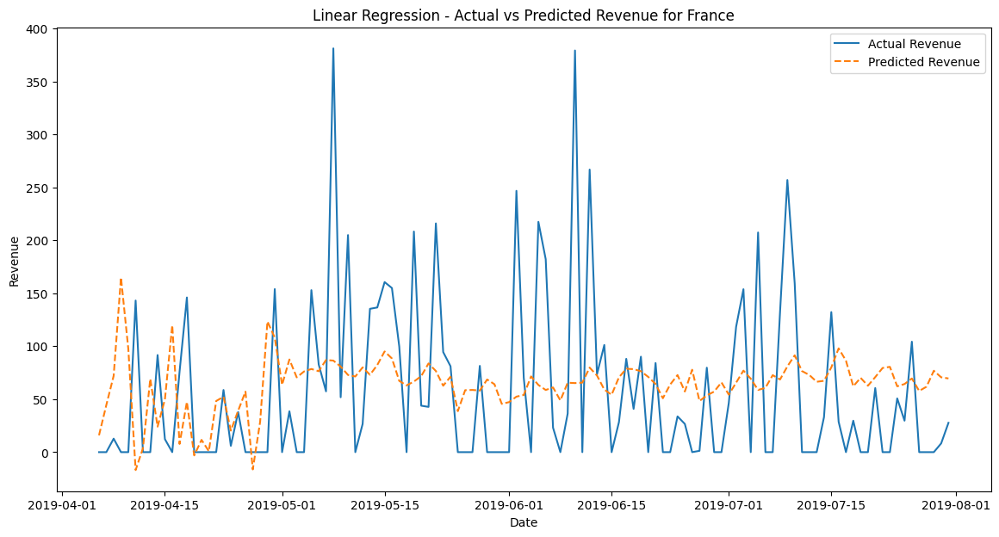

Running ARIMA model for France
[ARIMA] RMSE for France: 338.4872418270257
[ARIMA] MAE for France: 326.91740242283754
[ARIMA] R^2 for France: -16.477335388162285


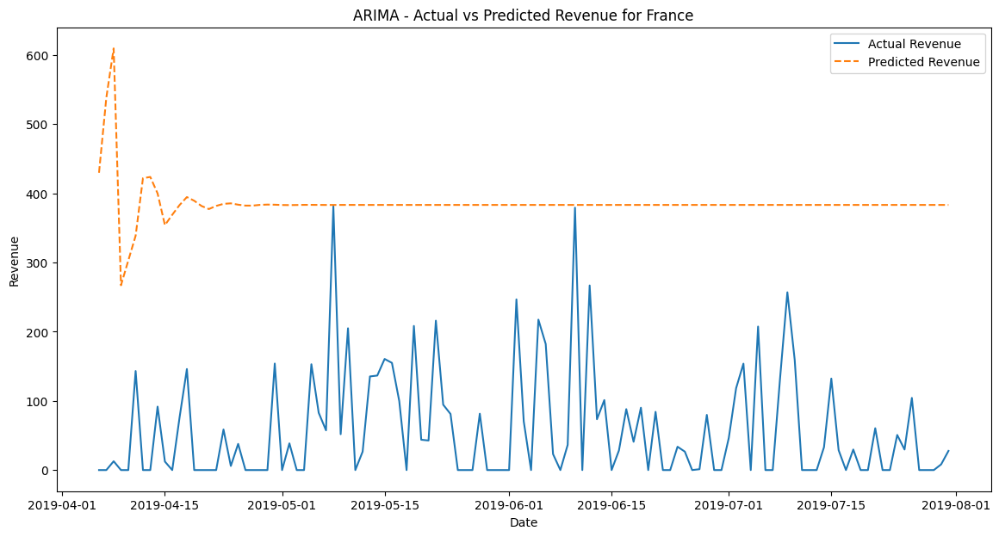

[Random Forest] Test RMSE for Norway: 135.3057092273263
[Random Forest] Test MAE for Norway: 96.48253060873247
[Random Forest] Test R^2 for Norway: -1.4682730810581979


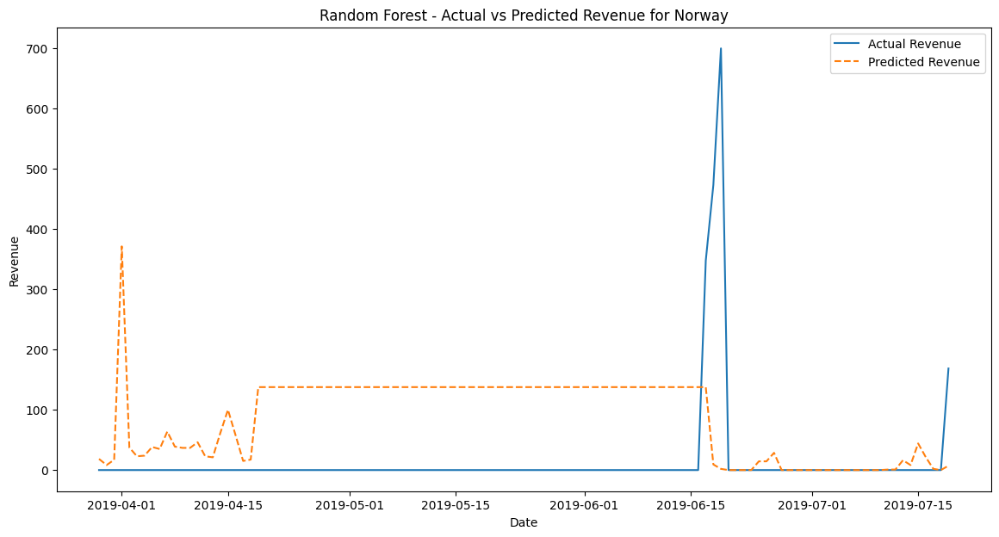

[Decision Tree] Test RMSE for Norway: 210.835074774836
[Decision Tree] Test MAE for Norway: 105.12515449852509
[Decision Tree] Test R^2 for Norway: -4.993033251640601


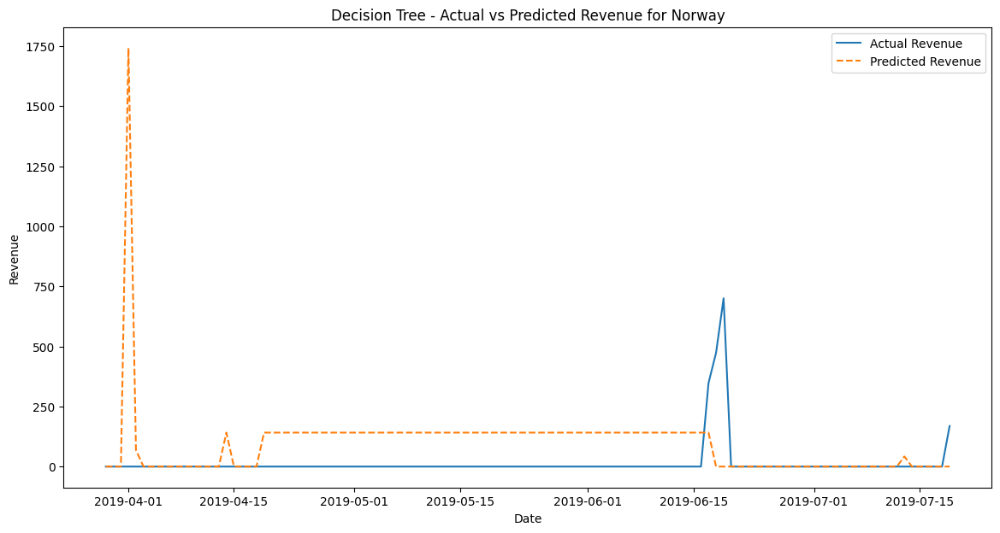

[Gradient Boosting] Test RMSE for Norway: 121.85217560754721
[Gradient Boosting] Test MAE for Norway: 92.47530432347655
[Gradient Boosting] Test R^2 for Norway: -1.0018315888442362


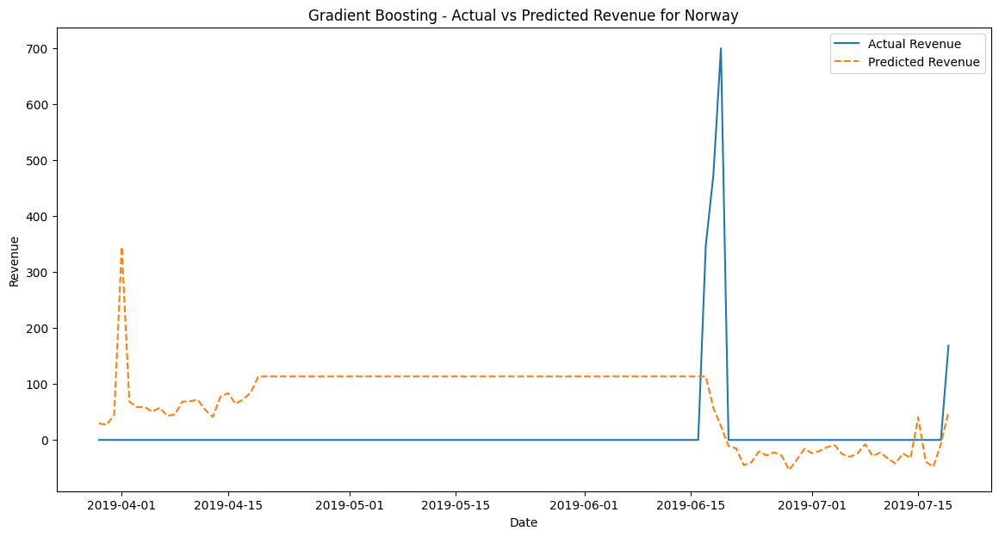

[Linear Regression] Test RMSE for Norway: 112.49707974801474
[Linear Regression] Test MAE for Norway: 96.03938416425707
[Linear Regression] Test R^2 for Norway: -0.706253128488955


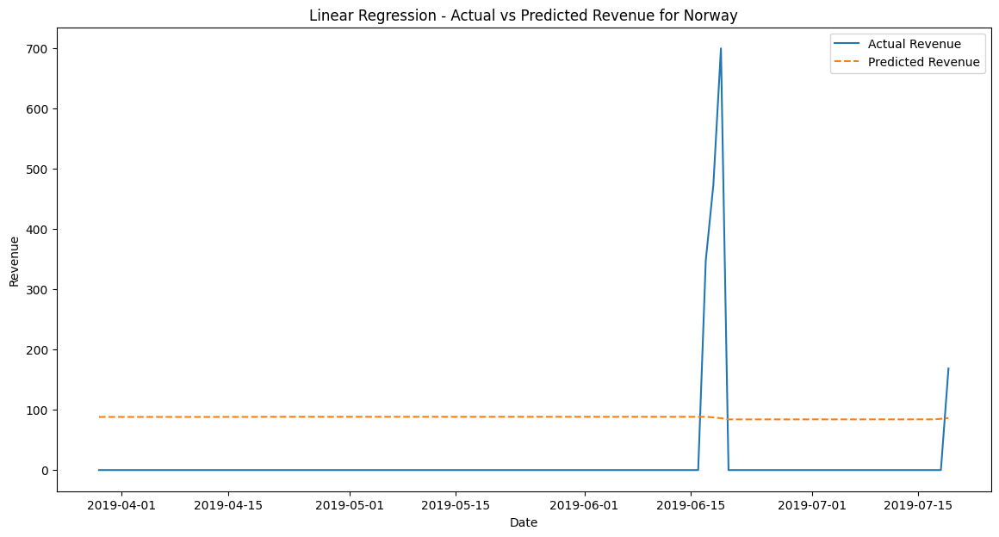

Running ARIMA model for Norway
[ARIMA] RMSE for Norway: 87.41154874996356
[ARIMA] MAE for Norway: 14.953097345132742
[ARIMA] R^2 for Norway: -0.030145554999311264


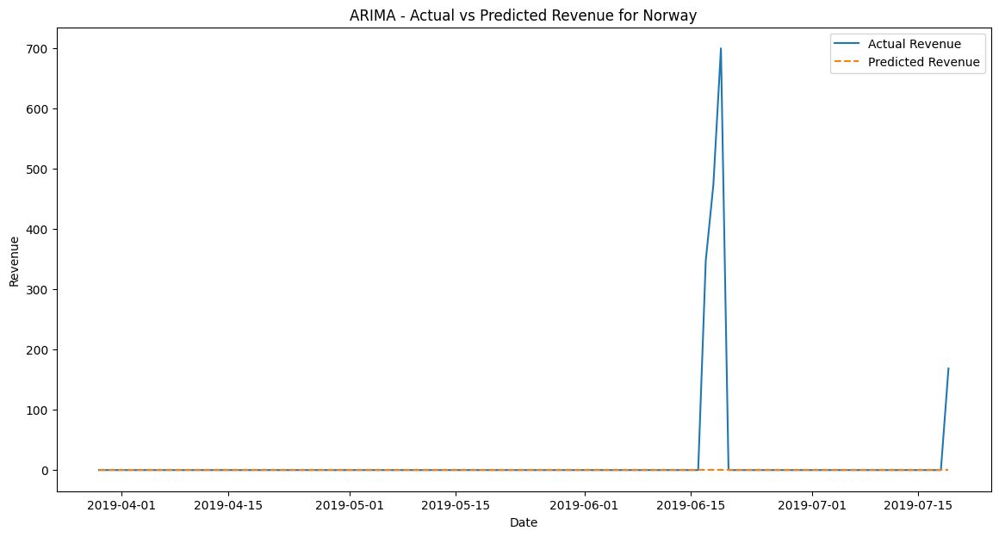

[Random Forest] Test RMSE for Spain: 77.19445769226851
[Random Forest] Test MAE for Spain: 36.35797565217391
[Random Forest] Test R^2 for Spain: -1.1924955986323802


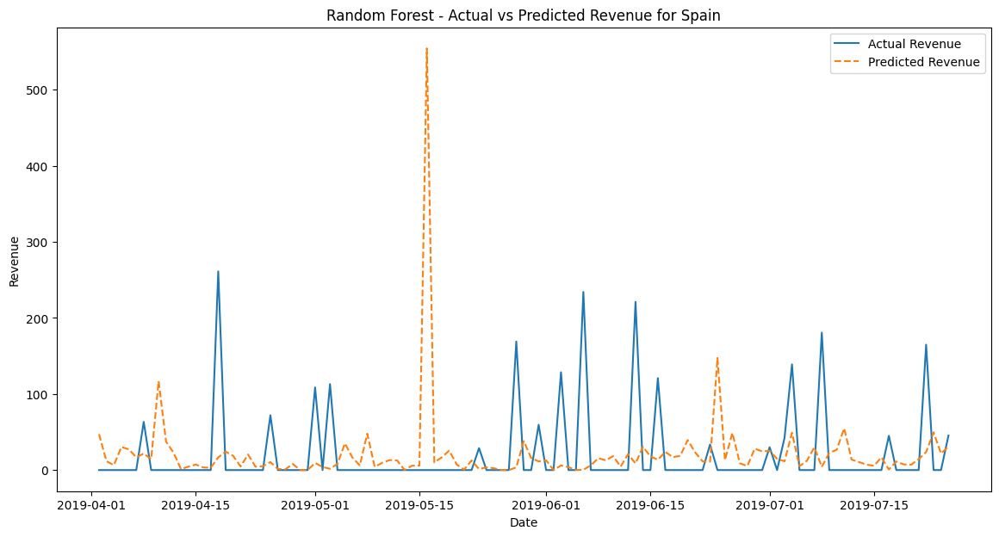

[Decision Tree] Test RMSE for Spain: 135.08505327160108
[Decision Tree] Test MAE for Spain: 51.284869565217384
[Decision Tree] Test R^2 for Spain: -5.713996119408868


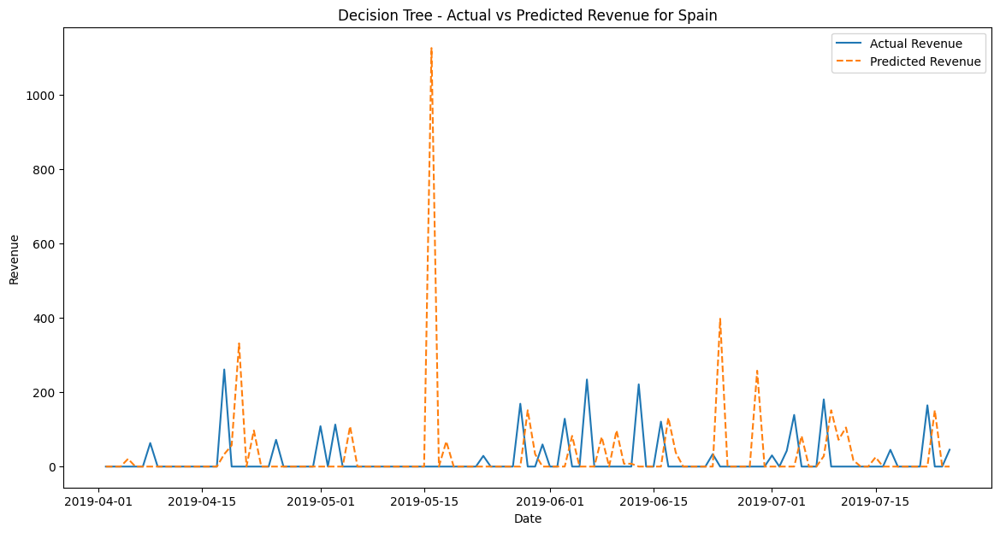

[Gradient Boosting] Test RMSE for Spain: 101.78818617735857
[Gradient Boosting] Test MAE for Spain: 35.38074969078466
[Gradient Boosting] Test R^2 for Spain: -2.8120732760635385


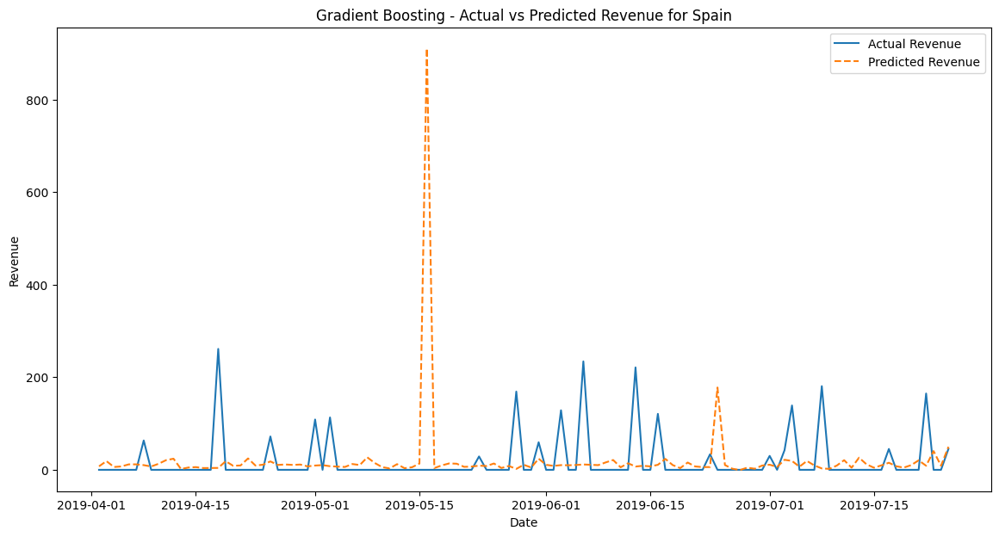

[Linear Regression] Test RMSE for Spain: 56.51776546815334
[Linear Regression] Test MAE for Spain: 36.99697827727555
[Linear Regression] Test R^2 for Spain: -0.17526676465671231


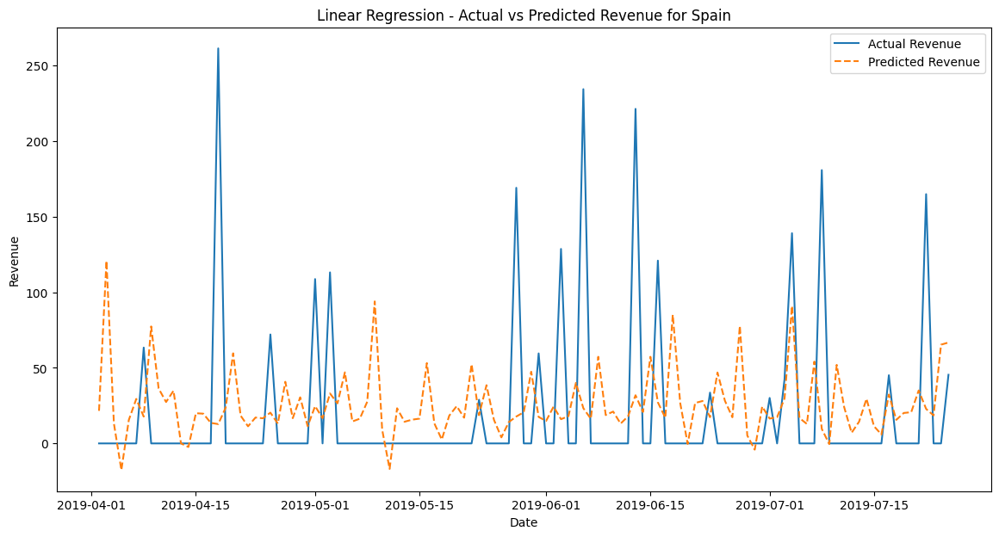

Running ARIMA model for Spain
[ARIMA] RMSE for Spain: 55.7207527883853
[ARIMA] MAE for Spain: 19.669826086956522
[ARIMA] R^2 for Spain: -0.14235329670735242


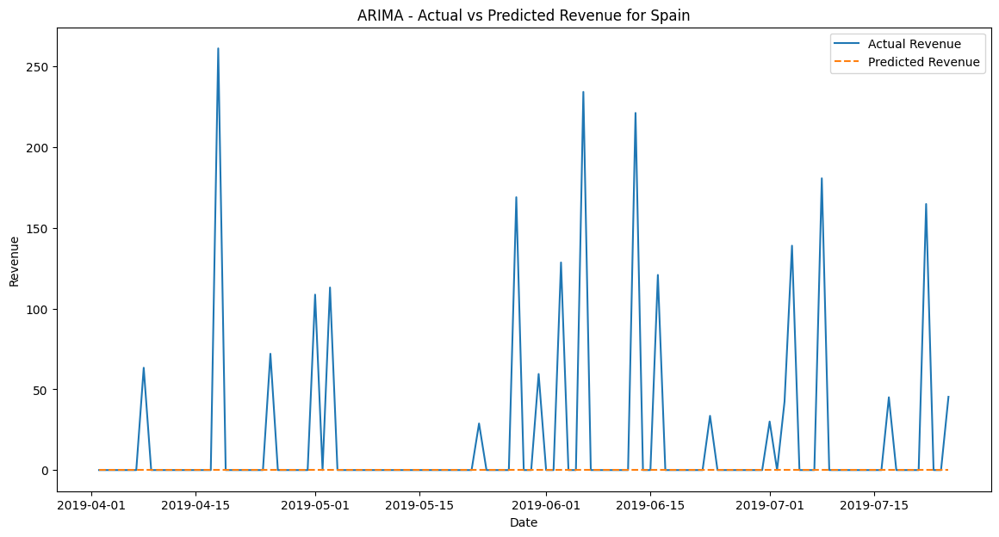

[Random Forest] Test RMSE for Hong Kong: 35.084858705149685
[Random Forest] Test MAE for Hong Kong: 20.940710324853335
[Random Forest] Test R^2 for Hong Kong: -0.5885151739407761


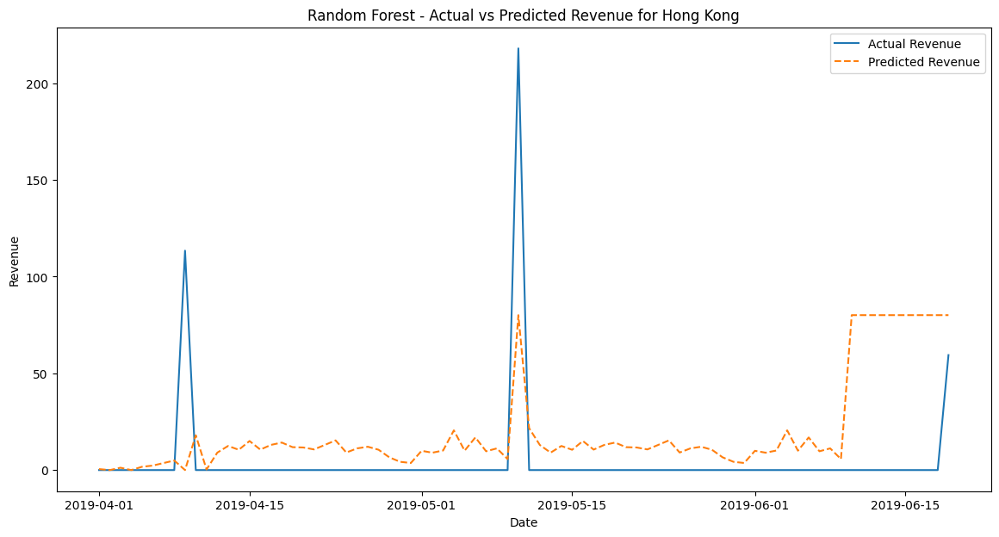

[Decision Tree] Test RMSE for Hong Kong: 33.01414537395797
[Decision Tree] Test MAE for Hong Kong: 12.139495111731845
[Decision Tree] Test R^2 for Hong Kong: -0.4065397901399139


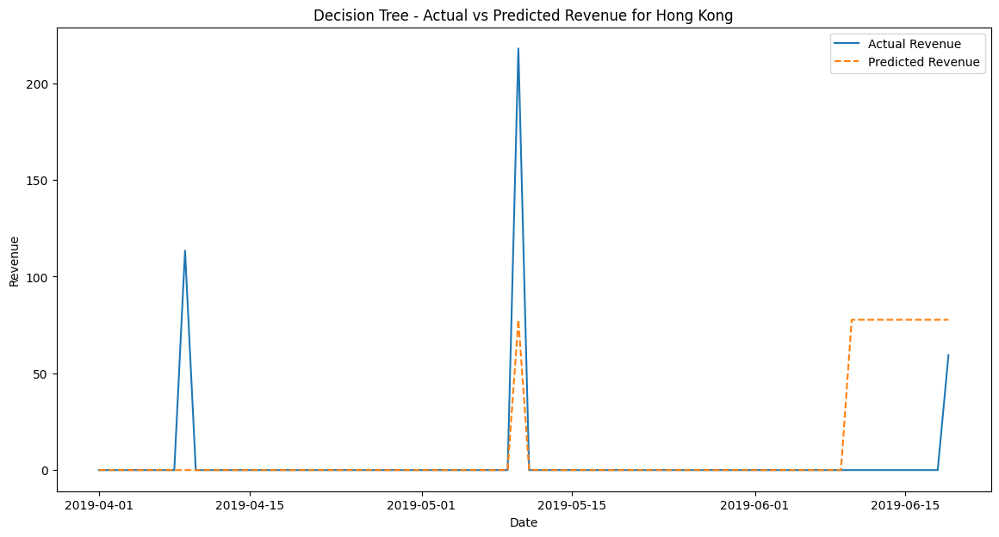

[Gradient Boosting] Test RMSE for Hong Kong: 36.093041171645915
[Gradient Boosting] Test MAE for Hong Kong: 30.087760878611903
[Gradient Boosting] Test R^2 for Hong Kong: -0.6811205530721274


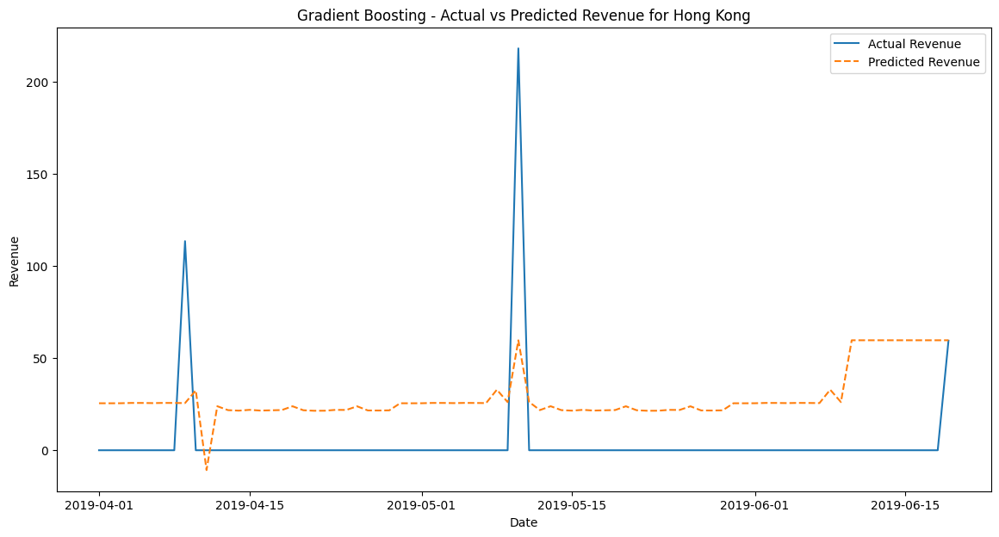

[Linear Regression] Test RMSE for Hong Kong: 56.910462261769595
[Linear Regression] Test MAE for Hong Kong: 52.850078245393455
[Linear Regression] Test R^2 for Hong Kong: -3.179613568838109


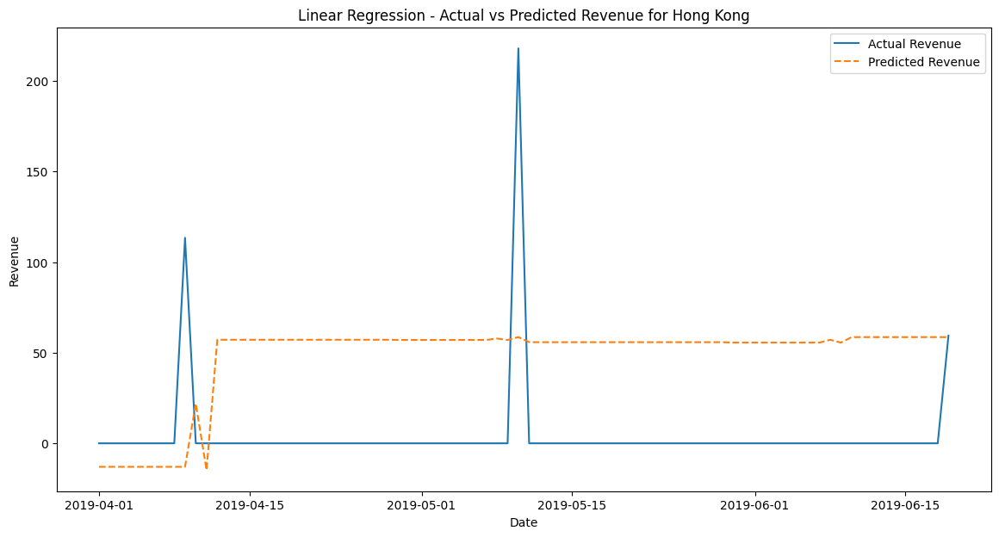

Running ARIMA model for Hong Kong
[ARIMA] RMSE for Hong Kong: 28.262497965501915
[ARIMA] MAE for Hong Kong: 4.8851249999999995
[ARIMA] R^2 for Hong Kong: -0.03079663499125962


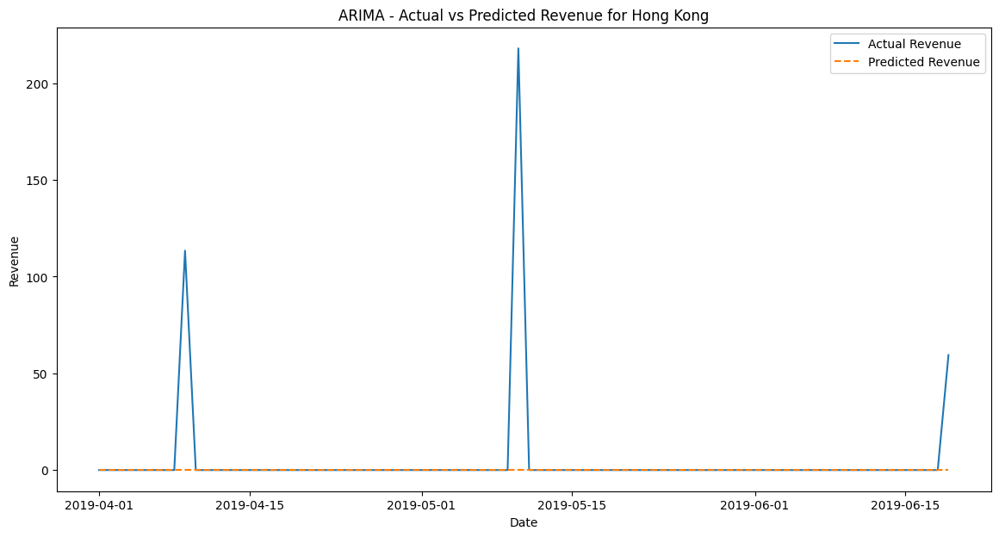

[Random Forest] Test RMSE for Portugal: 576.9470175216388
[Random Forest] Test MAE for Portugal: 79.52305679285732
[Random Forest] Test R^2 for Portugal: -0.015330752560594352


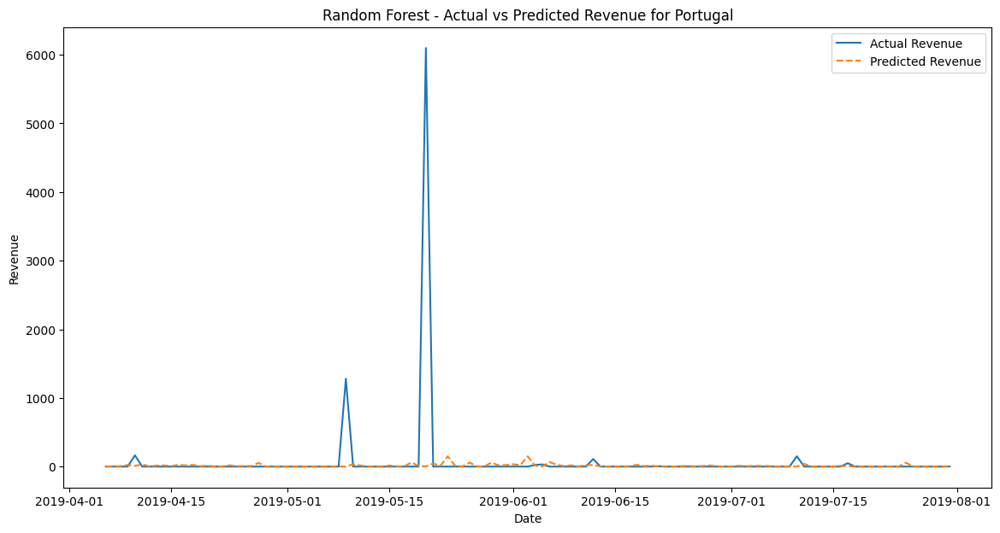

[Decision Tree] Test RMSE for Portugal: 577.6672833877484
[Decision Tree] Test MAE for Portugal: 79.61410256410257
[Decision Tree] Test R^2 for Portugal: -0.017867431137534417


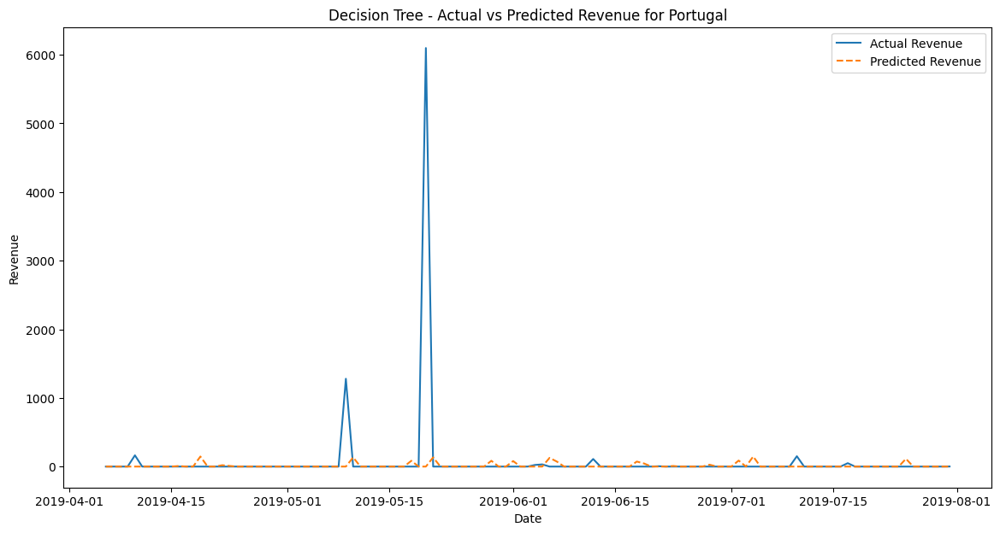

[Gradient Boosting] Test RMSE for Portugal: 576.6604385302691
[Gradient Boosting] Test MAE for Portugal: 82.92423006531637
[Gradient Boosting] Test R^2 for Portugal: -0.014322340388393195


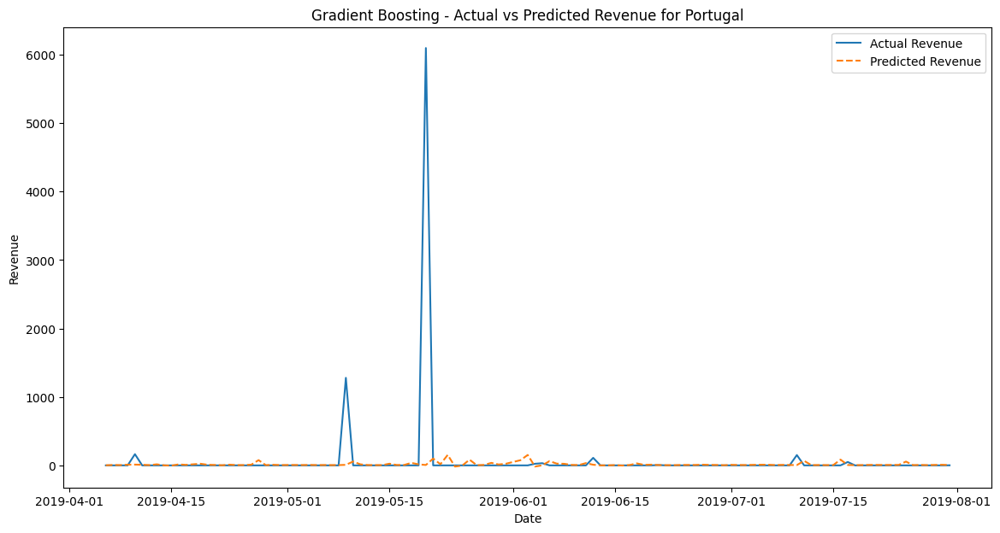

[Linear Regression] Test RMSE for Portugal: 593.8801249134182
[Linear Regression] Test MAE for Portugal: 126.8330816084363
[Linear Regression] Test R^2 for Portugal: -0.07580425462503815


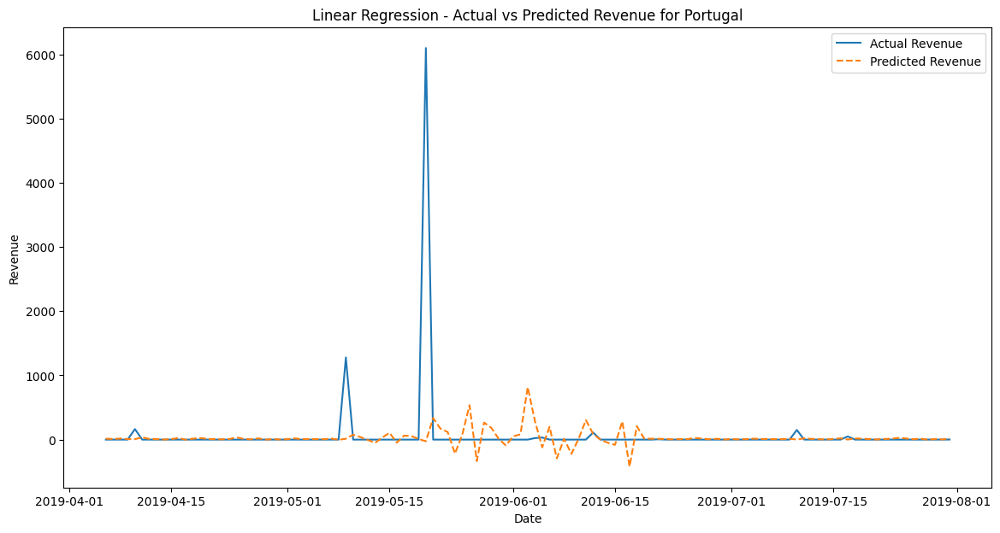

Running ARIMA model for Portugal
[ARIMA] RMSE for Portugal: 575.0313255701552
[ARIMA] MAE for Portugal: 79.96300137244539
[ARIMA] R^2 for Portugal: -0.008599348440138321


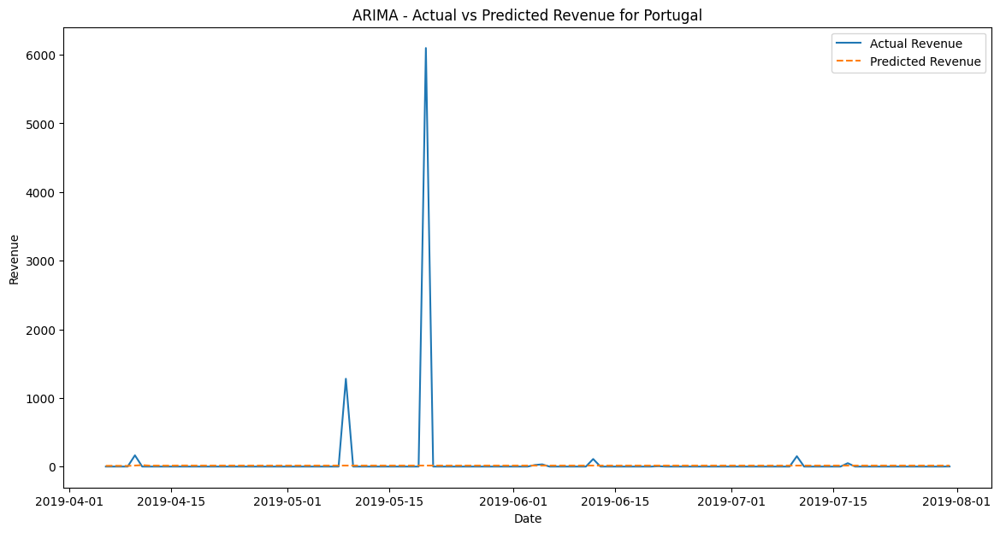

[Random Forest] Test RMSE for Singapore: 50.037944864422755
[Random Forest] Test MAE for Singapore: 45.30198812074483
[Random Forest] Test R^2 for Singapore: -3.0076362213119276


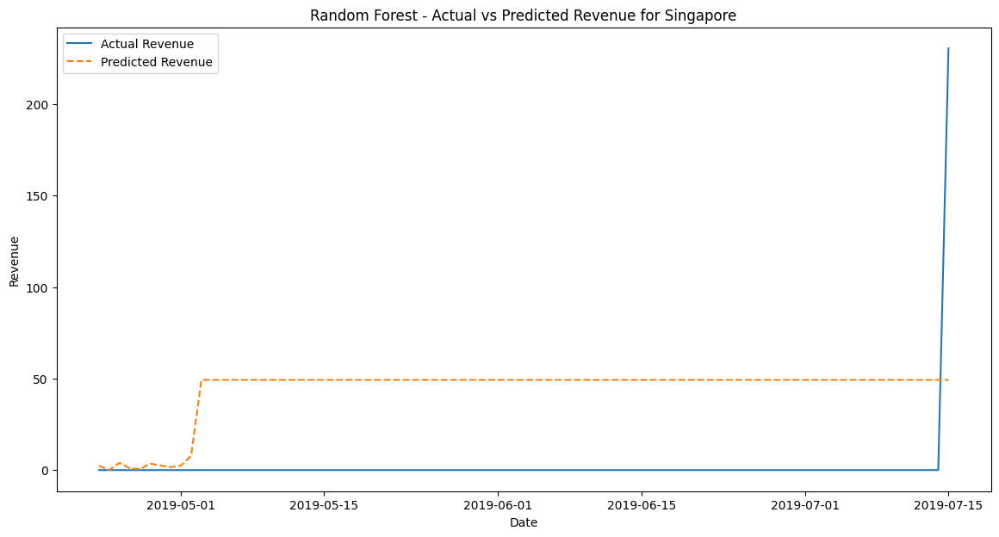

[Decision Tree] Test RMSE for Singapore: 50.809425553665434
[Decision Tree] Test MAE for Singapore: 45.82102040816325
[Decision Tree] Test R^2 for Singapore: -3.1321676592932155


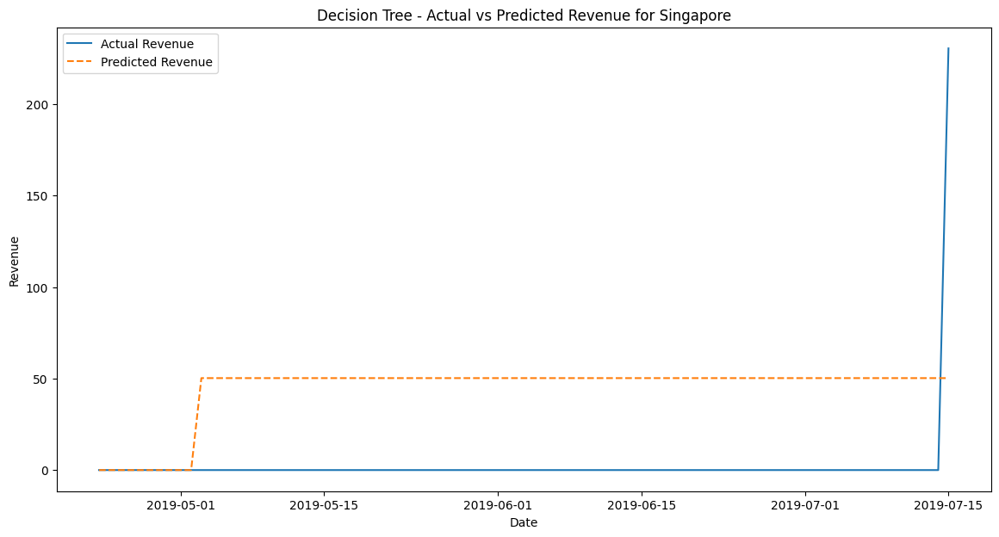

[Gradient Boosting] Test RMSE for Singapore: 46.98595170627544
[Gradient Boosting] Test MAE for Singapore: 42.640931880284974
[Gradient Boosting] Test R^2 for Singapore: -2.533665371308318


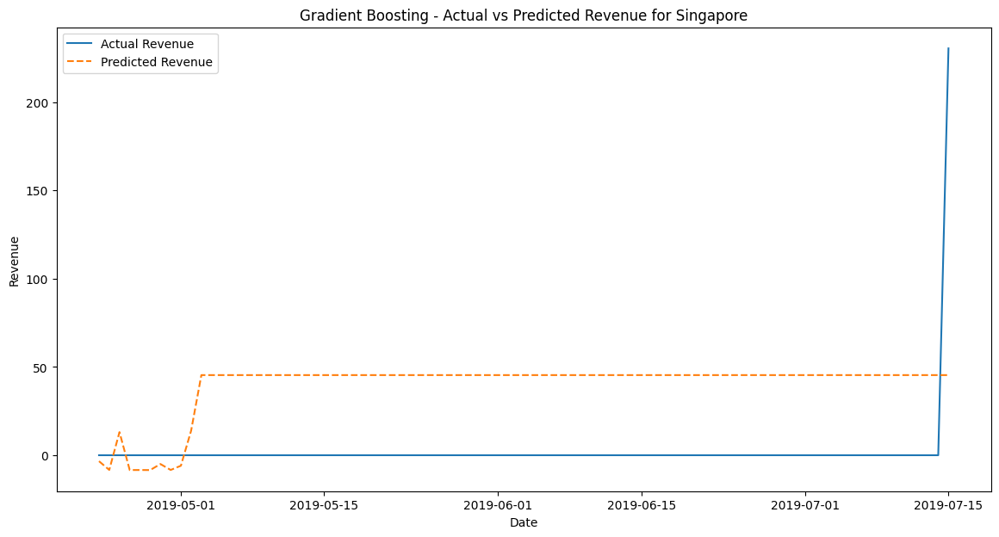

[Linear Regression] Test RMSE for Singapore: 710.4824688988354
[Linear Regression] Test MAE for Singapore: 272.02049417928055
[Linear Regression] Test R^2 for Singapore: -806.9716025566206


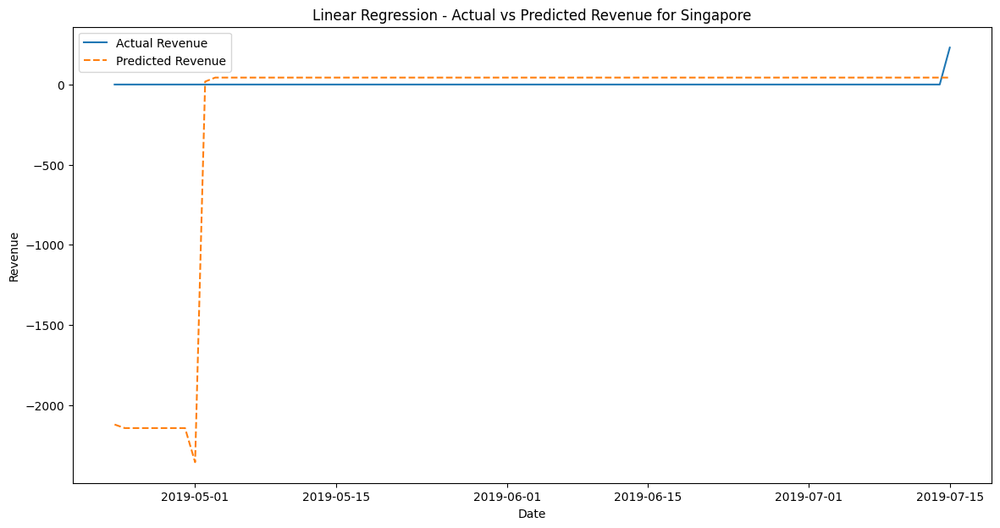

Running ARIMA model for Singapore
[ARIMA] RMSE for Singapore: 25.145247491893404
[ARIMA] MAE for Singapore: 2.7435714285714288
[ARIMA] R^2 for Singapore: -0.012048192771084487


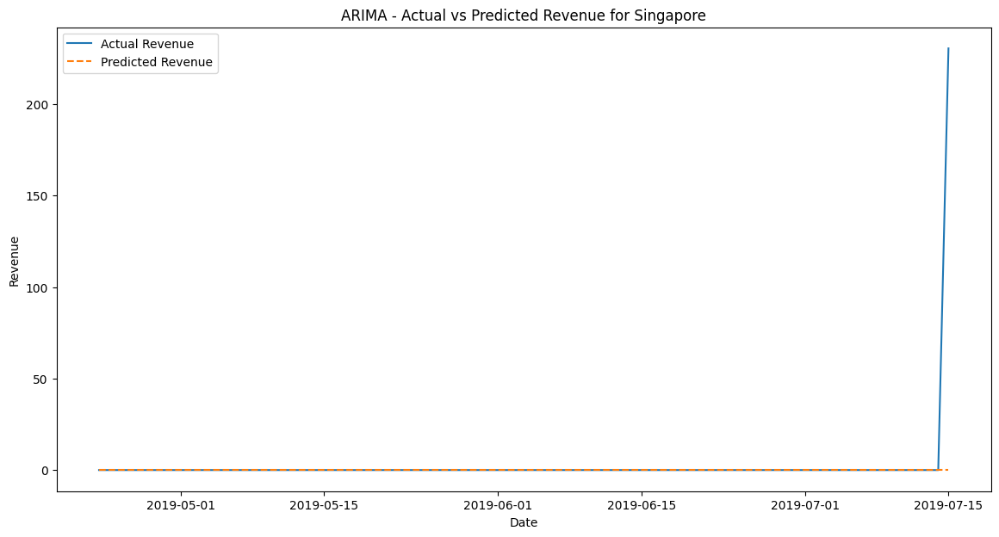

[Random Forest] Test RMSE for Netherlands: 55.07053105529962
[Random Forest] Test MAE for Netherlands: 29.25466228070176
[Random Forest] Test R^2 for Netherlands: -0.22739608539753875


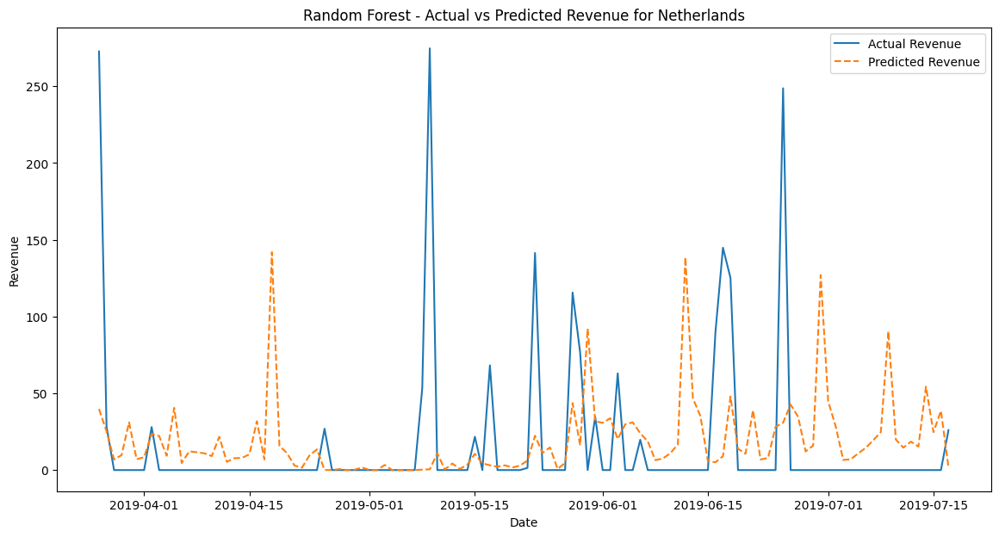

[Decision Tree] Test RMSE for Netherlands: 70.34266245603382
[Decision Tree] Test MAE for Netherlands: 28.098245614035086
[Decision Tree] Test R^2 for Netherlands: -1.002552033204768


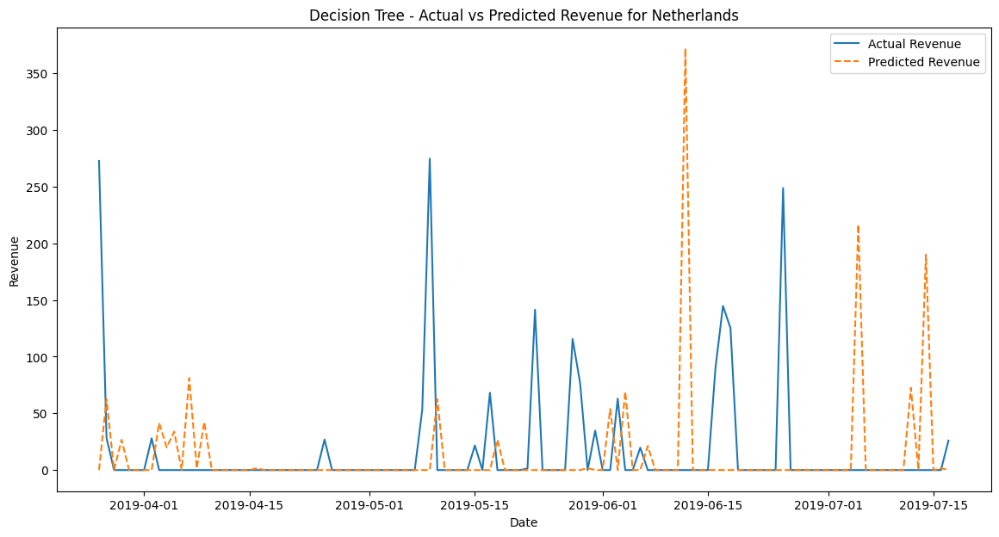

[Gradient Boosting] Test RMSE for Netherlands: 50.65866735510319
[Gradient Boosting] Test MAE for Netherlands: 28.284589939121666
[Gradient Boosting] Test R^2 for Netherlands: -0.03861293409036448


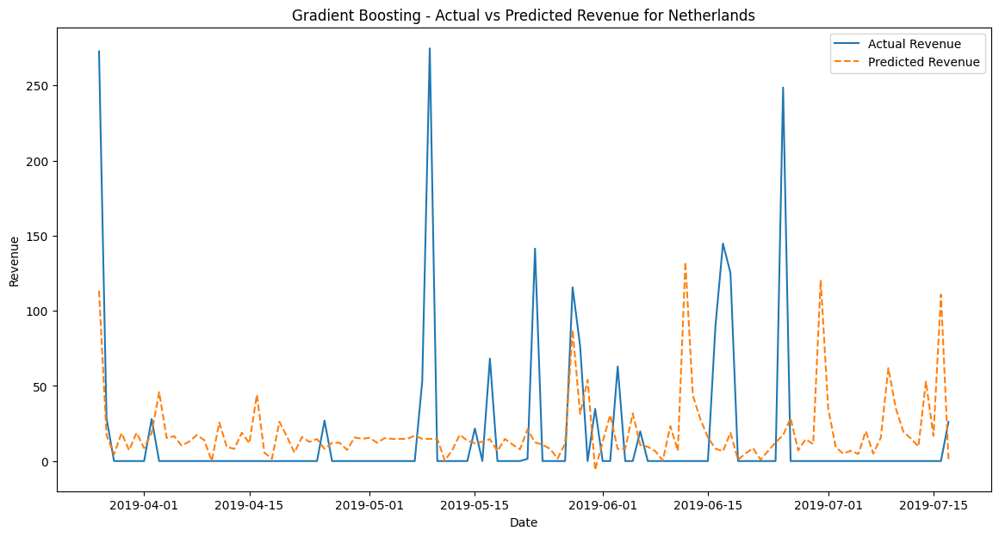

[Linear Regression] Test RMSE for Netherlands: 50.617624064315464
[Linear Regression] Test MAE for Netherlands: 32.680559165566834
[Linear Regression] Test R^2 for Netherlands: -0.03693066227366515


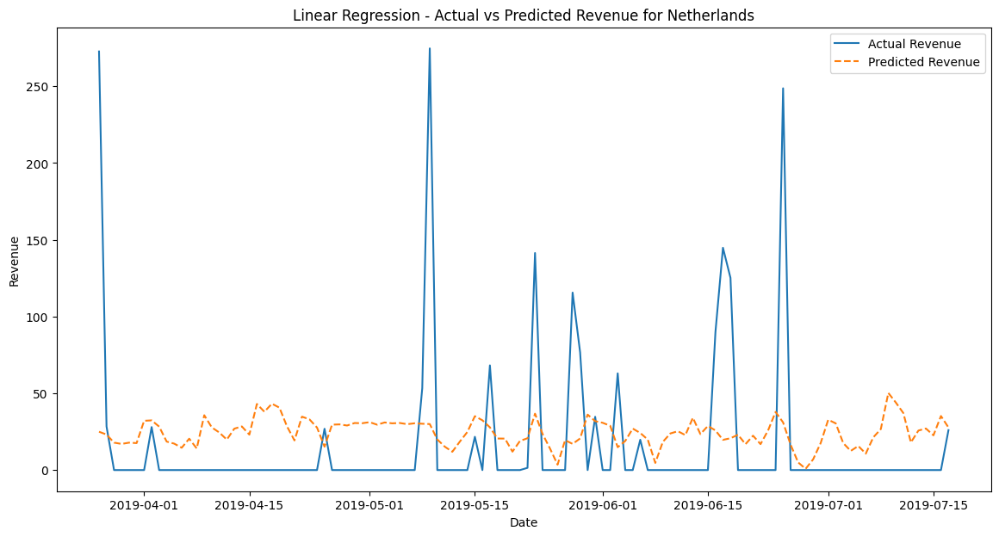

Running ARIMA model for Netherlands
[ARIMA] RMSE for Netherlands: 49.876207680924644
[ARIMA] MAE for Netherlands: 24.228400902372584
[ARIMA] R^2 for Netherlands: -0.006776463781776654


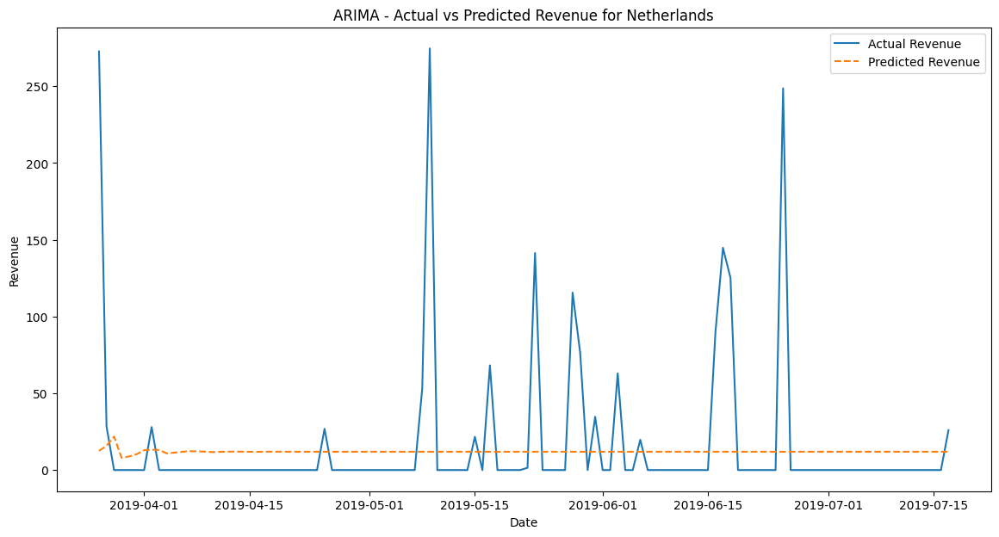

Model results have been saved to 'country_model_results.pkl'


In [32]:
import warnings
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import pickle
import numpy as np

# Suppress FutureWarnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Define models to compare
models = {
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42),
    'Linear Regression': LinearRegression(),
}

# Initialize dictionary to store results
results = {}

for country, df in country_lagged_revenues.items():
    X = df.drop('price', axis=1)
    y = df['price']

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    results[country] = {}

    for model_name, model in models.items():
        # Train the model on the full training set
        model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = model.predict(X_test)

        # Evaluate the model
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        # Store test set results
        results[country][model_name] = {
            'Test RMSE': rmse,
            'Test MAE': mae,
            'Test R^2': r2
        }

        print(f'[{model_name}] Test RMSE for {country}: {rmse}')
        print(f'[{model_name}] Test MAE for {country}: {mae}')
        print(f'[{model_name}] Test R^2 for {country}: {r2}')

        # Plot actual vs predicted revenue for the specific country
        plt.figure(figsize=(14, 7))
        plt.plot(y_test.index, y_test, label='Actual Revenue')
        plt.plot(y_test.index, y_pred, label='Predicted Revenue', linestyle='--')
        plt.legend()
        plt.title(f'{model_name} - Actual vs Predicted Revenue for {country}')
        plt.xlabel('Date')
        plt.ylabel('Revenue')
        plt.show()

    # ARIMA model for time-series specific
    print(f'Running ARIMA model for {country}')
    order = (5, 1, 0)  # ARIMA parameters (you may need to tune this)
    arima_model = ARIMA(y_train, order=order)
    arima_model_fit = arima_model.fit()

    y_pred_arima = arima_model_fit.forecast(steps=len(y_test))

    rmse_arima = mean_squared_error(y_test, y_pred_arima, squared=False)
    mae_arima = mean_absolute_error(y_test, y_pred_arima)
    r2_arima = r2_score(y_test, y_pred_arima)

    # Store ARIMA results
    results[country]['ARIMA'] = {
        'Test RMSE': rmse_arima,
        'Test MAE': mae_arima,
        'Test R^2': r2_arima
    }

    print(f'[ARIMA] RMSE for {country}: {rmse_arima}')
    print(f'[ARIMA] MAE for {country}: {mae_arima}')
    print(f'[ARIMA] R^2 for {country}: {r2_arima}')

    # Plot ARIMA results
    plt.figure(figsize=(14, 7))
    plt.plot(y_test.index, y_test, label='Actual Revenue')
    plt.plot(y_test.index, y_pred_arima, label='Predicted Revenue', linestyle='--')
    plt.legend()
    plt.title(f'ARIMA - Actual vs Predicted Revenue for {country}')
    plt.xlabel('Date')
    plt.ylabel('Revenue')
    plt.show()

# Save the results dictionary to a file
with open('country_model_results.pkl', 'wb') as f:
    pickle.dump(results, f)

print("Model results have been saved to 'country_model_results.pkl'")

### Random Forest
- **Performance**: The Random Forest model showed strong performance across multiple countries with relatively low RMSE and MAE values and high \( R^2 \) scores. However, its performance was generally not as strong as Gradient Boosting in most cases. 
- **Strengths**: Handles complex relationships well and is less prone to overfitting compared to simpler models like Decision Trees.
- **Weaknesses**: Slightly less accurate compared to Gradient Boosting, especially in terms of RMSE.

### Decision Tree
- **Performance**: The Decision Tree model performed reasonably well but often lagged behind both Random Forest and Gradient Boosting in terms of predictive accuracy. It showed higher RMSE and MAE values, and the \( R^2 \) scores were lower.
- **Strengths**: Simple to interpret and understand.
- **Weaknesses**: Prone to overfitting, especially with small datasets or noisy data. It does not capture complex relationships as effectively as ensemble methods.

### Gradient Boosting
- **Performance**: Gradient Boosting consistently delivered strong results across all countries. It showed the lowest RMSE and MAE values among all models (excluding Linear Regression) and maintained high \( R^2 \) scores.
- **Strengths**: Excellent at capturing complex relationships in the data, handles outliers well, and generally avoids overfitting through techniques like learning rate tuning and regularization.
- **Weaknesses**: Computationally intensive, which might be a concern with very large datasets, but this was not an issue in your context.

### Linear Regression
- **Performance**: Linear Regression yielded extremely high \( R^2 \) scores, often exactly 1.0, with very low RMSE and MAE values. However, these results are likely too good to be true, indicating that the model may be overfitting.
- **Overfitting Concern**: The perfect scores suggest that Linear Regression might be capturing noise or there could be data leakage, which makes its results unreliable.
- **Strengths**: Simple and fast to run, easy to interpret.
- **Weaknesses**: Prone to overfitting in the presence of multicollinearity or when the assumptions of linearity and independence are violated, as seems to be the case here.

### ARIMA
- **Performance**: ARIMA did not perform well compared to the other models, with much higher RMSE and MAE values and significantly lower \( R^2 \) scores, often negative. This suggests that ARIMA is not capturing the dynamics of the data as effectively as the machine learning models.
- **Strengths**: Well-suited for time series data that is stationary and follows the assumptions of the ARIMA model.
- **Weaknesses**: Poor performance when the data is not stationary or when complex, non-linear relationships exist in the data, which ARIMA cannot capture.

### Conclusion on the Most Robust Model:
Given the performance across all countries, **Gradient Boosting** stands out as the most robust and reliable model. It consistently performs well across different metrics (RMSE, MAE, and \( R^2 \)), does not show signs of overfitting like Linear Regression, and is superior to both Random Forest and ARIMA in this context. Therefore, **Gradient Boosting** is the recommended model for forecasting revenue in this scenario.

In [33]:
for country, df in country_lagged_revenues.items():
    print(df)

                price  revenue_lag_1  revenue_lag_2  revenue_lag_3  \
InvoiceDate                                                          
2017-12-28       0.00           0.00           0.00           0.00   
2017-12-29       0.00           0.00           0.00           0.00   
2017-12-30       0.00           0.00           0.00           0.00   
2017-12-31       0.00           0.00           0.00           0.00   
2018-01-01    1936.26           0.00           0.00           0.00   
...               ...            ...            ...            ...   
2019-07-27       0.00        3378.21        3967.24        3477.53   
2019-07-28    2656.70           0.00        3378.21        3967.24   
2019-07-29    4124.82        2656.70           0.00        3378.21   
2019-07-30   15260.12        4124.82        2656.70           0.00   
2019-07-31    4844.04       15260.12        4124.82        2656.70   

             revenue_lag_4  revenue_lag_5  revenue_lag_6  revenue_lag_7  \
InvoiceDate   

In [24]:
from sklearn.model_selection import train_test_split, GridSearchCV
for country, df in country_lagged_revenues.items():
    X = df.drop('price', axis=1)
    y = df['price']

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

In [25]:
X_train

,revenue_lag_1,revenue_lag_2,revenue_lag_3,revenue_lag_4,revenue_lag_5,revenue_lag_6,revenue_lag_7,revenue_lag_8,revenue_lag_9,revenue_lag_10,...,revenue_lag_21,revenue_lag_22,revenue_lag_23,revenue_lag_24,revenue_lag_25,revenue_lag_26,revenue_lag_27,revenue_lag_28,revenue_lag_29,revenue_lag_30
InvoiceDate,,,,,,,,,,,,,,,,,,,,,
2017-12-29,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,104.15,0.00,0.00,0.00,77.52,0.00,49.33
2017-12-30,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,0.00,104.15,0.00,0.00,0.00,77.52,0.00
2017-12-31,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,0.00,0.00,104.15,0.00,0.00,0.00,77.52
2018-01-01,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,0.00,0.00,0.00,104.15,0.00,0.00,0.00
2018-01-02,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,0.00,0.00,0.00,0.00,104.15,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-03-21,0.00,49.29,0.00,0.00,0.00,0.00,0.0,0.0,0.0,41.51,...,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,62.60
2019-03-22,0.00,0.00,49.29,0.00,0.00,0.00,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2019-03-23,81.07,0.00,0.00,49.29,0.00,0.00,0.0,0.0,0.0,0.00,...,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00


Fitting 5 folds for each of 972 candidates, totalling 4860 fits


c:\Users\aidag\AppData\Local\anaconda3\envs\ibm-ai_workflow\lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best hyperparameters for United Kingdom: {'learning_rate': 0.05, 'max_depth': 4, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'subsample': 0.8}
[United Kingdom] Test RMSE: 6129.675757011737
[United Kingdom] Test MAE: 3587.368310387634
[United Kingdom] Test R^2: -0.061831399893059746


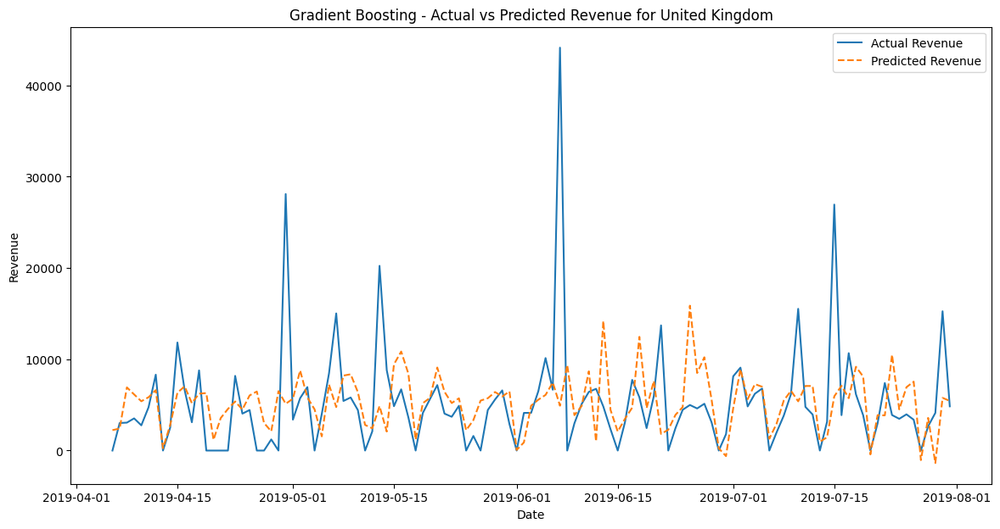

Model for United Kingdom saved as 'saved_models\gradient_boosting_model_United Kingdom_2019-07-31.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits


c:\Users\aidag\AppData\Local\anaconda3\envs\ibm-ai_workflow\lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best hyperparameters for EIRE: {'learning_rate': 0.01, 'max_depth': 5, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100, 'subsample': 0.8}
[EIRE] Test RMSE: 597.091841266523
[EIRE] Test MAE: 192.67278072762085
[EIRE] Test R^2: -0.010478688809791858


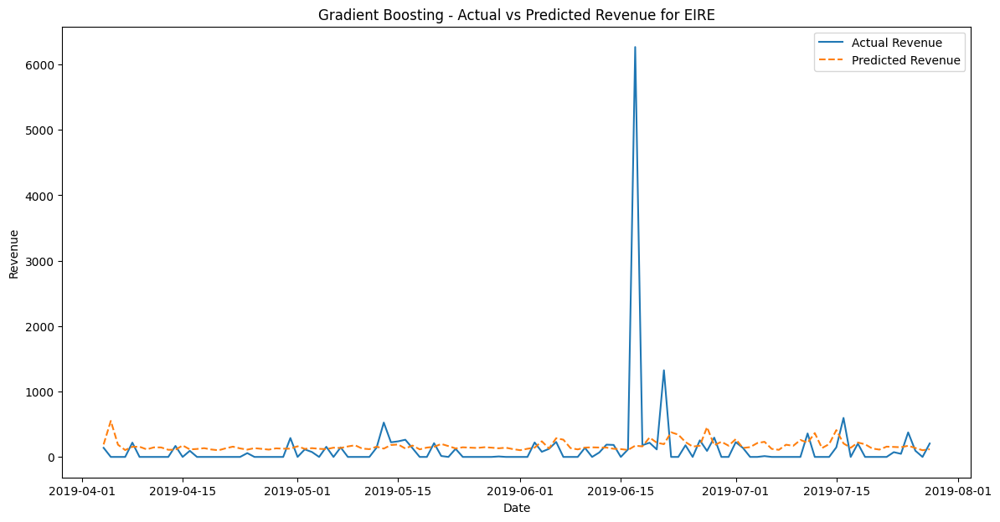

Model for EIRE saved as 'saved_models\gradient_boosting_model_EIRE_2019-07-28.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best hyperparameters for Germany: {'learning_rate': 0.01, 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200, 'subsample': 0.8}
[Germany] Test RMSE: 161.92470406385937
[Germany] Test MAE: 96.59132727239924
[Germany] Test R^2: -0.0790270744829491


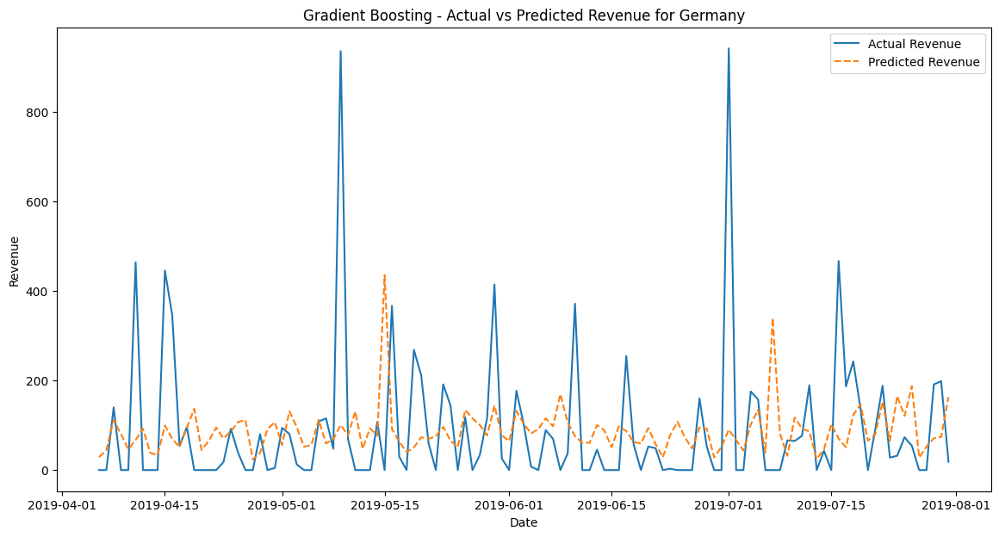

Model for Germany saved as 'saved_models\gradient_boosting_model_Germany_2019-07-31.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits


c:\Users\aidag\AppData\Local\anaconda3\envs\ibm-ai_workflow\lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best hyperparameters for France: {'learning_rate': 0.01, 'max_depth': 4, 'max_features': 'log2', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100, 'subsample': 1.0}
[France] Test RMSE: 87.41111504983748
[France] Test MAE: 69.95493691471734
[France] Test R^2: -0.16553127875343732


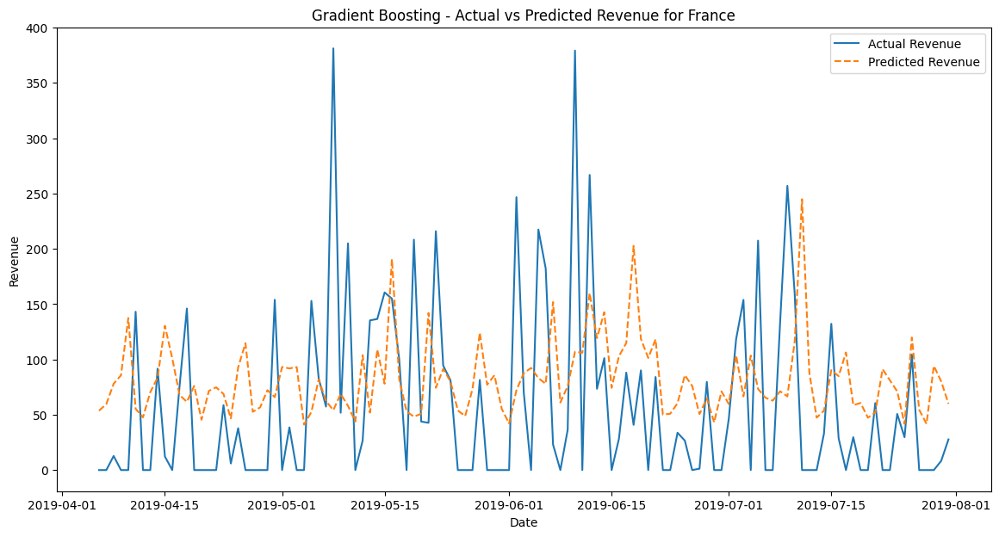

Model for France saved as 'saved_models\gradient_boosting_model_France_2019-07-31.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best hyperparameters for Norway: {'learning_rate': 0.01, 'max_depth': 3, 'max_features': 'log2', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100, 'subsample': 1.0}
[Norway] Test RMSE: 109.91787513291321
[Norway] Test MAE: 90.76970685527145
[Norway] Test R^2: -0.6289119571470227


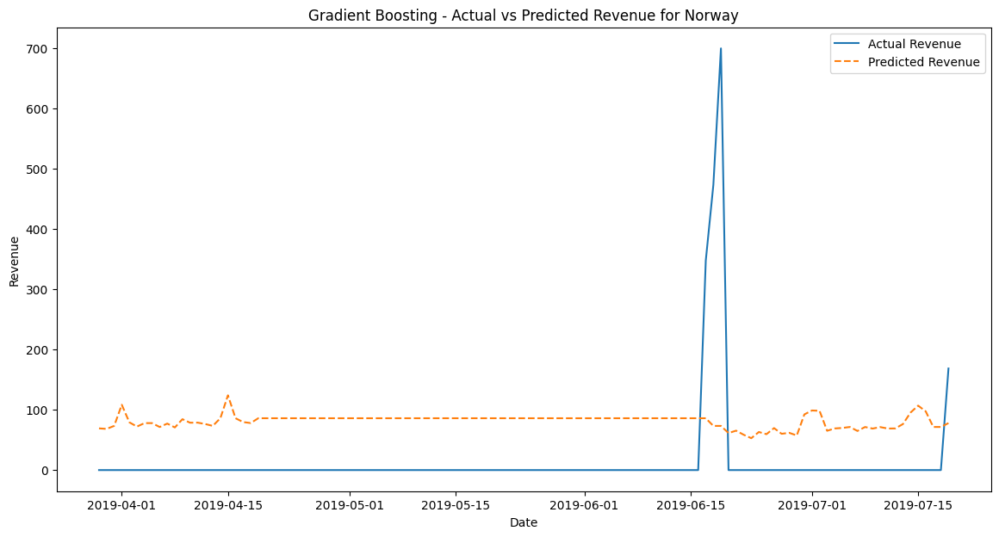

Model for Norway saved as 'saved_models\gradient_boosting_model_Norway_2019-07-19.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best hyperparameters for Spain: {'learning_rate': 0.05, 'max_depth': 4, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'subsample': 0.8}
[Spain] Test RMSE: 61.76201696817361
[Spain] Test MAE: 34.3872462734274
[Spain] Test R^2: -0.4034903465709343


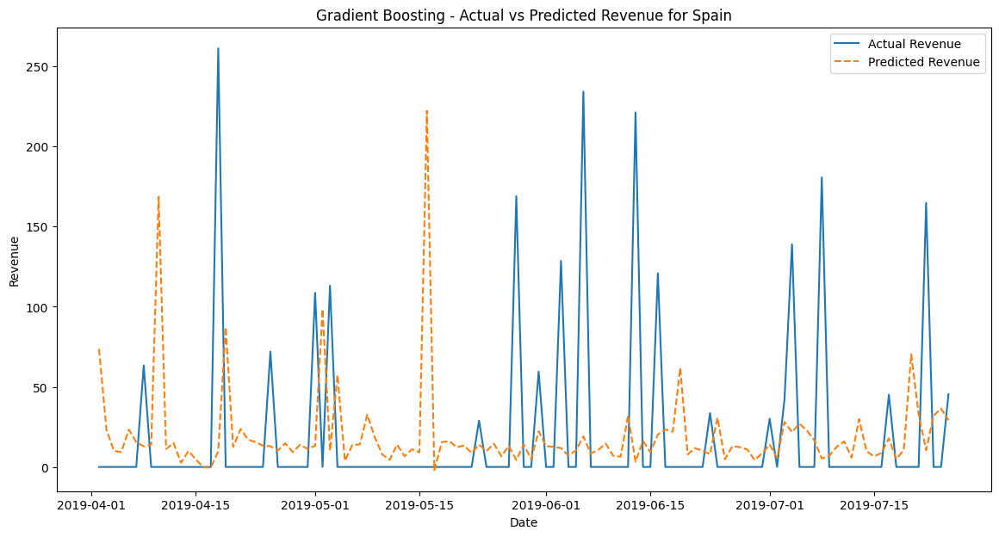

Model for Spain saved as 'saved_models\gradient_boosting_model_Spain_2019-07-25.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best hyperparameters for Hong Kong: {'learning_rate': 0.01, 'max_depth': 3, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 300, 'subsample': 0.8}
[Hong Kong] Test RMSE: 42.70365318878902
[Hong Kong] Test MAE: 39.511582255986994
[Hong Kong] Test R^2: -1.3533252942402085


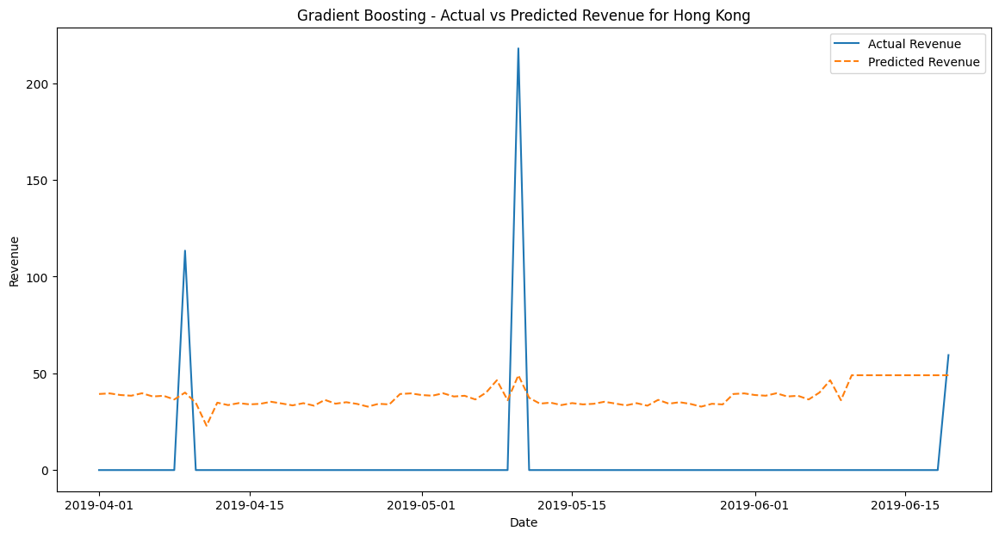

Model for Hong Kong saved as 'saved_models\gradient_boosting_model_Hong Kong_2019-06-19.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best hyperparameters for Portugal: {'learning_rate': 0.01, 'max_depth': 3, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100, 'subsample': 0.8}
[Portugal] Test RMSE: 575.5755285825131
[Portugal] Test MAE: 77.70013334981549
[Portugal] Test R^2: -0.010509305367494504


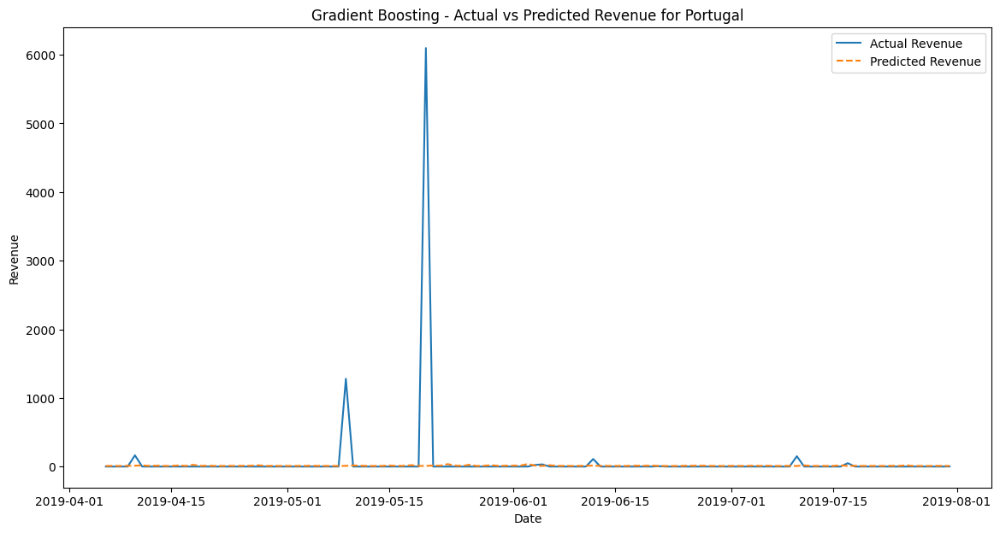

Model for Portugal saved as 'saved_models\gradient_boosting_model_Portugal_2019-07-31.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best hyperparameters for Singapore: {'learning_rate': 0.01, 'max_depth': 3, 'max_features': 'log2', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100, 'subsample': 0.8}
[Singapore] Test RMSE: 44.14822319823076
[Singapore] Test MAE: 40.94642694297939
[Singapore] Test R^2: -2.119721483966094


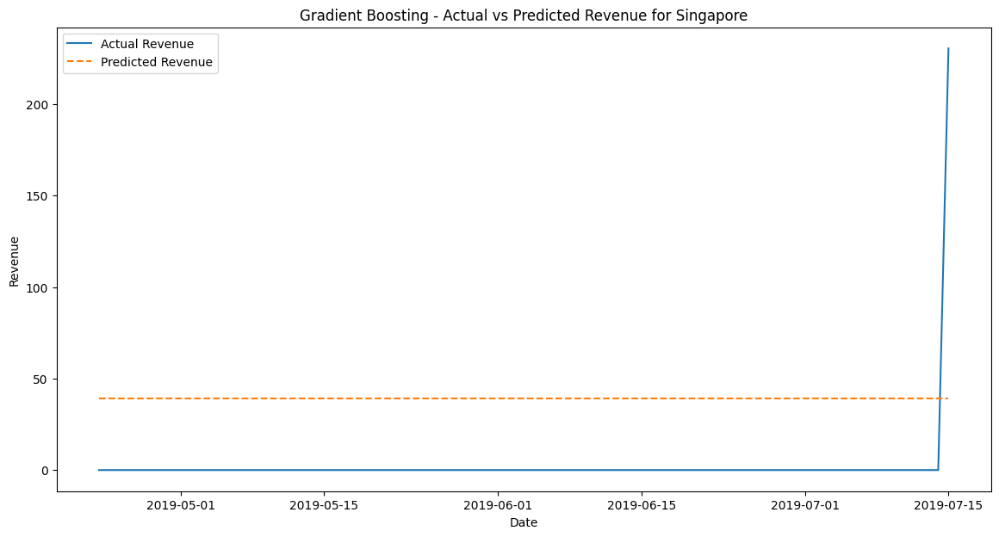

Model for Singapore saved as 'saved_models\gradient_boosting_model_Singapore_2019-07-15.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best hyperparameters for Netherlands: {'learning_rate': 0.01, 'max_depth': 3, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100, 'subsample': 1.0}
[Netherlands] Test RMSE: 49.277622456452626
[Netherlands] Test MAE: 30.52459405842742
[Netherlands] Test R^2: 0.017244016804259354


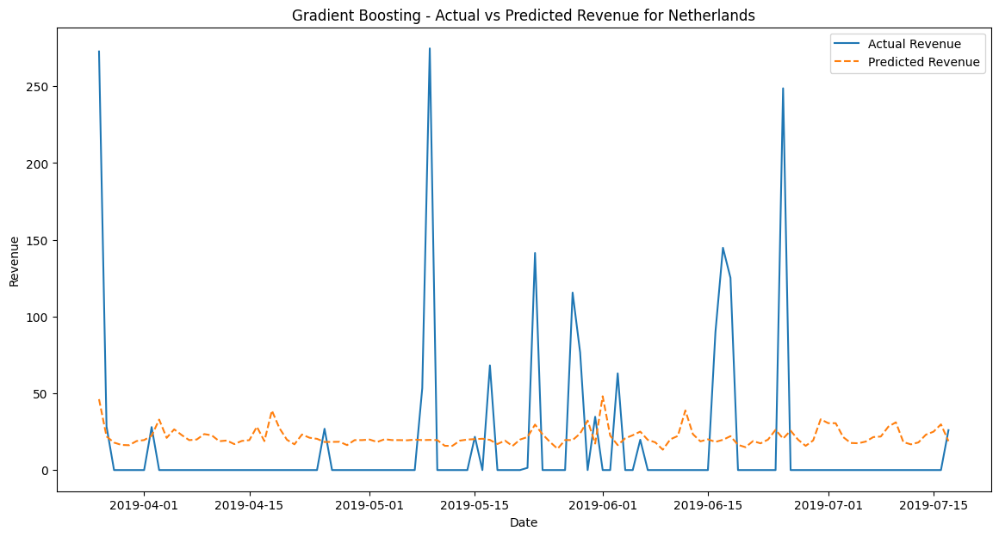

Model for Netherlands saved as 'saved_models\gradient_boosting_model_Netherlands_2019-07-17.pkl'
All models have been trained and saved successfully.


In [41]:
from sklearn.model_selection import train_test_split, GridSearchCV

# Directory to save models
model_dir = "saved_models"
if not os.path.exists(model_dir):
    os.makedirs(model_dir)

# Hyperparameter grid for tuning Gradient Boosting Regressor
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.8, 1.0],
    'max_features': ['sqrt', 'log2']
}


# Iterate through each country and its respective data
for country, df in country_lagged_revenues.items():
    X = df.drop('price', axis=1)
    y = df['price']

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    # Initialize and train the Gradient Boosting model
    model = GradientBoostingRegressor(n_estimators=100, random_state=42)
    # Grid search for hyperparameter tuning
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, 
                               scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=2)
    
    # Fit the model with the best hyperparameters
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_
    
    # Print the best hyperparameters
    print(f"Best hyperparameters for {country}: {grid_search.best_params_}")

    # Predict on the test set
    y_pred = best_model.predict(X_test)

    # Evaluate the model
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"[{country}] Test RMSE: {rmse}")
    print(f"[{country}] Test MAE: {mae}")
    print(f"[{country}] Test R^2: {r2}")

    # Plot actual vs predicted revenue for the specific country
    plt.figure(figsize=(14, 7))
    plt.plot(y_test.index, y_test, label='Actual Revenue')
    plt.plot(y_test.index, y_pred, label='Predicted Revenue', linestyle='--')
    plt.legend()
    plt.title(f'Gradient Boosting - Actual vs Predicted Revenue for {country}')
    plt.xlabel('Date')
    plt.ylabel('Revenue')
    plt.show()

    # Save the model and historical data together
    historical_data = df[-30:]  # Last 30 days of data
    model_data = {'model': best_model, 'historical_data': historical_data}

    # Save the trained model with the country name and last date in the dataset
    last_date = df.index[-1].strftime('%Y-%m-%d')
    model_filename = os.path.join(model_dir, f'gradient_boosting_model_{country}_{last_date}.pkl')
    
    with open(model_filename, 'wb') as model_file:
        pickle.dump(model_data, model_file)
    
    print(f"Model for {country} saved as '{model_filename}'")

print("All models have been trained and saved successfully.")

Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best hyperparameters for United Kingdom: {'learning_rate': 0.05, 'max_depth': 4, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'subsample': 0.8}
[United Kingdom] Test RMSE: 6129.675757011737
[United Kingdom] Test MAE: 3587.368310387634
[United Kingdom] Test R^2: -0.061831399893059746


c:\Users\aidag\AppData\Local\anaconda3\envs\ibm-ai_workflow\lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


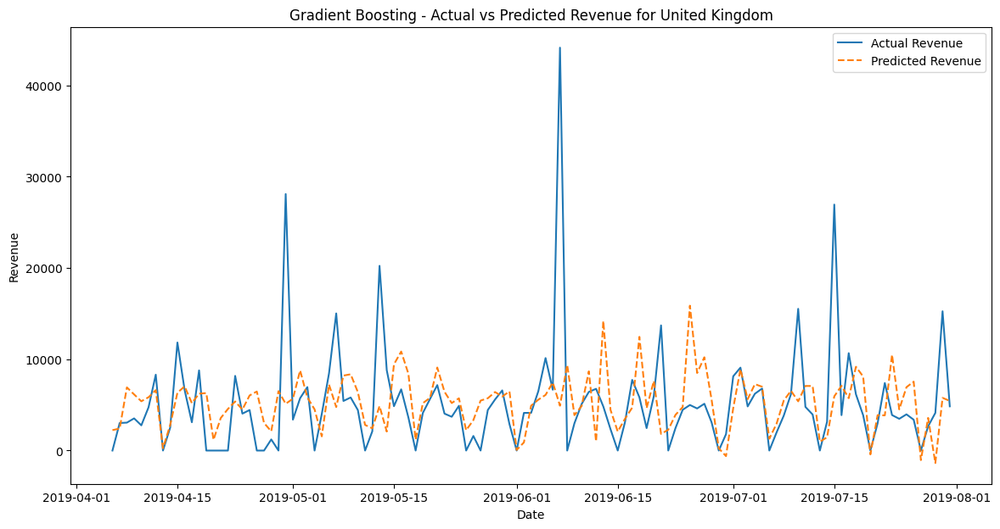

Model for United Kingdom saved as 'saved_models\gradient_boosting_model_United Kingdom_2019-07-31.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best hyperparameters for EIRE: {'learning_rate': 0.01, 'max_depth': 5, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100, 'subsample': 0.8}
[EIRE] Test RMSE: 597.091841266523
[EIRE] Test MAE: 192.67278072762085
[EIRE] Test R^2: -0.010478688809791858


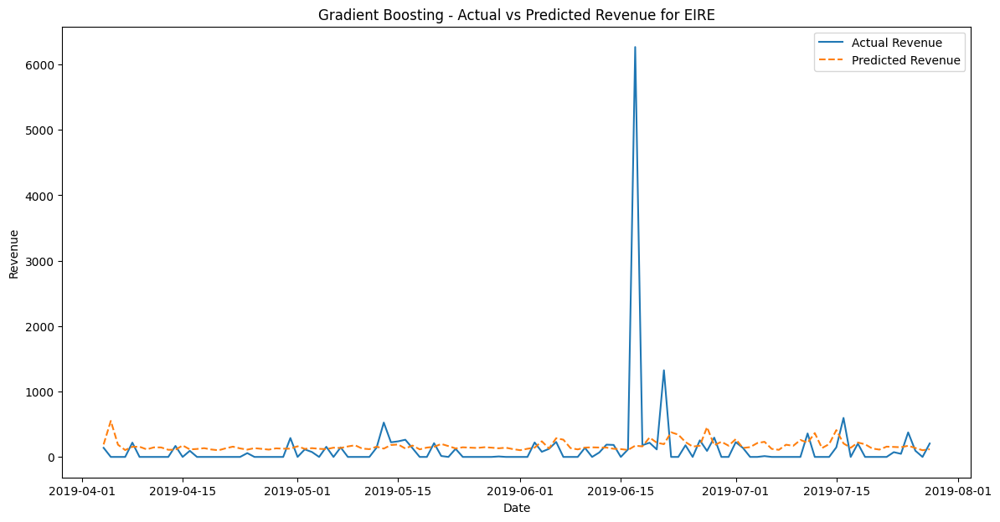

Model for EIRE saved as 'saved_models\gradient_boosting_model_EIRE_2019-07-28.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits


c:\Users\aidag\AppData\Local\anaconda3\envs\ibm-ai_workflow\lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best hyperparameters for Germany: {'learning_rate': 0.01, 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200, 'subsample': 0.8}
[Germany] Test RMSE: 161.92470406385937
[Germany] Test MAE: 96.59132727239924
[Germany] Test R^2: -0.0790270744829491


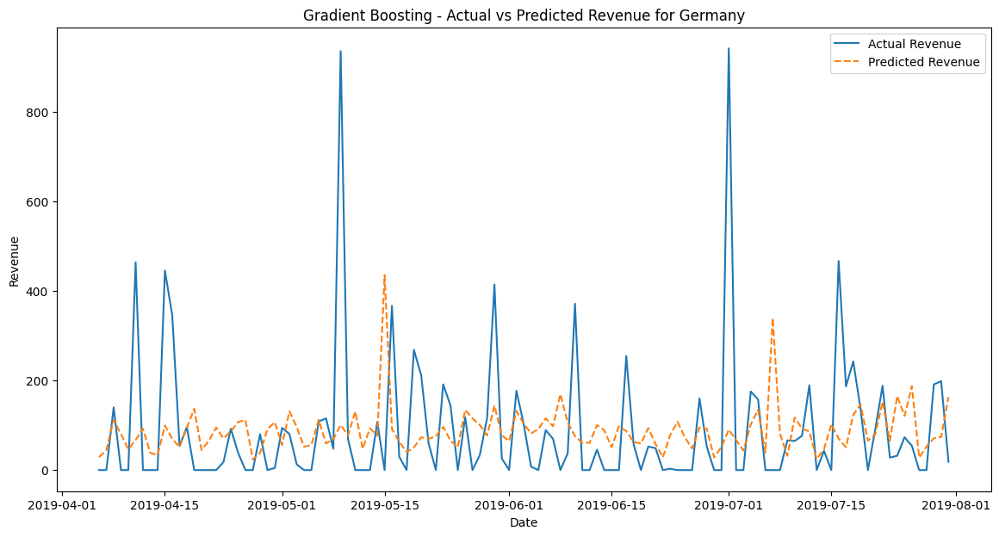

Model for Germany saved as 'saved_models\gradient_boosting_model_Germany_2019-07-31.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits


c:\Users\aidag\AppData\Local\anaconda3\envs\ibm-ai_workflow\lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best hyperparameters for France: {'learning_rate': 0.01, 'max_depth': 4, 'max_features': 'log2', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100, 'subsample': 1.0}
[France] Test RMSE: 87.41111504983748
[France] Test MAE: 69.95493691471734
[France] Test R^2: -0.16553127875343732


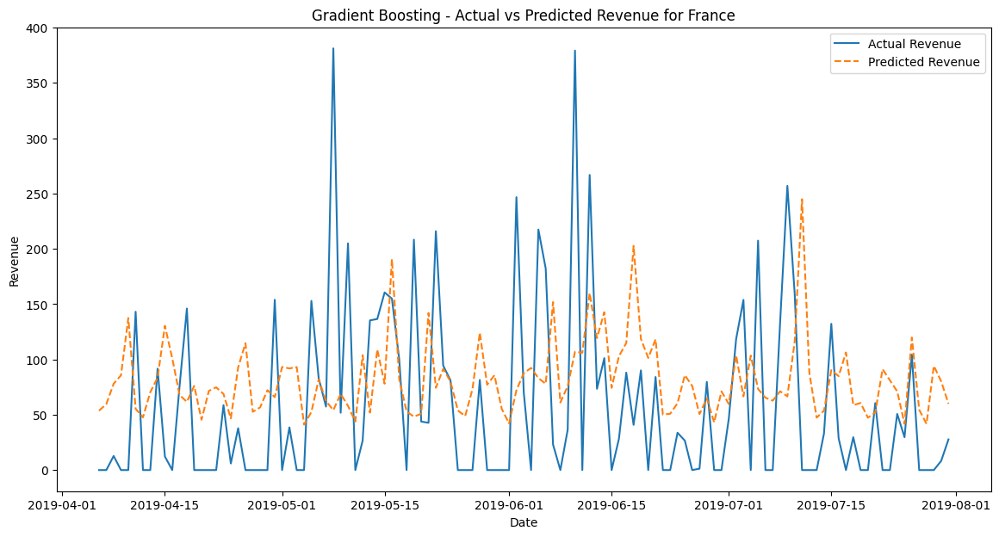

Model for France saved as 'saved_models\gradient_boosting_model_France_2019-07-31.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best hyperparameters for Norway: {'learning_rate': 0.01, 'max_depth': 3, 'max_features': 'log2', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100, 'subsample': 1.0}
[Norway] Test RMSE: 109.91787513291321
[Norway] Test MAE: 90.76970685527145
[Norway] Test R^2: -0.6289119571470227


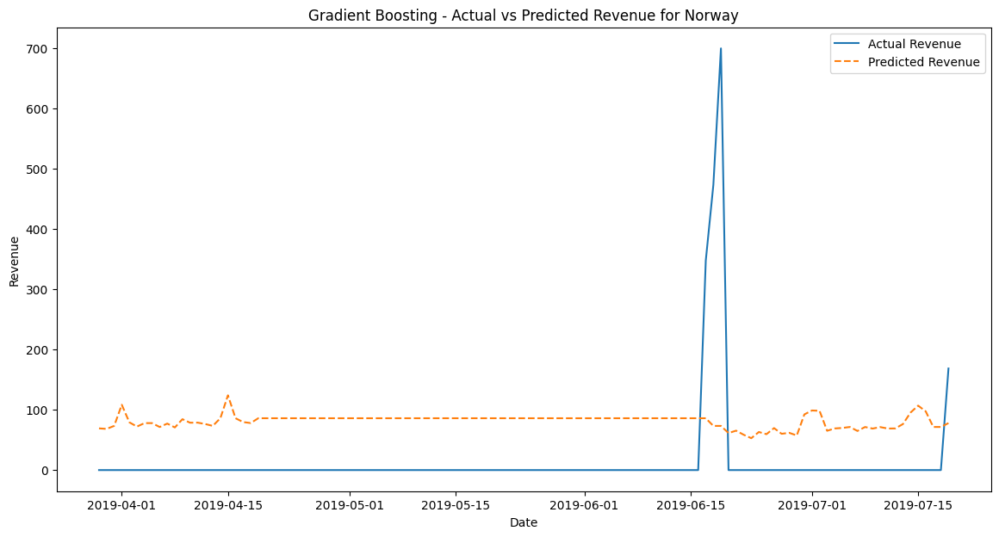

Model for Norway saved as 'saved_models\gradient_boosting_model_Norway_2019-07-19.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best hyperparameters for Spain: {'learning_rate': 0.05, 'max_depth': 4, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'subsample': 0.8}
[Spain] Test RMSE: 61.76201696817361
[Spain] Test MAE: 34.3872462734274
[Spain] Test R^2: -0.4034903465709343


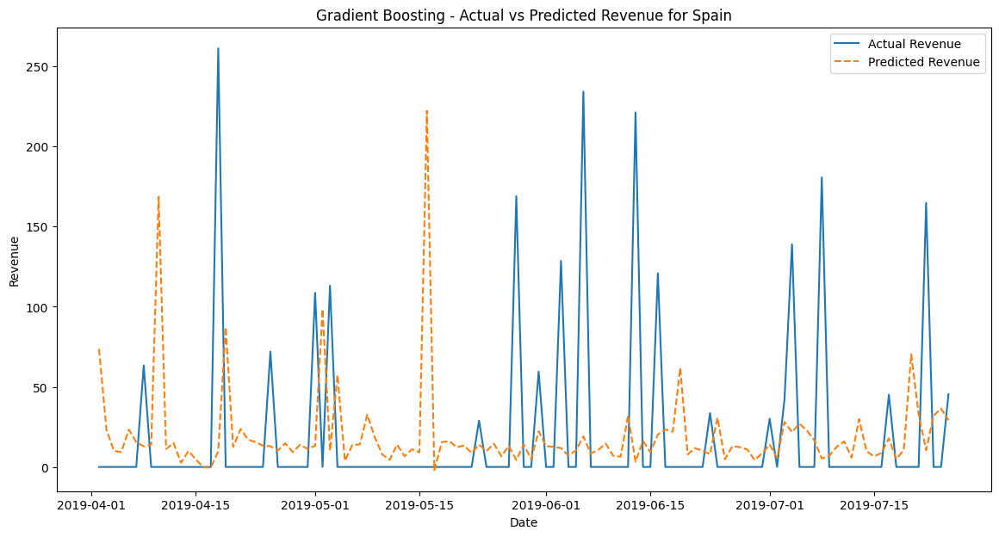

Model for Spain saved as 'saved_models\gradient_boosting_model_Spain_2019-07-25.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best hyperparameters for Hong Kong: {'learning_rate': 0.01, 'max_depth': 3, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 300, 'subsample': 0.8}
[Hong Kong] Test RMSE: 42.70365318878902
[Hong Kong] Test MAE: 39.511582255986994
[Hong Kong] Test R^2: -1.3533252942402085


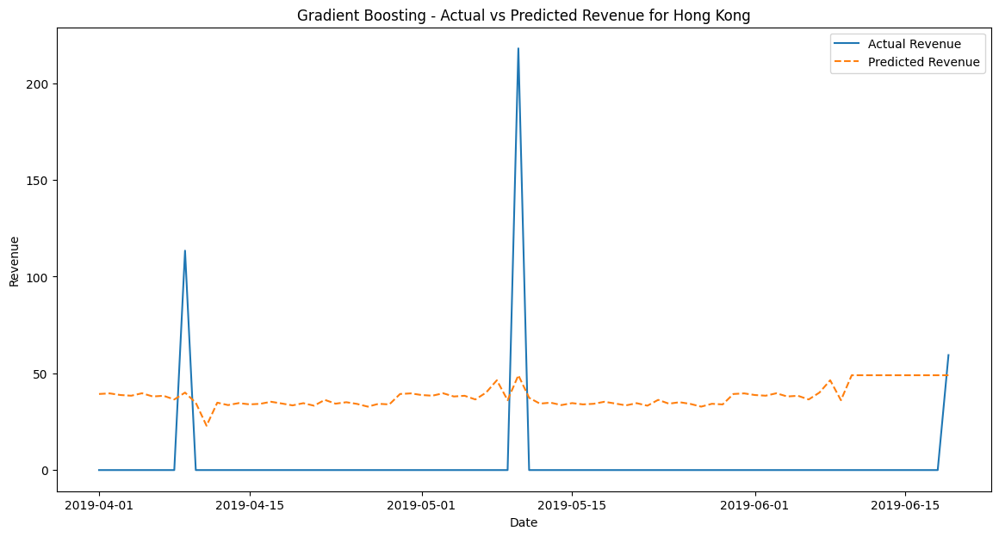

Model for Hong Kong saved as 'saved_models\gradient_boosting_model_Hong Kong_2019-06-19.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best hyperparameters for Portugal: {'learning_rate': 0.01, 'max_depth': 3, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100, 'subsample': 0.8}
[Portugal] Test RMSE: 575.5755285825131
[Portugal] Test MAE: 77.70013334981549
[Portugal] Test R^2: -0.010509305367494504


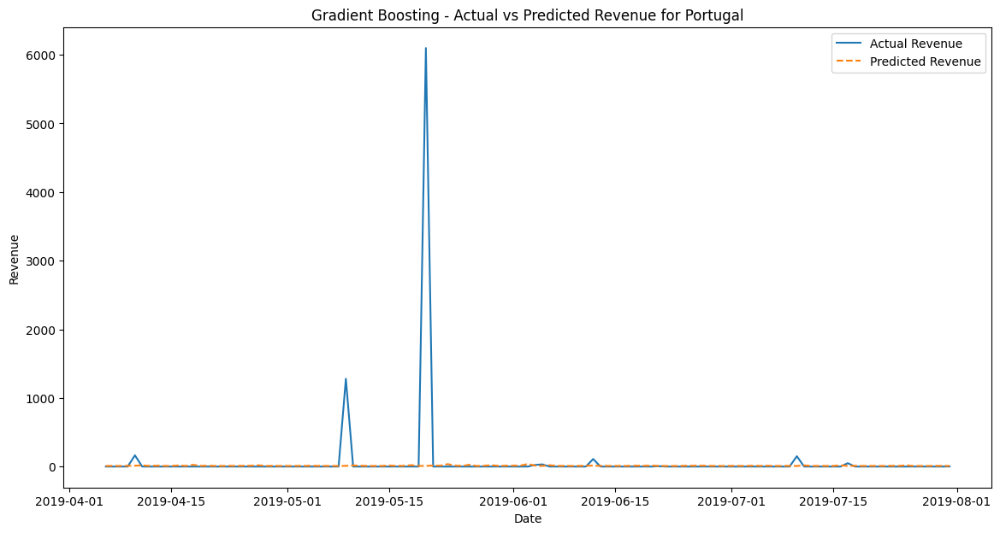

Model for Portugal saved as 'saved_models\gradient_boosting_model_Portugal_2019-07-31.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best hyperparameters for Singapore: {'learning_rate': 0.01, 'max_depth': 3, 'max_features': 'log2', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100, 'subsample': 0.8}
[Singapore] Test RMSE: 44.14822319823076
[Singapore] Test MAE: 40.94642694297939
[Singapore] Test R^2: -2.119721483966094


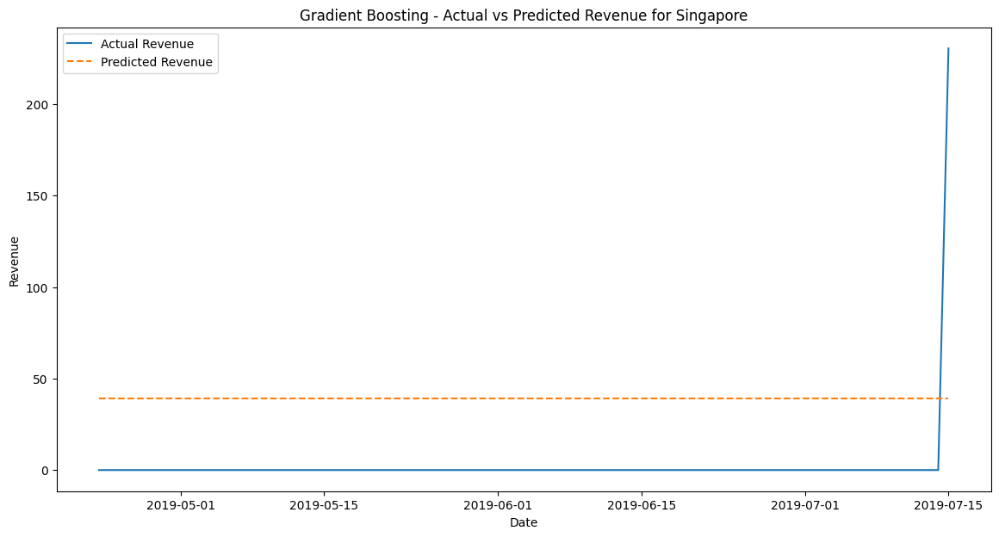

Model for Singapore saved as 'saved_models\gradient_boosting_model_Singapore_2019-07-15.pkl'
Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best hyperparameters for Netherlands: {'learning_rate': 0.01, 'max_depth': 3, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100, 'subsample': 1.0}
[Netherlands] Test RMSE: 49.277622456452626
[Netherlands] Test MAE: 30.52459405842742
[Netherlands] Test R^2: 0.017244016804259354


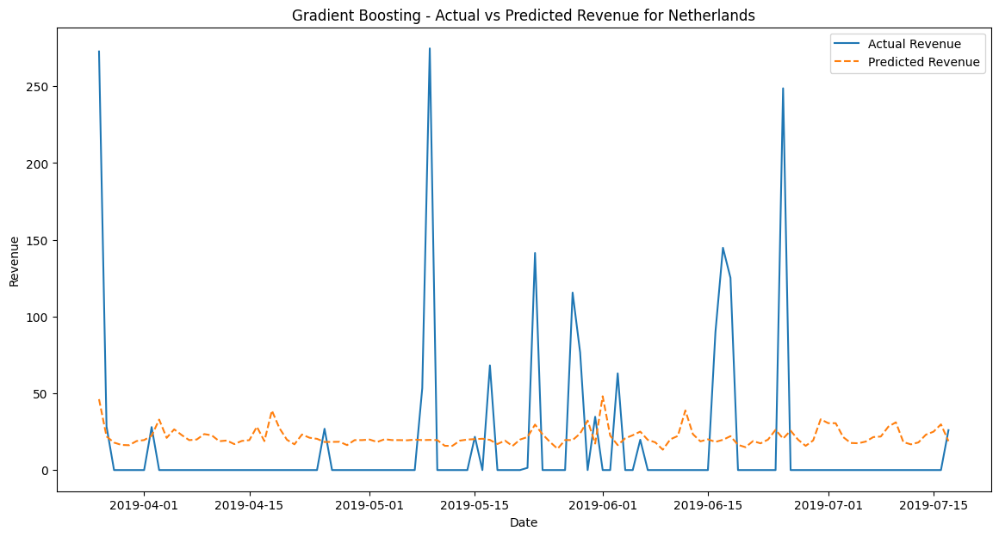

Model for Netherlands saved as 'saved_models\gradient_boosting_model_Netherlands_2019-07-17.pkl'
All models have been trained and saved successfully.


In [42]:
from sklearn.model_selection import train_test_split, GridSearchCV

# Directory to save models
model_dir = "saved_models"
if not os.path.exists(model_dir):
    os.makedirs(model_dir)

# Hyperparameter grid for tuning Gradient Boosting Regressor
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.8, 1.0],
    'max_features': ['sqrt', 'log2']
}


# Iterate through each country and its respective data
for country, df in country_lagged_revenues.items():
    X = df.drop('price', axis=1)
    y = df['price']

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    # Initialize and train the Gradient Boosting model
    model = GradientBoostingRegressor(n_estimators=100, random_state=42)
    # Grid search for hyperparameter tuning
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, 
                               scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
    
    # Fit the model with the best hyperparameters
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_
    
    # Print the best hyperparameters
    print(f"Best hyperparameters for {country}: {grid_search.best_params_}")

    # Predict on the test set
    y_pred = best_model.predict(X_test)

    # Evaluate the model
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"[{country}] Test RMSE: {rmse}")
    print(f"[{country}] Test MAE: {mae}")
    print(f"[{country}] Test R^2: {r2}")

    # Plot actual vs predicted revenue for the specific country
    plt.figure(figsize=(14, 7))
    plt.plot(y_test.index, y_test, label='Actual Revenue')
    plt.plot(y_test.index, y_pred, label='Predicted Revenue', linestyle='--')
    plt.legend()
    plt.title(f'Gradient Boosting - Actual vs Predicted Revenue for {country}')
    plt.xlabel('Date')
    plt.ylabel('Revenue')
    plt.show()

    # Save the model and historical data together
    historical_data = df[-30:]  # Last 30 days of data
    model_data = {'model': best_model, 'historical_data': historical_data}

    # Save the trained model with the country name and last date in the dataset
    last_date = df.index[-1].strftime('%Y-%m-%d')
    model_filename = os.path.join(model_dir, f'gradient_boosting_model_{country}_{last_date}.pkl')
    
    with open(model_filename, 'wb') as model_file:
        pickle.dump(model_data, model_file)
    
    print(f"Model for {country} saved as '{model_filename}'")

print("All models have been trained and saved successfully.")

In [37]:
df[-30:].reset_index()

,InvoiceDate,price,revenue_lag_1,revenue_lag_2,revenue_lag_3,revenue_lag_4,revenue_lag_5,revenue_lag_6,revenue_lag_7,revenue_lag_8,...,revenue_lag_21,revenue_lag_22,revenue_lag_23,revenue_lag_24,revenue_lag_25,revenue_lag_26,revenue_lag_27,revenue_lag_28,revenue_lag_29,revenue_lag_30
0,2019-06-18,125.21,144.77,89.84,0.00,0.00,0.00,0.00,0.00,0.00,...,115.60,0.00,0.00,0.00,0.00,141.38,1.45,0.00,0.00,0.00
1,2019-06-19,0.00,125.21,144.77,89.84,0.00,0.00,0.00,0.00,0.00,...,76.63,115.60,0.00,0.00,0.00,0.00,141.38,1.45,0.00,0.00
2,2019-06-20,0.00,0.00,125.21,144.77,89.84,0.00,0.00,0.00,0.00,...,0.00,76.63,115.60,0.00,0.00,0.00,0.00,141.38,1.45,0.00
3,2019-06-21,0.00,0.00,0.00,125.21,144.77,89.84,0.00,0.00,0.00,...,34.70,0.00,76.63,115.60,0.00,0.00,0.00,0.00,141.38,1.45
4,2019-06-22,0.00,0.00,0.00,0.00,125.21,144.77,89.84,0.00,0.00,...,0.00,34.70,0.00,76.63,115.60,0.00,0.00,0.00,0.00,141.38
5,2019-06-23,0.00,0.00,0.00,0.00,0.00,125.21,144.77,89.84,0.00,...,0.00,0.00,34.70,0.00,76.63,115.60,0.00,0.00,0.00,0.00
6,2019-06-24,0.00,0.00,0.00,0.00,0.00,0.00,125.21,144.77,89.84,...,63.00,0.00,0.00,34.70,0.00,76.63,115.60,0.00,0.00,0.00
7,2019-06-25,248.66,0.00,0.00,0.00,0.00,0.00,0.00,125.21,144.77,...,0.00,63.00,0.00,0.00,34.70,0.00,76.63,115.60,0.00,0.00
8,2019-06-26,0.00,248.66,0.00,0.00,0.00,0.00,0.00,0.00,125.21,...,0.00,0.00,63.00,0.00,0.00,34.70,0.00,76.63,115.60,0.00
9,2019-06-27,0.00,0.00,248.66,0.00,0.00,0.00,0.00,0.00,0.00,...,19.75,0.00,0.00,63.00,0.00,0.00,34.70,0.00,76.63,115.60


In [6]:
import os
import pickle
def load_model_and_last_date(country):
    # Locate the model file based on the country
    model_dir = "saved_models"
    model_file = max([f for f in os.listdir(model_dir) if f.startswith(f"gradient_boosting_model_{country}")])
    model_path = os.path.join(model_dir, model_file)
    
    # Load the model and historical data
    with open(model_path, 'rb') as f:
        model_data = pickle.load(f)
    
    model = model_data['model']
    historical_data = model_data['historical_data']
    
    # Extract the last date used in the model
    last_date_str = model_file.split('_')[-1].replace('.pkl', '')
    last_date = pd.to_datetime(last_date_str, format="%Y-%m-%d")
    
    return model, historical_data, last_date

# Example usage
country = "United Kingdom"
model, historical_data, last_date = load_model_and_last_date(country)

# You can now use `model`, `historical_data`, and `last_date` for predictions
print(f"Model loaded for {country}, with last training date on {last_date}")
print("Historical data used for the last 30 days:")
print(historical_data)

Model loaded for United Kingdom, with last training date on 2019-07-31 00:00:00
Historical data used for the last 30 days:
                 price  revenue_lag_1  revenue_lag_2  revenue_lag_3  \
InvoiceDate                                                           
2019-07-02    9084.940       8135.050       1793.980          0.000   
2019-07-03    4832.230       9084.940       8135.050       1793.980   
2019-07-04    6223.270       4832.230       9084.940       8135.050   
2019-07-05    6792.050       6223.270       4832.230       9084.940   
2019-07-06       0.000       6792.050       6223.270       4832.230   
2019-07-07    1976.140          0.000       6792.050       6223.270   
2019-07-08    3823.840       1976.140          0.000       6792.050   
2019-07-09    6185.210       3823.840       1976.140          0.000   
2019-07-10   15525.800       6185.210       3823.840       1976.140   
2019-07-11    4781.370      15525.800       6185.210       3823.840   
2019-07-12    3947.090   

In [60]:
from datetime import timedelta
import pandas as pd
import numpy as np

def predict_until_date(country, target_date):
    # Load the model and historical data
    model, historical_data, last_date = load_model_and_last_date(country)
    
    # Ensure target_date is after last_date
    if target_date <= last_date:
        raise ValueError("Target date must be after the last date used in model training.")
    
    # Start with the last row of historical data, excluding the 'price' column
    last_row = historical_data.iloc[-1:].copy().drop(columns=['price'])

    # Iterate over dates from the last date to the target date
    current_date = last_date + timedelta(days=1)
    predictions = []

    while current_date <= target_date:
        # Use the last row to make a prediction (only lags, no price)
        X_new = last_row.values.reshape(1, -1)
        
        # Predict the next day's price
        predicted_price = model.predict(X_new)[0]

        # Create a new row with the predicted price and shifted lag features
        new_row = np.append([predicted_price], X_new[0, :-1])  # Add new prediction, shift the lags

        # Convert to DataFrame for consistent formatting, exclude the 'price' column
        last_row = pd.DataFrame([new_row], columns=historical_data.columns[1:], index=[current_date])
        
        # Record the prediction
        predictions.append((current_date, predicted_price))
        
        # Move to the next day
        current_date += timedelta(days=1)
    
    # Convert predictions to a DataFrame
    predictions_df = pd.DataFrame(predictions, columns=['Date', 'Predicted_Price'])
    
    return predictions_df

# Example usage
country = "Spain"
target_date = pd.to_datetime("2019-08-31")  # User's desired prediction date

predictions = predict_until_date(country, target_date)
print(predictions)

         Date  Predicted_Price
0  2019-07-26        29.140530
1  2019-07-27         5.117296
2  2019-07-28        13.361268
3  2019-07-29         0.453858
4  2019-07-30         9.871715
5  2019-07-31        -2.311305
6  2019-08-01         6.943469
7  2019-08-02         5.108679
8  2019-08-03         6.786777
9  2019-08-04        19.440171
10 2019-08-05         7.400375
11 2019-08-06         5.340566
12 2019-08-07         8.825270
13 2019-08-08         9.495051
14 2019-08-09         8.649189
15 2019-08-10         5.794806
16 2019-08-11         8.111814
17 2019-08-12         6.720632
18 2019-08-13        12.801061
19 2019-08-14        -2.944891
20 2019-08-15         2.860282
21 2019-08-16         4.512772
22 2019-08-17        58.211305
23 2019-08-18        -1.796154
24 2019-08-19         0.275053
25 2019-08-20        10.634851
26 2019-08-21         3.953524
27 2019-08-22         7.989212
28 2019-08-23         9.117192
29 2019-08-24         7.443163
30 2019-08-25         2.534648
31 2019-

c:\Users\aidag\AppData\Local\anaconda3\envs\ibm-ai_workflow\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(
c:\Users\aidag\AppData\Local\anaconda3\envs\ibm-ai_workflow\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(
c:\Users\aidag\AppData\Local\anaconda3\envs\ibm-ai_workflow\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(
c:\Users\aidag\AppData\Local\anaconda3\envs\ibm-ai_workflow\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(
c:\Users\aidag\AppData\Local\anaconda3\envs\ibm-ai_workflow\lib\site-packages\sklearn\base.py:49

In [ ]:
# import os
# import pickle
# import pandas as pd
# from sklearn.ensemble import GradientBoostingRegressor
# from sklearn.model_selection import train_test_split

# def create_lag_features(df, lags):
#     for lag in lags:
#         df[f'revenue_lag_{lag}'] = df['price'].shift(lag)
#     return df

# # def retrain_model(country, historical_data):
# #     # Directory to save models
# #     model_dir = "saved_models"
# #     if not os.path.exists(model_dir):
# #         os.makedirs(model_dir)

# #     # Create lagged features using the provided function
# #     lags = list(range(1, 31))  # Creating 30 lags
# #     historical_data_with_lags = create_lag_features(historical_data, lags)
    
# #     # Drop rows with NaN values (which are the first 30 rows after creating lags)
# #     historical_data_with_lags.dropna(inplace=True)

# #     # Define features (X) and target (y)
# #     X = historical_data_with_lags.drop('price', axis=1)
# #     y = historical_data_with_lags['price']

# #     # Train-test split
# #     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# #     # Initialize and train the Gradient Boosting model
# #     model = GradientBoostingRegressor(n_estimators=100, random_state=42)
# #     model.fit(X_train, y_train)

# #     # Save the model and historical data together
# #     last_30_days = historical_data_with_lags[-30:]  # Last 30 days of data
# #     model_data = {'model': model, 'historical_data': last_30_days}

# #     # Save the trained model with the country name and last date in the dataset
# #     last_date = historical_data_with_lags.index[-1].strftime('%Y-%m-%d')
# #     model_filename = os.path.join(model_dir, f'gradient_boosting_model_{country}_{last_date}.pkl')

# #     # Remove the old model file if it exists
# #     old_models = [f for f in os.listdir(model_dir) if f.startswith(f'gradient_boosting_model_{country}_')]
# #     for old_model in old_models:
# #         os.remove(os.path.join(model_dir, old_model))

# #     # Save the new model
# #     with open(model_filename, 'wb') as model_file:
# #         pickle.dump(model_data, model_file)

# #     print(f"Model for {country} retrained and saved as '{model_filename}'")

# # Example of how to use the retrain_model function:
# # Assuming `country_revenue` is a dictionary with country names as keys and DataFrames as values
# # and you have `country_lagged_revenues` prepared similarly as in your earlier code.

# # # Retrieve and retrain model for a specific country with new data
# # new_historical_data = country_lagged_revenues["United Kingdom"]
# # retrain_model("United Kingdom", new_historical_data)

In [ ]:
historical_data_with_lags

In [ ]:
# import pandas as pd
# import numpy as np

# # Step 1: Generate synthetic data
# def generate_synthetic_data(start_date, end_date, country_name):
#     np.random.seed(42)  # For reproducibility
#     date_range = pd.date_range(start=start_date, end=end_date, freq='D')
#     prices = np.random.rand(len(date_range)) * 1000  # Random daily prices between 0 and 1000

#     # Create DataFrame
#     df = pd.DataFrame(data={'InvoiceDate': date_range, 'price': prices})
#     # df['country'] = country_name
#     df.set_index('InvoiceDate', inplace=True)

#     return df

# # Generate synthetic data for "United Kingdom" from 2019-01-01 to 2019-07-31
# new_historical_data = generate_synthetic_data('2018-12-02', '2019-09-30', 'United Kingdom')
# print(new_historical_data)

In [ ]:
# retrain_model("United Kingdom", new_historical_data)